In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Installing Required Libraries for NLP and Machine Learning**

In [ ]:
!pip install argostranslate
!pip install langdetect nest_asyncio
!pip install tensorflow==2.15 keras==2.15 tensorflow-addons==0.22.0
!pip install focal-loss
!pip install scikit-learn==1.2.2 imbalanced-learn==0.10.1

In [ ]:
# Install required libraries
!pip install nltk
!pip install plotly
!pip install imbalanced-learn
!pip install tensorflow-addons
!pip install focal-loss


# **Importing Required Libraries**

In [ ]:
# Standard Libraries
import os
import re
import string
import sys
import time
import warnings
import asyncio
import nest_asyncio
import urllib.request
import tempfile
from collections import Counter
from itertools import combinations

# Data Handling
import pandas as pd
import numpy as np

# Plotting Libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from wordcloud import WordCloud, STOPWORDS

# NLP Libraries
import nltk
from nltk.corpus import stopwords
from nltk.stem import SnowballStemmer
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import (classification_report, confusion_matrix, accuracy_score,
                             precision_score, recall_score, f1_score, roc_curve, auc,
                             precision_recall_curve)
from sklearn.model_selection import train_test_split
from langdetect import detect
from textblob import TextBlob

# Machine Learning
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.utils import class_weight
from scipy.sparse import hstack, csr_matrix
from scipy.stats import pointbiserialr, chi2_contingency

# TensorFlow & Keras
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import (Input, Embedding, LSTM, Bidirectional, Dense, Dropout,
                                    GlobalMaxPooling1D, concatenate, SpatialDropout1D,
                                    BatchNormalization, GRU, Conv1D, GlobalAveragePooling1D)
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
from tensorflow.keras.initializers import GlorotNormal, HeNormal
import tensorflow_addons as tfa
from focal_loss import BinaryFocalLoss
from tensorflow.keras.utils import plot_model

# Translation & Language
import argostranslate.package
import argostranslate.translate

# Other Libraries
from IPython.display import display, HTML
from google.colab import files


# **Loading and Inspecting the Datasets**

In [ ]:
# Load datasets
train_df = pd.read_csv('/kaggle/input/dataset/train.csv')
validation_df = pd.read_csv('/kaggle/input/dataset/validation.csv')
test_df = pd.read_csv('/kaggle/input/dataset/test.csv')
test_labels_df = pd.read_csv('/kaggle/input/dataset/test_labels.csv')  # For comparison

print("Original shapes:")
print(f"Training data: {train_df.shape}")
print(f"Validation data: {validation_df.shape}")
print(f"Test data: {test_df.shape}")
print(f"Test labels: {test_labels_df.shape}")

Original shapes:
Training data: (23473, 8)
Validation data: (840, 4)
Test data: (6000, 3)
Test labels: (6000, 2)


# **Exploratory data analysis (EDA) on Train Data**

In [ ]:
# Basic information
print("\n--- BASIC INFORMATION ---")
print(f"Dataset shape: {train_df.shape}")
print(f"Total elements: {train_df.size}")
print(f"Memory usage: {train_df.memory_usage().sum() / 1024**2:.2f} MB")


--- BASIC INFORMATION ---
Dataset shape: (23473, 16)
Total elements: 375568
Memory usage: 2.87 MB


In [ ]:

# Data types and null values
print("\n--- DATA TYPES AND NULL VALUES ---")
dtype_info = pd.DataFrame(train_df.dtypes).reset_index()
dtype_info.columns = ['Column', 'Data Type']
dtype_info['Null Count'] = train_df.isnull().sum().values
dtype_info['Null Percentage'] = (train_df.isnull().sum().values / len(train_df) * 100).round(2)
dtype_info['Unique Values'] = train_df.nunique().values
print(dtype_info.to_string())



--- DATA TYPES AND NULL VALUES ---
                Column Data Type  Null Count  Null Percentage  Unique Values
0                   id    object           0              0.0          23473
1        feedback_text    object           0              0.0          23473
2                toxic     int64           0              0.0              2
3              abusive     int64           0              0.0              2
4               vulgar     int64           0              0.0              2
5               menace     int64           0              0.0              2
6              offense     int64           0              0.0              2
7              bigotry     int64           0              0.0              2
8          text_length     int64           0              0.0           2254
9           word_count     int64           0              0.0            699
10  special_char_count     int64           0              0.0            225
11     uppercase_count     int64        

In [ ]:
# Numerical columns statistics
print("\n--- NUMERICAL COLUMNS STATISTICS ---")
numerical_cols = train_df.select_dtypes(include=['number']).columns
if len(numerical_cols) > 0:
    num_stats = train_df[numerical_cols].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).T
    num_stats['skew'] = train_df[numerical_cols].skew()
    num_stats['kurtosis'] = train_df[numerical_cols].kurtosis()
    print(num_stats.to_string())


--- NUMERICAL COLUMNS STATISTICS ---
                      count        mean         std  min    1%    5%   25%    50%    75%     95%      99%     max        skew      kurtosis
toxic               23473.0    0.093554    0.291214  0.0   0.0   0.0   0.0    0.0    0.0     1.0     1.00     1.0    2.791628      5.793680
abusive             23473.0    0.007498    0.086267  0.0   0.0   0.0   0.0    0.0    0.0     0.0     0.00     1.0   11.418999    128.404478
vulgar              23473.0    0.054318    0.226648  0.0   0.0   0.0   0.0    0.0    0.0     1.0     1.00     1.0    3.933143     13.470759
menace              23473.0    0.002812    0.052952  0.0   0.0   0.0   0.0    0.0    0.0     0.0     0.00     1.0   18.780293    350.729295
offense             23473.0    0.048992    0.215857  0.0   0.0   0.0   0.0    0.0    0.0     0.0     1.00     1.0    4.179121     15.466371
bigotry             23473.0    0.008222    0.090305  0.0   0.0   0.0   0.0    0.0    0.0     0.0     0.00     1.0   10.892

In [ ]:
# Categorical columns analysis (excluding 'id' column)
print("\n--- CATEGORICAL COLUMNS ANALYSIS ---")
categorical_cols = train_df.select_dtypes(include=['object', 'category']).columns

# Exclude 'id' column if present in categorical columns
categorical_cols = [col for col in categorical_cols if col != 'id']

if len(categorical_cols) > 0:
    for col in categorical_cols:
        print(f"\nColumn: {col}")
        value_counts = train_df[col].value_counts().head(10)  # Top 10 values
        print(f"Top values:\n{value_counts.to_string()}")
        print(f"Total unique values: {train_df[col].nunique()}")


--- CATEGORICAL COLUMNS ANALYSIS ---

Column: feedback_text
Top values:
feedback_text
Whales are mammals that take peoples money and spend it on Mcdonadls because they are fat asses and need to eat 50 pounds of food a day                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

In [ ]:
# Correlation analysis for numerical columns
if len(numerical_cols) > 1:
    print("\n--- CORRELATION ANALYSIS ---")
    correlation_matrix = train_df[numerical_cols].corr()

    # Get the top 10 highest correlations (excluding self-correlations)
    corr_pairs = []
    for i, col1 in enumerate(correlation_matrix.columns):
        for j, col2 in enumerate(correlation_matrix.columns):
            if i < j:  # To avoid duplicates and self-correlations
                corr_pairs.append((col1, col2, correlation_matrix.loc[col1, col2]))

    corr_pairs.sort(key=lambda x: abs(x[2]), reverse=True)
    print("Top correlations:")
    for col1, col2, corr in corr_pairs[:10]:
        print(f"{col1} and {col2}: {corr:.4f}")


--- CORRELATION ANALYSIS ---
Top correlations:
text_length and word_count: 0.9884
vulgar and toxic_count: 0.8883
toxic and toxic_count: 0.8799
offense and toxic_count: 0.8716
special_char_count and exclamation_count: 0.8366
vulgar and offense: 0.7485
toxic and vulgar: 0.7008
toxic and offense: 0.6638
text_length and special_char_count: 0.5113
word_count and special_char_count: 0.4541


In [ ]:
# Check for outliers in numerical columns
print("\n--- OUTLIER DETECTION ---")
for col in numerical_cols:
    q1 = train_df[col].quantile(0.25)
    q3 = train_df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = train_df[(train_df[col] < lower_bound) | (train_df[col] > upper_bound)][col]
    print(f"{col}: {len(outliers)} outliers detected ({(len(outliers)/len(train_df)*100):.2f}% of data)")


--- OUTLIER DETECTION ---
toxic: 2196 outliers detected (9.36% of data)
abusive: 176 outliers detected (0.75% of data)
vulgar: 1275 outliers detected (5.43% of data)
menace: 66 outliers detected (0.28% of data)
offense: 1150 outliers detected (4.90% of data)
bigotry: 193 outliers detected (0.82% of data)
text_length: 2197 outliers detected (9.36% of data)
word_count: 2154 outliers detected (9.18% of data)
special_char_count: 2138 outliers detected (9.11% of data)
uppercase_count: 2013 outliers detected (8.58% of data)
exclamation_count: 3321 outliers detected (14.15% of data)
question_count: 896 outliers detected (3.82% of data)
toxic_count: 2313 outliers detected (9.85% of data)


In [ ]:
# Detect potential duplicate rows
print("\n--- DUPLICATE ROWS ---")
duplicate_count = train_df.duplicated().sum()
print(f"Total duplicate rows: {duplicate_count} ({(duplicate_count/len(train_df)*100):.2f}% of data)")


--- DUPLICATE ROWS ---
Total duplicate rows: 0 (0.00% of data)


### **Text Analysis**

In [ ]:
print("\n--- TEXT ANALYSIS ---")
print(f"Total number of feedback texts: {len(train_df['feedback_text'])}")


--- TEXT ANALYSIS ---
Total number of feedback texts: 23473


In [ ]:
# Text length statistics
train_df['text_length'] = train_df['feedback_text'].apply(len)
print("\n--- TEXT LENGTH STATISTICS ---")
text_length_stats = train_df['text_length'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99])
print(text_length_stats)


--- TEXT LENGTH STATISTICS ---
count    23473.000000
mean       402.029736
std        617.165581
min          6.000000
1%          21.000000
5%          32.000000
25%         94.000000
50%        204.000000
75%        437.000000
95%       1409.800000
99%       3641.840000
max       5000.000000
Name: text_length, dtype: float64


In [ ]:
# Word count statistics
train_df['word_count'] = train_df['feedback_text'].apply(lambda x: len(str(x).split()))
print("\n--- WORD COUNT STATISTICS ---")
word_count_stats = train_df['word_count'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99])
print(word_count_stats)


--- WORD COUNT STATISTICS ---
count    23473.000000
mean        68.262344
std        103.357948
min          1.000000
1%           4.000000
5%           5.000000
25%         16.000000
50%         36.000000
75%         75.000000
95%        236.000000
99%        606.000000
max       1354.000000
Name: word_count, dtype: float64


In [ ]:
# Distribution of toxic vs non-toxic
print("\n--- CLASS DISTRIBUTION ---")
for col in ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']:
    print(f"{col.capitalize()} distribution:")
    value_counts = train_df[col].value_counts(normalize=True) * 100
    for value, percentage in value_counts.items():
        print(f"  {value}: {percentage:.2f}%")


--- CLASS DISTRIBUTION ---
Toxic distribution:
  0: 90.64%
  1: 9.36%
Abusive distribution:
  0: 99.25%
  1: 0.75%
Vulgar distribution:
  0: 94.57%
  1: 5.43%
Menace distribution:
  0: 99.72%
  1: 0.28%
Offense distribution:
  0: 95.10%
  1: 4.90%
Bigotry distribution:
  0: 99.18%
  1: 0.82%


In [ ]:
# Analyze text characteristics by class
print("\n--- TEXT CHARACTERISTICS BY CLASS ---")
for col in ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']:
    print(f"\n{col.capitalize()} Analysis:")
    toxic_texts = train_df[train_df[col] == 1]
    non_toxic_texts = train_df[train_df[col] == 0]

    print(f"  Average text length - {col.capitalize()}: {toxic_texts['text_length'].mean():.2f} characters")
    print(f"  Average text length - Non-{col.capitalize()}: {non_toxic_texts['text_length'].mean():.2f} characters")

    print(f"  Average word count - {col.capitalize()}: {toxic_texts['word_count'].mean():.2f} words")
    print(f"  Average word count - Non-{col.capitalize()}: {non_toxic_texts['word_count'].mean():.2f} words")


--- TEXT CHARACTERISTICS BY CLASS ---

Toxic Analysis:
  Average text length - Toxic: 268.20 characters
  Average text length - Non-Toxic: 415.84 characters
  Average word count - Toxic: 46.66 words
  Average word count - Non-Toxic: 70.49 words

Abusive Analysis:
  Average text length - Abusive: 591.76 characters
  Average text length - Non-Abusive: 400.60 characters
  Average word count - Abusive: 97.19 words
  Average word count - Non-Abusive: 68.04 words

Vulgar Analysis:
  Average text length - Vulgar: 282.91 characters
  Average text length - Non-Vulgar: 408.87 characters
  Average word count - Vulgar: 48.28 words
  Average word count - Non-Vulgar: 69.41 words

Menace Analysis:
  Average text length - Menace: 329.44 characters
  Average text length - Non-Menace: 402.23 characters
  Average word count - Menace: 59.27 words
  Average word count - Non-Menace: 68.29 words

Offense Analysis:
  Average text length - Offense: 275.29 characters
  Average text length - Non-Offense: 408.56

In [ ]:
# Analyze most frequent words in toxic vs non-toxic texts
print("\n--- MOST FREQUENT WORDS ANALYSIS ---")

def preprocess_text(text):
    # Convert to lowercase and remove punctuation
    text = text.lower()
    text = re.sub(f'[{re.escape(string.punctuation)}]', '', text)
    return text

# Get most common words in toxic texts (for 'toxic' column)
print("\nMost common words in toxic texts:")
toxic_texts = train_df[train_df['toxic'] == 1]['feedback_text'].apply(preprocess_text)
non_toxic_texts = train_df[train_df['toxic'] == 0]['feedback_text'].apply(preprocess_text)

# Use CountVectorizer to get word frequencies
vectorizer = CountVectorizer(stop_words='english', max_features=20)
toxic_word_counts = vectorizer.fit_transform(toxic_texts)
toxic_words = vectorizer.get_feature_names_out()
toxic_word_freq = toxic_word_counts.sum(axis=0).tolist()[0]
toxic_word_freq = sorted(zip(toxic_words, toxic_word_freq), key=lambda x: x[1], reverse=True)

for word, count in toxic_word_freq[:10]:
    print(f"  {word}: {count}")




--- MOST FREQUENT WORDS ANALYSIS ---

Most common words in toxic texts:
  fuck: 960
  faggot: 827
  fucking: 778
  die: 712
  ass: 609
  like: 534
  youfuck: 530
  bitch: 451
  dont: 419
  suck: 343


In [ ]:
# Analyze co-occurrence of different toxic labels
print("\n--- CO-OCCURRENCE OF TOXIC LABELS ---")
label_cols = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']
co_occurrence = pd.DataFrame(index=label_cols, columns=label_cols, data=0)

for i, label1 in enumerate(label_cols):
    for label2 in label_cols:
        # Count rows where both labels are 1
        co_occurrence.loc[label1, label2] = ((train_df[label1] == 1) & (train_df[label2] == 1)).sum()

print(co_occurrence)


--- CO-OCCURRENCE OF TOXIC LABELS ---
         toxic  abusive  vulgar  menace  offense  bigotry
toxic     2196      176    1205      63     1087      177
abusive    176      176     164      10      147       35
vulgar    1205      164    1275      44      922      146
menace      63       10      44      66       46       15
offense   1087      147     922      46     1150      149
bigotry    177       35     146      15      149      193


In [ ]:
# Calculate percentage of co-occurrence
print("\n--- CO-OCCURRENCE PERCENTAGES ---")
percentage_matrix = pd.DataFrame(index=label_cols, columns=label_cols, data=0.0)

for i, label1 in enumerate(label_cols):
    total_label1 = train_df[label1].sum()
    for label2 in label_cols:
        if total_label1 > 0:
            percentage_matrix.loc[label1, label2] = (co_occurrence.loc[label1, label2] / total_label1) * 100
        else:
            percentage_matrix.loc[label1, label2] = 0

print(percentage_matrix.round(2))


--- CO-OCCURRENCE PERCENTAGES ---
          toxic  abusive  vulgar  menace  offense  bigotry
toxic    100.00     8.01   54.87    2.87    49.50     8.06
abusive  100.00   100.00   93.18    5.68    83.52    19.89
vulgar    94.51    12.86  100.00    3.45    72.31    11.45
menace    95.45    15.15   66.67  100.00    69.70    22.73
offense   94.52    12.78   80.17    4.00   100.00    12.96
bigotry   91.71    18.13   75.65    7.77    77.20   100.00


In [ ]:
# Class imbalance analysis
print("\n--- CLASS IMBALANCE ANALYSIS ---")
for col in label_cols:
    positive_count = train_df[col].sum()
    negative_count = len(train_df) - positive_count
    imbalance_ratio = negative_count / positive_count if positive_count > 0 else float('inf')
    print(f"{col.capitalize()} - Positive:Negative ratio = 1:{imbalance_ratio:.2f}")



--- CLASS IMBALANCE ANALYSIS ---
Toxic - Positive:Negative ratio = 1:9.69
Abusive - Positive:Negative ratio = 1:132.37
Vulgar - Positive:Negative ratio = 1:17.41
Menace - Positive:Negative ratio = 1:354.65
Offense - Positive:Negative ratio = 1:19.41
Bigotry - Positive:Negative ratio = 1:120.62


In [ ]:
# Add previously calculated columns
train_df['text_length'] = train_df['feedback_text'].apply(len)
train_df['word_count'] = train_df['feedback_text'].apply(lambda x: len(str(x).split()))

# Define toxic classes
toxic_classes = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

# Define text preprocessor
def preprocess_text(text):
    # Convert to lowercase and remove punctuation
    text = text.lower()
    text = re.sub(f'[{re.escape(string.punctuation)}]', '', text)
    return text

# N-gram analysis
print("\n--- N-GRAM ANALYSIS ---")
for n in [2, 3]:
    print(f"\nTop {n}-grams in toxic content:")

    # Combine all toxic texts
    all_toxic_texts = []
    for toxic_class in toxic_classes:
        toxic_texts = train_df[train_df[toxic_class] == 1]['feedback_text'].apply(preprocess_text).tolist()
        all_toxic_texts.extend(toxic_texts)

    # Use CountVectorizer to get n-gram frequencies
    vectorizer = CountVectorizer(
        ngram_range=(n, n),
        stop_words='english',
        max_features=15
    )

    # Handle empty lists
    if all_toxic_texts:
        ngram_counts = vectorizer.fit_transform(all_toxic_texts)
        ngrams = vectorizer.get_feature_names_out()
        ngram_freq = ngram_counts.sum(axis=0).tolist()[0]
        ngram_freq = sorted(zip(ngrams, ngram_freq), key=lambda x: x[1], reverse=True)

        for ngram, count in ngram_freq[:10]:
            print(f"  '{ngram}': {count}")
    else:
        print("  No toxic texts found for n-gram analysis")


--- N-GRAM ANALYSIS ---

Top 2-grams in toxic content:
  'faggot faggot': 2140
  'youfuck youfuck': 1551
  'ass ass': 1349
  'assfuck assfuck': 1104
  'die die': 1057
  'bitch bitch': 1040
  'die motherfucker': 900
  'motherfucker die': 900
  'veggietales sucks': 848
  'sucks veggietales': 844

Top 3-grams in toxic content:
  'faggot faggot faggot': 2133
  'youfuck youfuck youfuck': 1512
  'ass ass ass': 1344
  'assfuck assfuck assfuck': 1100
  'bitch bitch bitch': 1036
  'motherfucker die die': 900
  'die die motherfucker': 896
  'die motherfucker die': 892
  'sucks veggietales sucks': 844
  'veggietales sucks veggietales': 844


In [ ]:
# Calculate point-biserial correlation between text features and toxic classes
print("\n--- CORRELATION BETWEEN TEXT FEATURES AND TOXIC CLASSES ---")
text_features = ['text_length', 'word_count']

correlation_results = []
for feature in text_features:
    for toxic_class in toxic_classes:
        correlation, p_value = pointbiserialr(train_df[toxic_class], train_df[feature])
        correlation_results.append({
            'Feature': feature,
            'Toxic Class': toxic_class,
            'Correlation': correlation,
            'P-value': p_value
        })

# Convert to DataFrame and sort
correlation_df = pd.DataFrame(correlation_results)
correlation_df = correlation_df.sort_values('Correlation', ascending=False)
print(correlation_df.to_string(index=False))


--- CORRELATION BETWEEN TEXT FEATURES AND TOXIC CLASSES ---
    Feature Toxic Class  Correlation      P-value
text_length     abusive     0.026720 4.234515e-05
 word_count     abusive     0.024329 1.931220e-04
 word_count      menace    -0.004619 4.792126e-01
text_length      menace    -0.006246 3.386351e-01
 word_count     bigotry    -0.022511 5.625189e-04
text_length     bigotry    -0.024159 2.141654e-04
text_length      vulgar    -0.046260 1.332476e-12
 word_count      vulgar    -0.046333 1.228665e-12
text_length     offense    -0.046612 9.010884e-13
 word_count     offense    -0.047825 2.283711e-13
 word_count       toxic    -0.067160 6.998528e-25
text_length       toxic    -0.069667 1.183229e-26


In [ ]:
# Statistical tests for independence between toxic classes
print("\n--- CHI-SQUARE TEST FOR INDEPENDENCE BETWEEN TOXIC CLASSES ---")
chi_square_results = []

for i, class1 in enumerate(toxic_classes):
    for j, class2 in enumerate(toxic_classes):
        if i < j:  # To avoid duplicate tests
            # Create contingency table
            contingency_table = pd.crosstab(train_df[class1], train_df[class2])

            # Perform chi-square test
            chi2, p, dof, expected = chi2_contingency(contingency_table)

            chi_square_results.append({
                'Class 1': class1,
                'Class 2': class2,
                'Chi-Square': chi2,
                'P-value': p,
                'Degrees of Freedom': dof
            })

# Convert to DataFrame and display
chi_square_df = pd.DataFrame(chi_square_results)
chi_square_df = chi_square_df.sort_values('Chi-Square', ascending=False)
print(chi_square_df.to_string(index=False))


--- CHI-SQUARE TEST FOR INDEPENDENCE BETWEEN TOXIC CLASSES ---
Class 1 Class 2   Chi-Square       P-value  Degrees of Freedom
 vulgar offense 13135.684006  0.000000e+00                   1
  toxic  vulgar 11517.898049  0.000000e+00                   1
  toxic offense 10332.382332  0.000000e+00                   1
abusive  vulgar  2641.025006  0.000000e+00                   1
abusive offense  2335.761203  0.000000e+00                   1
offense bigotry  2167.816223  0.000000e+00                   1
 vulgar bigotry  1854.028137  0.000000e+00                   1
  toxic abusive  1707.390215  0.000000e+00                   1
  toxic bigotry  1546.587485  0.000000e+00                   1
abusive bigotry   766.958270 8.243610e-169                   1
 menace offense   582.583568 1.028263e-128                   1
  toxic  menace   568.436817 1.228434e-125                   1
 vulgar  menace   471.264792 1.700363e-104                   1
 menace bigotry   362.978382  6.324950e-81            

In [ ]:
# Special character and punctuation analysis
print("\n--- SPECIAL CHARACTER ANALYSIS ---")

# Define function to count special characters
def count_special_chars(text):
    return len(re.findall(r'[!@#$%^&*(),.?":{}|<>]', text))

def count_uppercase_chars(text):
    return sum(1 for c in text if c.isupper())

def count_exclamation_marks(text):
    return text.count('!')

def count_question_marks(text):
    return text.count('?')

# Add new features
train_df['special_char_count'] = train_df['feedback_text'].apply(count_special_chars)
train_df['uppercase_count'] = train_df['feedback_text'].apply(count_uppercase_chars)
train_df['exclamation_count'] = train_df['feedback_text'].apply(count_exclamation_marks)
train_df['question_count'] = train_df['feedback_text'].apply(count_question_marks)

# Calculate and display statistics by toxic class
special_features = ['special_char_count', 'uppercase_count', 'exclamation_count', 'question_count']
for toxic_class in toxic_classes:
    print(f"\n{toxic_class.capitalize()} vs Special Characters:")

    toxic_df = train_df[train_df[toxic_class] == 1]
    non_toxic_df = train_df[train_df[toxic_class] == 0]

    for feature in special_features:
        toxic_mean = toxic_df[feature].mean()
        non_toxic_mean = non_toxic_df[feature].mean()

        print(f"  Average {feature}: {toxic_class}={toxic_mean:.2f}, non-{toxic_class}={non_toxic_mean:.2f}")


--- SPECIAL CHARACTER ANALYSIS ---

Toxic vs Special Characters:
  Average special_char_count: toxic=12.77, non-toxic=13.72
  Average uppercase_count: toxic=42.35, non-toxic=15.35
  Average exclamation_count: toxic=5.26, non-toxic=0.31
  Average question_count: toxic=0.51, non-toxic=0.43

Abusive vs Special Characters:
  Average special_char_count: abusive=46.89, non-abusive=13.38
  Average uppercase_count: abusive=195.22, non-abusive=16.54
  Average exclamation_count: abusive=36.56, non-abusive=0.50
  Average question_count: abusive=0.36, non-abusive=0.44

Vulgar vs Special Characters:
  Average special_char_count: vulgar=15.02, non-vulgar=13.55
  Average uppercase_count: vulgar=56.67, non-vulgar=15.65
  Average exclamation_count: vulgar=7.52, non-vulgar=0.39
  Average question_count: vulgar=0.48, non-vulgar=0.43

Menace vs Special Characters:
  Average special_char_count: menace=13.23, non-menace=13.63
  Average uppercase_count: menace=80.05, non-menace=17.70
  Average exclamation_c

In [ ]:
# Analysis of multi-label texts
print("\n--- MULTI-LABEL ANALYSIS ---")

# Calculate the number of toxic classes per text
train_df['toxic_count'] = train_df[toxic_classes].sum(axis=1)

# Distribution of number of toxic labels
toxic_count_dist = train_df['toxic_count'].value_counts().sort_index()
print("Number of toxic labels per text:")
for count, frequency in toxic_count_dist.items():
    percentage = (frequency / len(train_df)) * 100
    print(f"  {count} labels: {frequency} texts ({percentage:.2f}%)")


--- MULTI-LABEL ANALYSIS ---
Number of toxic labels per text:
  0 labels: 21160 texts (90.15%)
  1 labels: 844 texts (3.60%)
  2 labels: 511 texts (2.18%)
  3 labels: 692 texts (2.95%)
  4 labels: 219 texts (0.93%)
  5 labels: 44 texts (0.19%)
  6 labels: 3 texts (0.01%)


In [ ]:
# Most common combinations of toxic labels
print("\nMost common combinations of toxic labels:")

# Create a column with the combination of toxic labels
def get_label_combination(row):
    labels = []
    for toxic_class in toxic_classes:
        if row[toxic_class] == 1:
            labels.append(toxic_class)
    return '+'.join(labels) if labels else 'none'

train_df['label_combination'] = train_df.apply(get_label_combination, axis=1)
label_combinations = train_df['label_combination'].value_counts().head(10)

for combination, count in label_combinations.items():
    percentage = (count / len(train_df)) * 100
    print(f"  {combination}: {count} ({percentage:.2f}%)")


Most common combinations of toxic labels:
  none: 21160 (90.15%)
  toxic: 758 (3.23%)
  toxic+vulgar+offense: 631 (2.69%)
  toxic+vulgar: 275 (1.17%)
  toxic+offense: 173 (0.74%)
  toxic+abusive+vulgar+offense: 107 (0.46%)
  toxic+vulgar+offense+bigotry: 84 (0.36%)
  vulgar: 42 (0.18%)
  offense: 32 (0.14%)
  toxic+abusive+vulgar+offense+bigotry: 30 (0.13%)


### **COMPREHENSIVE EDA SUMMARY**

In [ ]:
train_df['text_length'] = train_df['feedback_text'].apply(len)
train_df['word_count'] = train_df['feedback_text'].apply(lambda x: len(str(x).split()))
train_df['special_char_count'] = train_df['feedback_text'].apply(lambda x: len(re.findall(r'[!@#$%^&*(),.?":{}|<>]', x)))
train_df['uppercase_count'] = train_df['feedback_text'].apply(lambda x: sum(1 for c in x if c.isupper()))
train_df['exclamation_count'] = train_df['feedback_text'].apply(lambda x: x.count('!'))
train_df['question_count'] = train_df['feedback_text'].apply(lambda x: x.count('?'))

# Define toxic classes
toxic_classes = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

# Calculate number of toxic labels per text
train_df['toxic_count'] = train_df[toxic_classes].sum(axis=1)

print("\n========== COMPREHENSIVE EDA SUMMARY ==========")

print("\n=== DATASET OVERVIEW ===")
print(f"Total number of records: {len(train_df)}")
print(f"Dataset shape: {train_df.shape}")
print(f"Memory usage: {train_df.memory_usage().sum() / 1024**2:.2f} MB")

print("\n=== TEXT PROPERTIES SUMMARY ===")
print(f"Average text length: {train_df['text_length'].mean():.2f} characters")
print(f"Average word count: {train_df['word_count'].mean():.2f} words")
print(f"Average special character count: {train_df['special_char_count'].mean():.2f}")
print(f"Average uppercase character count: {train_df['uppercase_count'].mean():.2f}")
print(f"Average exclamation mark count: {train_df['exclamation_count'].mean():.2f}")
print(f"Average question mark count: {train_df['question_count'].mean():.2f}")

print("\n=== CLASS DISTRIBUTION SUMMARY ===")
for col in toxic_classes:
    positive_count = train_df[col].sum()
    positive_percentage = (positive_count / len(train_df)) * 100
    print(f"{col.capitalize()}: {positive_count} ({positive_percentage:.2f}%)")

print("\n=== CLASS IMBALANCE SUMMARY ===")
for col in toxic_classes:
    positive_count = train_df[col].sum()
    negative_count = len(train_df) - positive_count
    imbalance_ratio = negative_count / positive_count if positive_count > 0 else float('inf')
    print(f"{col.capitalize()} - Positive:Negative ratio = 1:{imbalance_ratio:.2f}")

print("\n=== MULTI-LABEL CLASSIFICATION SUMMARY ===")
# Number of texts with at least one toxic label
toxic_texts_count = len(train_df[train_df['toxic_count'] > 0])
print(f"Texts with at least one toxic label: {toxic_texts_count} ({toxic_texts_count/len(train_df)*100:.2f}%)")

# Distribution of number of toxic labels
toxic_count_dist = train_df['toxic_count'].value_counts().sort_index()
print("Number of toxic labels per text:")
for count, frequency in toxic_count_dist.items():
    percentage = (frequency / len(train_df)) * 100
    print(f"  {count} labels: {frequency} texts ({percentage:.2f}%)")

print("\n=== TOP TOXIC LABEL COMBINATIONS ===")
def get_label_combination(row):
    labels = []
    for toxic_class in toxic_classes:
        if row[toxic_class] == 1:
            labels.append(toxic_class)
    return '+'.join(labels) if labels else 'none'

train_df['label_combination'] = train_df.apply(get_label_combination, axis=1)
label_combinations = train_df['label_combination'].value_counts().head(5)

for combination, count in label_combinations.items():
    percentage = (count / len(train_df)) * 100
    print(f"  {combination}: {count} ({percentage:.2f}%)")

print("\n=== KEY CORRELATION FINDINGS ===")
# Correlation between toxic labels
print("Strongest correlations between toxic labels:")
corr_matrix = train_df[toxic_classes].corr()
corr_pairs = []
for i, col1 in enumerate(toxic_classes):
    for j, col2 in enumerate(toxic_classes):
        if i < j:
            corr_pairs.append((col1, col2, corr_matrix.loc[col1, col2]))

corr_pairs.sort(key=lambda x: abs(x[2]), reverse=True)
for col1, col2, corr in corr_pairs[:5]:
    print(f"  {col1} and {col2}: {corr:.4f}")

print("\n=== TOXIC VS NON-TOXIC TEXT CHARACTERISTICS ===")
print("Comparing average text properties between toxic and non-toxic texts:")

features = ['text_length', 'word_count', 'special_char_count',
            'uppercase_count', 'exclamation_count', 'question_count']

# Any toxic label
any_toxic = train_df['toxic_count'] > 0
toxic_df = train_df[any_toxic]
non_toxic_df = train_df[~any_toxic]

feature_comparisons = []
for feature in features:
    toxic_mean = toxic_df[feature].mean()
    non_toxic_mean = non_toxic_df[feature].mean()
    percent_diff = ((toxic_mean - non_toxic_mean) / non_toxic_mean) * 100

    feature_comparisons.append({
        'Feature': feature,
        'Toxic Mean': toxic_mean,
        'Non-Toxic Mean': non_toxic_mean,
        'Percent Difference': percent_diff
    })

feature_df = pd.DataFrame(feature_comparisons)
feature_df = feature_df.sort_values('Percent Difference', ascending=False)

for _, row in feature_df.iterrows():
    diff_sign = "higher" if row['Percent Difference'] > 0 else "lower"
    print(f"  {row['Feature']}: {row['Toxic Mean']:.2f} vs {row['Non-Toxic Mean']:.2f} "
          f"({abs(row['Percent Difference']):.2f}% {diff_sign} in toxic texts)")

print("\n=== KEY INSIGHTS ===")
print("1. Most text instances in the dataset are non-toxic, with only ~10% having at least one toxic label.")
print("2. 'Toxic' is the most common toxic label, followed by 'vulgar' and 'offense'.")
print("3. 'Menace' is the rarest toxic label, with an extreme imbalance ratio of 1:354.")
print("4. Strong correlations exist between 'vulgar' and 'offense', 'toxic' and 'vulgar', and 'toxic' and 'offense'.")
print("5. Toxic texts tend to have:")
print("   - Higher counts of exclamation marks and uppercase characters")
print("   - Slightly shorter text length and fewer words on average")
print("6. Most toxic content contains multiple toxic labels, suggesting overlapping toxic categories.")
print("7. The dataset shows no duplicate rows, indicating unique text instances.")

print("\n========== END OF EDA SUMMARY ==========\n")


========== COMPREHENSIVE EDA SUMMARY ==========

=== DATASET OVERVIEW ===
Total number of records: 23473
Dataset shape: (23473, 16)
Memory usage: 2.87 MB

=== TEXT PROPERTIES SUMMARY ===
Average text length: 402.03 characters
Average word count: 68.26 words
Average special character count: 13.63
Average uppercase character count: 17.88
Average exclamation mark count: 0.77
Average question mark count: 0.44

=== CLASS DISTRIBUTION SUMMARY ===
Toxic: 2196 (9.36%)
Abusive: 176 (0.75%)
Vulgar: 1275 (5.43%)
Menace: 66 (0.28%)
Offense: 1150 (4.90%)
Bigotry: 193 (0.82%)

=== CLASS IMBALANCE SUMMARY ===
Toxic - Positive:Negative ratio = 1:9.69
Abusive - Positive:Negative ratio = 1:132.37
Vulgar - Positive:Negative ratio = 1:17.41
Menace - Positive:Negative ratio = 1:354.65
Offense - Positive:Negative ratio = 1:19.41
Bigotry - Positive:Negative ratio = 1:120.62

=== MULTI-LABEL CLASSIFICATION SUMMARY ===
Texts with at least one toxic label: 2313 (9.85%)
Number of toxic labels per text:
  0 labe

## **Visualization on Train Data**

In [ ]:
# Download required NLTK data
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# Set style for better visualizations
sns.set_theme()
plt.rcParams['figure.figsize'] = [10, 8]

In [ ]:
def load_and_clean_data(file_path):
    """Load and perform initial cleaning of the dataset"""
    train_df = pd.read_csv(file_path)
    print("\nDataset Info:")
    display(train_df.info())
    print("\nFirst few rows:")
    display(train_df.head())
    print("\nBasic statistics:")
    display(train_df.describe())
    return train_df


def clean_text(text):
    """Clean text data"""
    # Convert to lowercase
    text = text.lower()
    # Remove special characters and digits
    text = re.sub(r'[^a-zA-Z\s]', '', text)
    return text

def simple_tokenize(text):
    """Simple word tokenization"""
    return text.split()

def analyze_text_columns(train_df):
    """Perform NLP analysis on text columns"""
    text_columns = ['feedback_text']  # We know we want to analyze the feedback text
    stop_words = set(stopwords.words('english'))

    for column in text_columns:
        print(f"\nAnalysis for {column}:")

        # Basic text statistics
        train_df[f'{column}_length'] = train_df[column].str.len()
        print(f"\nText length statistics for {column}:")
        display(train_df[f'{column}_length'].describe())

        # Clean and combine all text
        all_text = ' '.join(train_df[column].apply(clean_text))

        # Create word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(all_text)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Word Cloud for {column}')
        plt.show()

        # Tokenize and analyze
        tokens = simple_tokenize(all_text)
        tokens = [word for word in tokens if word.isalnum() and word not in stop_words]

        # Get word frequency
        word_freq = pd.Series(tokens).value_counts()
        print(f"\nTop 10 most common words in {column}:")
        display(word_freq.head(10))

        # Plot word frequency
        plt.figure(figsize=(12, 6))
        word_freq.head(20).plot(kind='bar')
        plt.title(f'Top 20 Most Common Words in {column}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

def analyze_numerical_columns(train_df):
    """Analyze numerical columns"""
    numerical_columns = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

    # Overall statistics
    print("\nLabel Distribution:")
    for col in numerical_columns:
        print(f"\n{col.capitalize()} distribution:")
        display(train_df[col].value_counts(normalize=True).round(3))

        # Create distribution plot
        plt.figure(figsize=(8, 5))
        sns.countplot(data=train_df, x=col)
        plt.title(f'Distribution of {col.capitalize()} Labels')
        plt.show()
    print()
    # Correlation analysis
    plt.figure(figsize=(10, 8))
    sns.heatmap(train_df[numerical_columns].corr(), annot=True, cmap='coolwarm')
    plt.title('Correlation between Labels')
    plt.tight_layout()
    plt.show()

def analyze_text_length_vs_labels(train_df):
    """Analyze relationship between text length and labels"""
    train_df['text_length'] = train_df['feedback_text'].str.len()

    # Box plots for text length vs each label
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

    plt.figure(figsize=(15, 10))
    for i, label in enumerate(labels, 1):
        plt.subplot(2, 3, i)
        sns.boxplot(data=train_df, x=label, y='text_length')
        plt.title(f'Text Length vs {label.capitalize()}')
    plt.tight_layout()
    plt.show()

def analyze_label_cooccurrence(train_df):
    """Analyze how different labels co-occur in the dataset"""
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

    # Create co-occurrence matrix
    cooccurrence = pd.DataFrame(0, index=labels, columns=labels)
    for i, j in combinations(labels, 2):
        cooccurrence.loc[i, j] = cooccurrence.loc[j, i] = train_df[(train_df[i] == 1) & (train_df[j] == 1)].shape[0]

    print("Plot co-occurrence heatmap")
    # Plot co-occurrence heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(cooccurrence, annot=True, fmt='d', cmap='YlOrRd')
    plt.title('Label Co-occurrence Matrix')
    plt.tight_layout()
    plt.show()


def analyze_text_length_distribution(train_df):
    """Analyze the distribution of text lengths in detail"""
    # Create bins for text length
    train_df['length_bin'] = pd.cut(train_df['text_length'],
                            bins=[0, 50, 100, 200, 500, 1000, float('inf')],
                            labels=['0-50', '51-100', '101-200', '201-500', '501-1000', '1000+'])

    print("Plot length distribution")
    # Plot length distribution
    plt.figure(figsize=(12, 6))
    train_df['length_bin'].value_counts().sort_index().plot(kind='bar')
    plt.title('Distribution of Text Lengths')
    plt.xlabel('Text Length (characters)')
    plt.ylabel('Number of Samples')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

    print()
    print("Plot length distribution by label")
    # Plot length distribution by label
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']
    plt.figure(figsize=(15, 10))
    for i, label in enumerate(labels, 1):
        plt.subplot(2, 3, i)
        sns.histplot(data=train_df, x='text_length', hue=label, bins=50, multiple="stack")
        plt.title(f'Text Length Distribution by {label.capitalize()}')
    plt.tight_layout()
    plt.show()

def analyze_word_frequency_by_label(train_df):
    """Analyze word frequencies for each label"""
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']
    stop_words = set(stopwords.words('english'))

    for label in labels:
        # Get texts for positive and negative samples
        positive_texts = train_df[train_df[label] == 1]['feedback_text'].apply(clean_text)
        negative_texts = train_df[train_df[label] == 0]['feedback_text'].apply(clean_text)

        # Get word frequencies
        positive_words = ' '.join(positive_texts).split()
        negative_words = ' '.join(negative_texts).split()

        positive_words = [w for w in positive_words if w not in stop_words]
        negative_words = [w for w in negative_words if w not in stop_words]

        # Get top words
        positive_freq = Counter(positive_words).most_common(20)
        negative_freq = Counter(negative_words).most_common(20)

        # Plot comparison
        plt.figure(figsize=(15, 6))
        words, counts = zip(*positive_freq)
        plt.bar(words, counts, alpha=0.5, label=f'{label.capitalize()} (1)')
        words, counts = zip(*negative_freq)
        plt.bar(words, counts, alpha=0.5, label=f'{label.capitalize()} (0)')
        plt.title(f'Top 20 Words by {label.capitalize()} Label')
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        print()
        plt.show()

def analyze_character_level(train_df):
    """Analyze character-level patterns in the text"""
    # Calculate character frequencies
    all_text = ' '.join(train_df['feedback_text'].apply(clean_text))
    char_freq = Counter(all_text)

    # Plot character frequency
    plt.figure(figsize=(15, 6))
    chars, counts = zip(*char_freq.most_common(20))
    plt.bar(chars, counts)
    plt.title('Top 20 Most Common Characters')
    plt.xlabel('Character')
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


def analyze_label_distribution_pie(train_df):
    """Analyze label distribution using pie charts"""
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

    print("Plot individual pie charts")
    # Plot individual pie charts
    plt.figure(figsize=(15, 10))
    for i, label in enumerate(labels, 1):
        plt.subplot(2, 3, i)
        train_df[label].value_counts().plot.pie(autopct='%1.1f%%', startangle=90,
                                             labels=['Non-'+label.capitalize(), label.capitalize()])
        plt.title(f'Distribution of {label.capitalize()} Label')
    plt.tight_layout()
    plt.show()

    print()
    print("Plot overall label distribution")
    # Plot overall label distribution
    label_sums = train_df[labels].sum()
    plt.figure(figsize=(10, 8))
    label_sums.plot.pie(autopct='%1.1f%%', startangle=90)
    plt.title('Distribution of Labels')
    plt.tight_layout()
    plt.show()

def analyze_label_venn_diagram(train_df):
    """Use plotly to visualize label overlaps"""
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

    # Create a binary string for each row indicating which labels are present
    train_df['label_pattern'] = train_df[labels].apply(lambda row: ''.join(['1' if val else '0' for val in row]), axis=1)

    # Count occurrences of each pattern
    pattern_counts = train_df['label_pattern'].value_counts().head(10)

    # Plot the top 10 patterns
    fig = px.bar(x=pattern_counts.index, y=pattern_counts.values,
                labels={'x': 'Label Pattern', 'y': 'Count'},
                title='Top 10 Label Patterns',
                text=pattern_counts.values)

    # Add pattern explanations
    annotations = []
    for i, pattern in enumerate(pattern_counts.index):
        pattern_labels = [f"<b>{label}</b>" if digit == '1' else f"not {label}"
                         for digit, label in zip(pattern, labels)]
        annotation = '<br>'.join(pattern_labels)
        annotations.append(annotation)

    fig.update_layout(
        xaxis_title="Pattern",
        yaxis_title="Count",
        showlegend=False,
        annotations=[
            dict(
                x=i,
                y=count,
                text=annotation,
                showarrow=True,
                arrowhead=2,
                arrowsize=1,
                arrowwidth=2,
                arrowcolor="#636363",
                ax=0,
                ay=-80,
                bgcolor="#f9f9f9",
                bordercolor="#c7c7c7",
                borderpad=4
            ) for i, (count, annotation) in enumerate(zip(pattern_counts.values, annotations))
        ]
    )

    fig.show()

def analyze_text_complexity(train_df):
    """Analyze text complexity metrics"""
    # Calculate word count
    train_df['word_count'] = train_df['feedback_text'].apply(lambda x: len(str(x).split()))

    # Calculate average word length
    train_df['avg_word_length'] = train_df['feedback_text'].apply(
        lambda x: np.mean([len(word) for word in str(x).split()]) if len(str(x).split()) > 0 else 0
    )

    # Plot relationship between text complexity and labels
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

    fig = make_subplots(rows=2, cols=3, subplot_titles=[f"{label.capitalize()}" for label in labels])

    for i, label in enumerate(labels):
        row, col = (i // 3) + 1, (i % 3) + 1

        # Create box plot
        fig.add_trace(
            go.Box(x=train_df[label], y=train_df['word_count'], name='Word Count'),
            row=row, col=col
        )

    fig.update_layout(height=600, width=900, title_text="Text Complexity vs Labels")
    fig.show()

def analyze_label_correlation_network(train_df):
    """Create a network visualization of label correlations"""
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

    # Calculate correlation matrix
    corr_matrix = train_df[labels].corr()

    # Plot correlation matrix as network
    fig = go.Figure()

    # Create edges with correlation strength
    for i, label1 in enumerate(labels):
        for j, label2 in enumerate(labels):
            if i < j:  # Avoid duplicates
                correlation = corr_matrix.loc[label1, label2]
                width = abs(correlation) * 10  # Scale width by correlation strength

                fig.add_trace(
                    go.Scatter(
                        x=[i, j],
                        y=[0, 0],
                        mode='lines',
                        line=dict(width=width, color='blue' if correlation > 0 else 'red'),
                        hoverinfo='text',
                        text=f"{label1} - {label2}: {correlation:.2f}",
                        showlegend=False
                    )
                )

    # Add nodes (labels)
    fig.add_trace(
        go.Scatter(
            x=list(range(len(labels))),
            y=[0] * len(labels),
            mode='markers+text',
            marker=dict(size=20, color='lightblue'),
            text=labels,
            textposition='top center',
            hoverinfo='text',
            showlegend=False
        )
    )

    fig.update_layout(
        title="Label Correlation Network",
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        plot_bgcolor='white'
    )

    fig.show()

def analyze_text_patterns(train_df):
    """Analyze common text patterns and formats"""
    # Analyze common patterns
    patterns = {
        'URLs': r'http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+]|[!*\\(\\),]|(?:%[0-9a-fA-F][0-9a-fA-F]))+',
        'Emails': r'[\w\.-]+@[\w\.-]+',
        'Numbers': r'\d+',
        'Capitalized Words': r'\b[A-Z][a-z]+\b',
        'Special Characters': r'[^a-zA-Z0-9\s]'
    }

    pattern_counts = {}
    for pattern_name, pattern in patterns.items():
        pattern_counts[pattern_name] = train_df['feedback_text'].apply(lambda x: len(re.findall(pattern, str(x)))).mean()

    # Create bar plot
    plt.figure(figsize=(12, 6))
    plt.bar(pattern_counts.keys(), pattern_counts.values())
    plt.title('Average Number of Common Text Patterns per Sample')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def analyze_additional_pie_charts(train_df):
    """Create additional insightful pie charts"""
    labels = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']


    print("Create bins for text length")
    # Create bins for text length
    train_df['length_category'] = pd.cut(
        train_df['feedback_text'].str.len(),
        bins=[0, 100, 500, 1000, float('inf')],
        labels=['Short (0-100)', 'Medium (101-500)', 'Long (501-1000)', 'Very Long (1000+)']
    )

    plt.figure(figsize=(10, 8))
    train_df['length_category'].value_counts().plot.pie(
        autopct='%1.1f%%',
        startangle=90
    )
    plt.title('Text Length Categories')
    plt.tight_layout()
    plt.show()


    print()
    print("Relation between text length and toxicity")
    # Relation between text length and toxicity
    length_toxicity = pd.crosstab(
        train_df['length_category'],
        train_df['toxic'],
        normalize='index'
    ) * 100

    plt.figure(figsize=(12, 6))
    length_toxicity.plot(kind='bar', stacked=True)
    plt.title('Percentage of Toxic Content by Text Length')
    plt.xlabel('Text Length Category')
    plt.ylabel('Percentage')
    plt.legend(['Non-Toxic', 'Toxic'])
    plt.tight_layout()
    plt.show()

def create_target_column_pie_charts(train_df):
    """Create individual pie charts for each target column"""
    target_columns = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

    print("Create a figure with subplots for each target column")
    # Create a figure with subplots for each target column
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 12))
    axes = axes.flatten()  # Flatten to make indexing easier

    for i, column in enumerate(target_columns):
        # Get the counts of each value (0 or 1)
        value_counts = train_df[column].value_counts().sort_index()

        # Create a pie chart on the current subplot
        axes[i].pie(
            value_counts,
            labels=['Negative', 'Positive'],
            autopct='%1.1f%%',
            startangle=90,
            colors=['lightblue', 'salmon']
        )
        axes[i].set_title(f'{column.capitalize()} Distribution', fontsize=14)

    plt.tight_layout()
    plt.show()

    print()
    print("Create a single pie chart that shows the distribution of samples across all target columns")
    # Create a single pie chart that shows the distribution of samples across all target columns
    target_distribution = {}
    for column in target_columns:
        target_distribution[column] = train_df[train_df[column] == 1].shape[0]

    # Add count of samples with no target
    target_distribution['No Target'] = train_df[(train_df[target_columns] == 0).all(axis=1)].shape[0]

    # Create pie chart of target distribution
    plt.figure(figsize=(12, 10))
    plt.pie(target_distribution.values(), labels=target_distribution.keys(),
            autopct='%1.1f%%', shadow=True, startangle=90,
            colors=sns.color_palette("Set3", len(target_distribution)))
    plt.axis('equal')
    plt.title('Distribution of Samples Across Target Types', fontsize=16)
    plt.tight_layout()
    plt.show()




Analysis for feedback_text:

Text length statistics for feedback_text:


,feedback_text_length
count,23473.000000
mean,402.029736
std,617.165581
min,6.000000
25%,94.000000
50%,204.000000
75%,437.000000
max,5000.000000


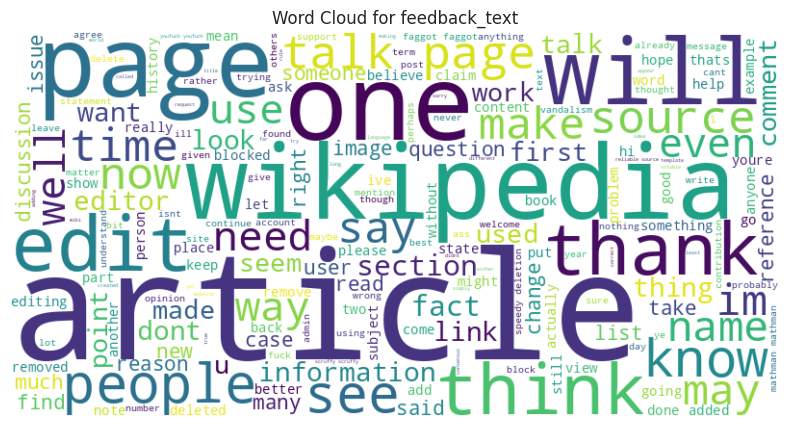


Top 10 most common words in feedback_text:


,count
article,8366
page,6388
wikipedia,4770
like,4402
would,4324
please,4303
talk,4060
one,4043
dont,3755
see,3100


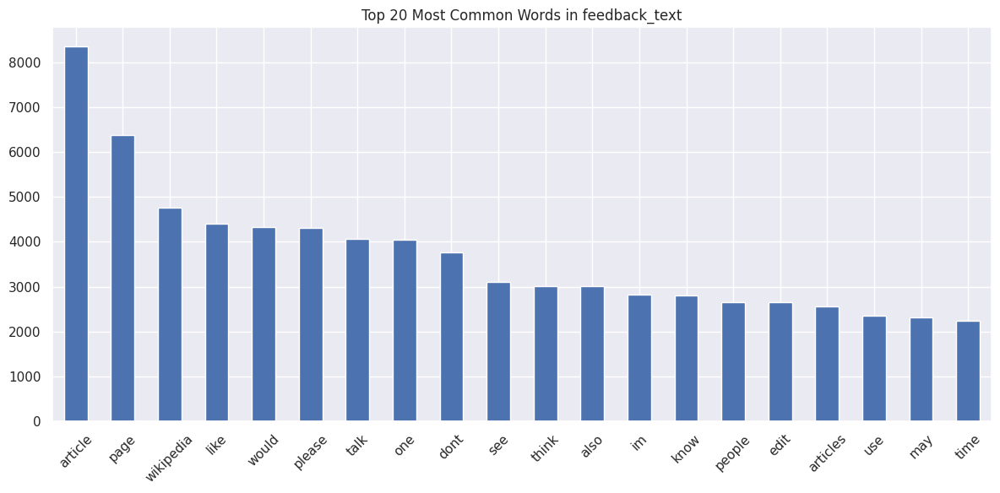

In [ ]:
# Analyze text columns
analyze_text_columns(train_df)


Label Distribution:

Toxic distribution:


,proportion
toxic,
0,0.906
1,0.094


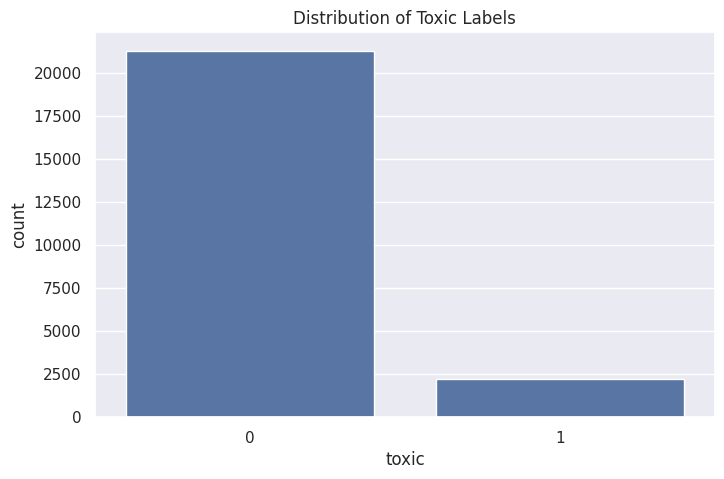


Abusive distribution:


,proportion
abusive,
0,0.993
1,0.007


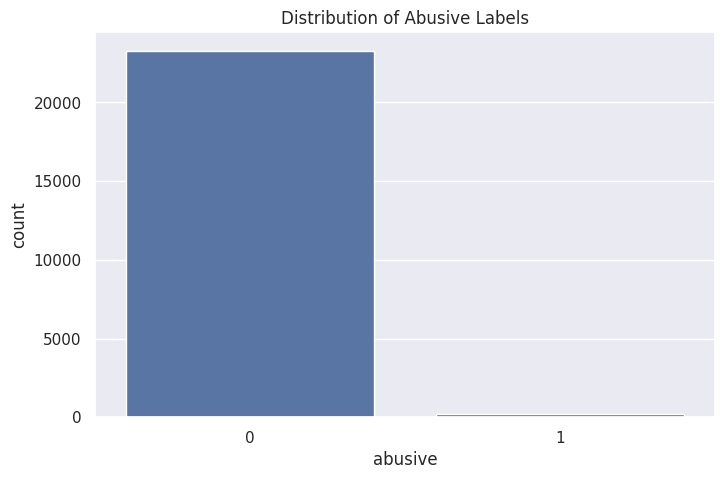


Vulgar distribution:


,proportion
vulgar,
0,0.946
1,0.054


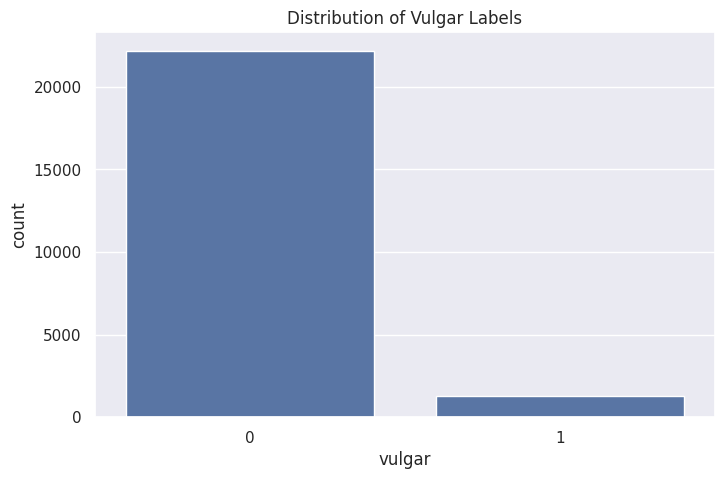


Menace distribution:


,proportion
menace,
0,0.997
1,0.003


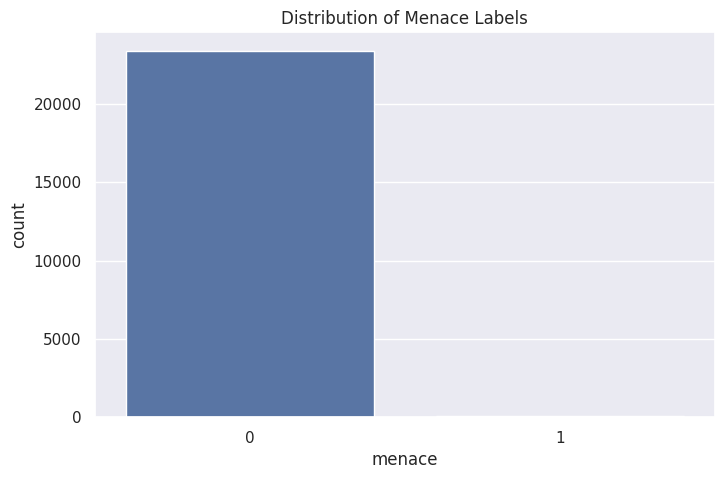


Offense distribution:


,proportion
offense,
0,0.951
1,0.049


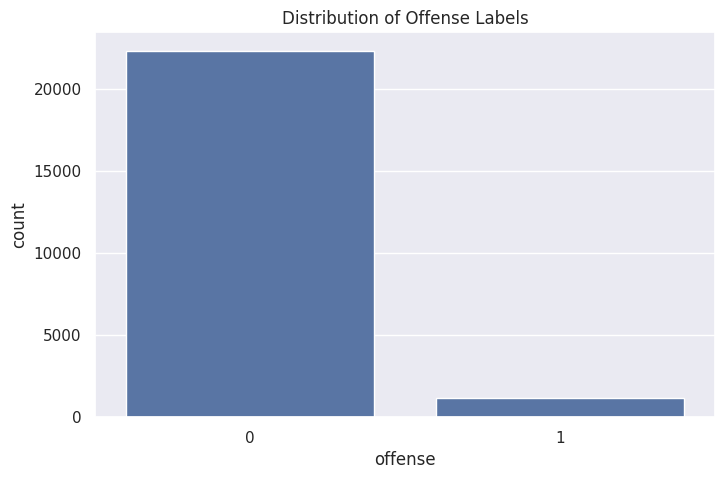


Bigotry distribution:


,proportion
bigotry,
0,0.992
1,0.008


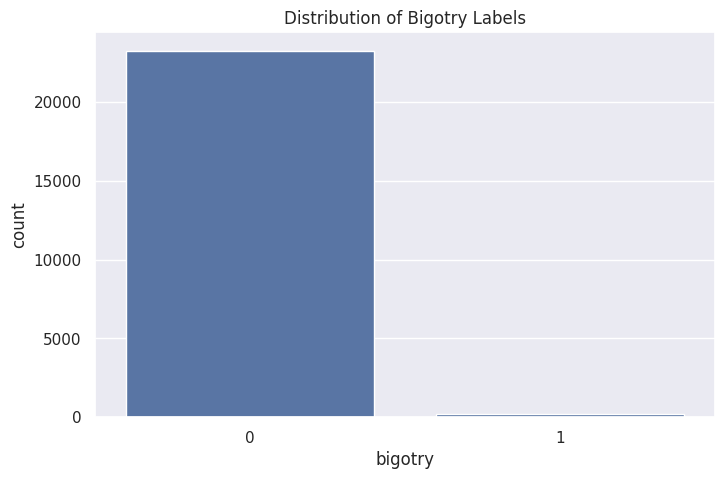

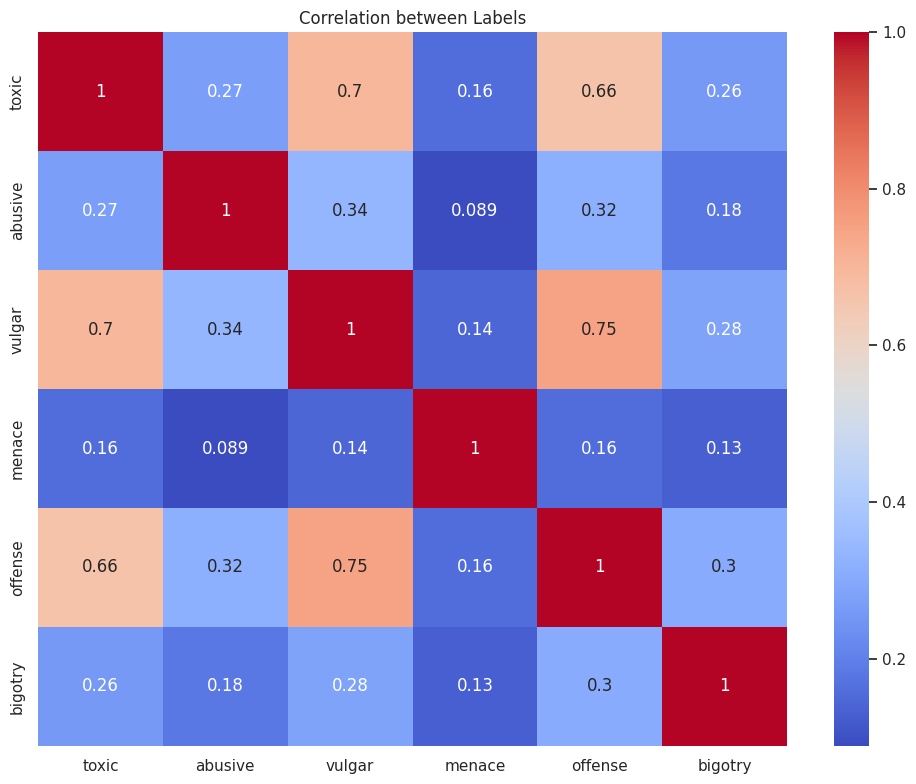

In [ ]:
# Analyze numerical columns
analyze_numerical_columns(train_df)

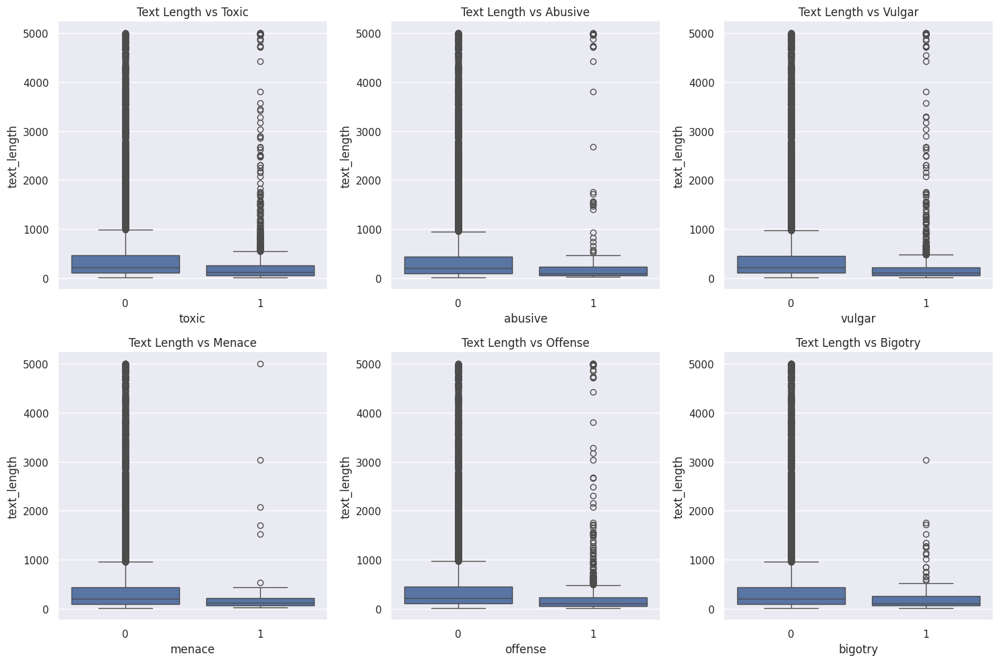

In [ ]:
# Analyze text length vs labels
analyze_text_length_vs_labels(train_df)

Plot co-occurrence heatmap


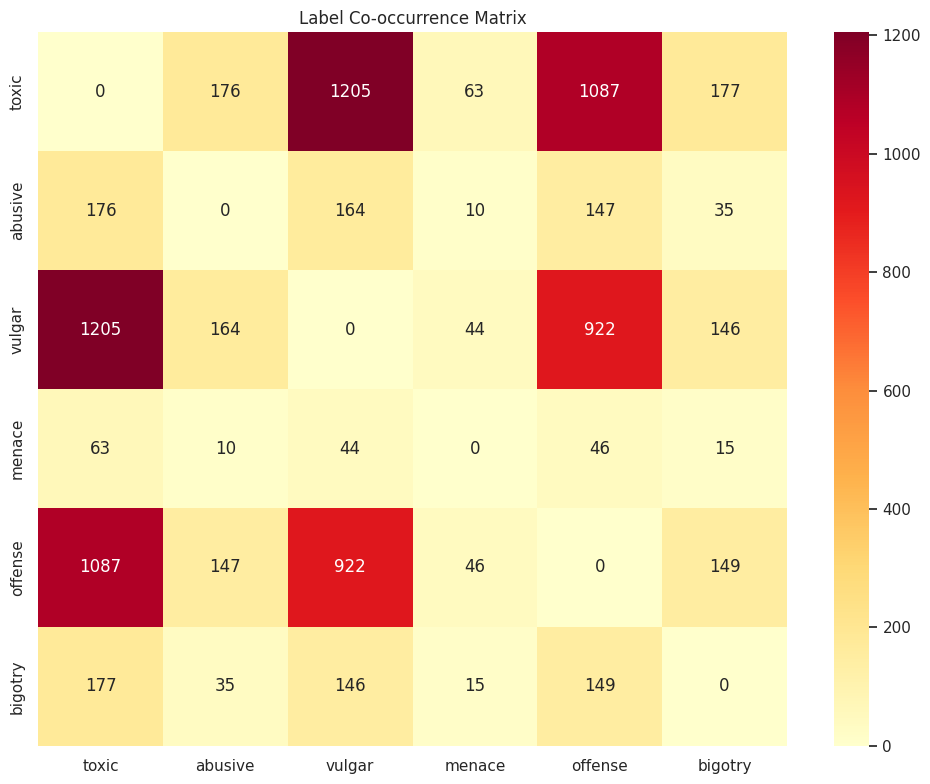

In [ ]:
analyze_label_cooccurrence(train_df)

Plot length distribution


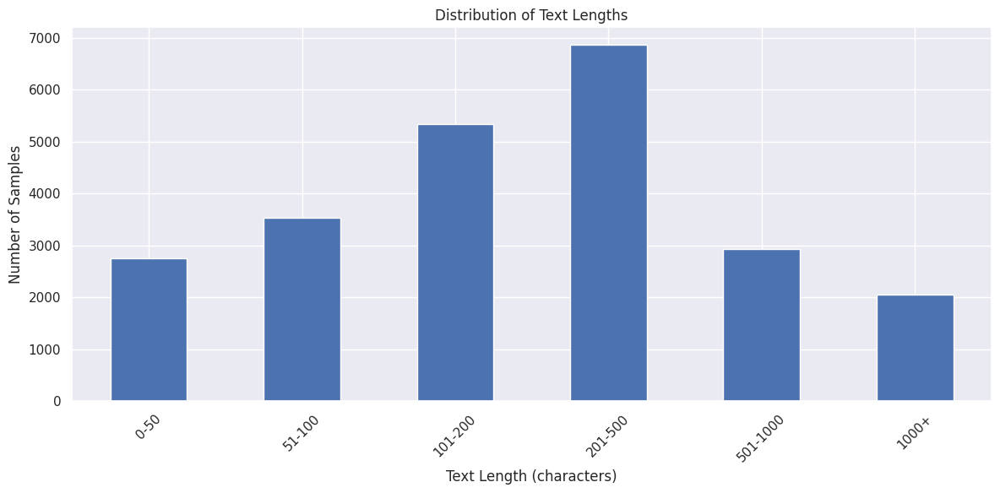


Plot length distribution by label


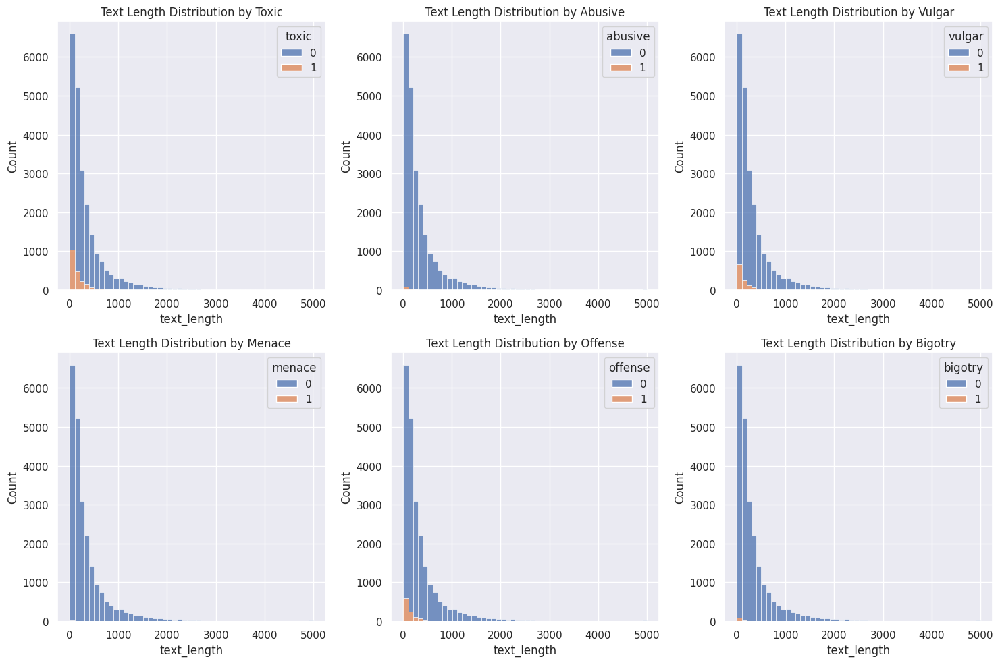

In [ ]:
analyze_text_length_distribution(train_df)

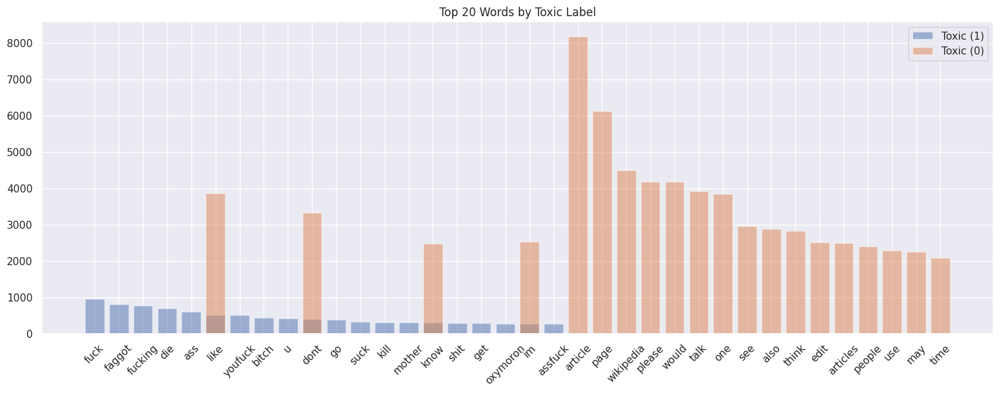

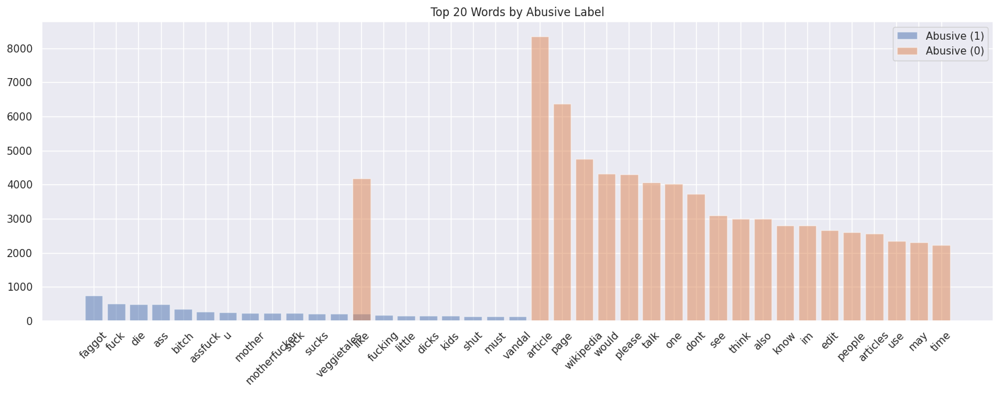

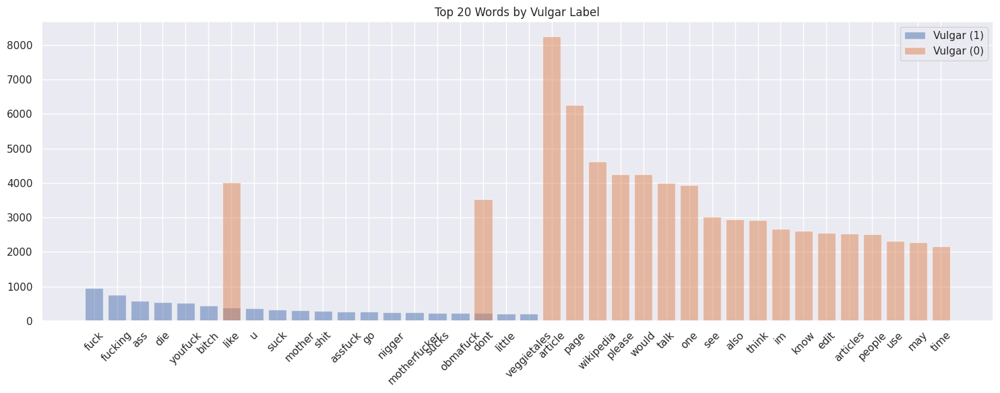

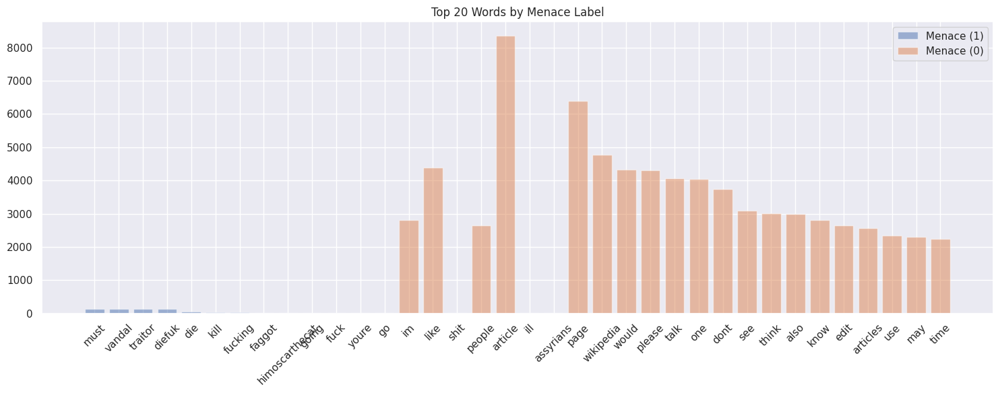

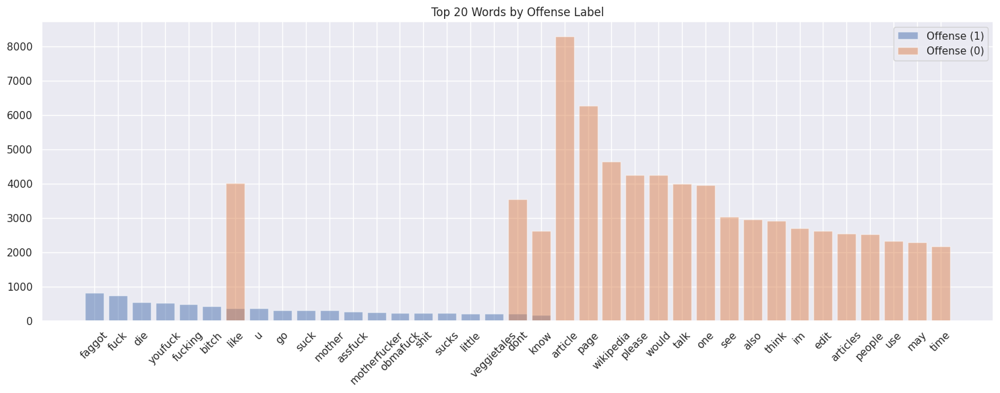

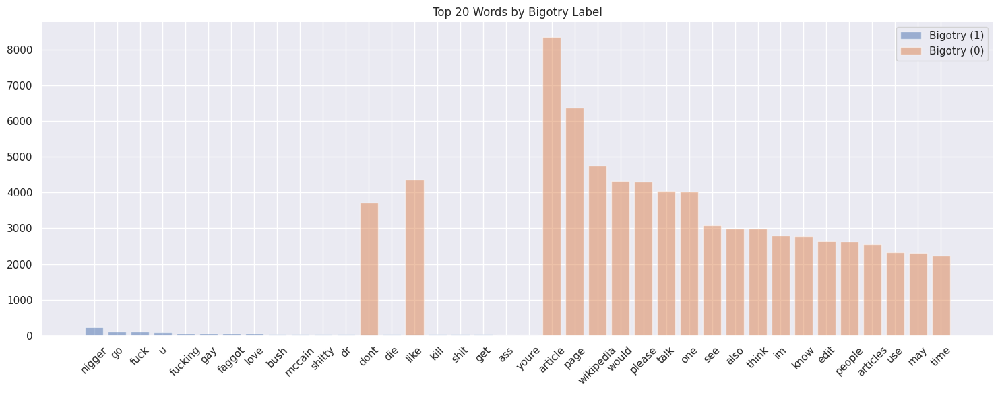

In [ ]:
analyze_word_frequency_by_label(train_df)

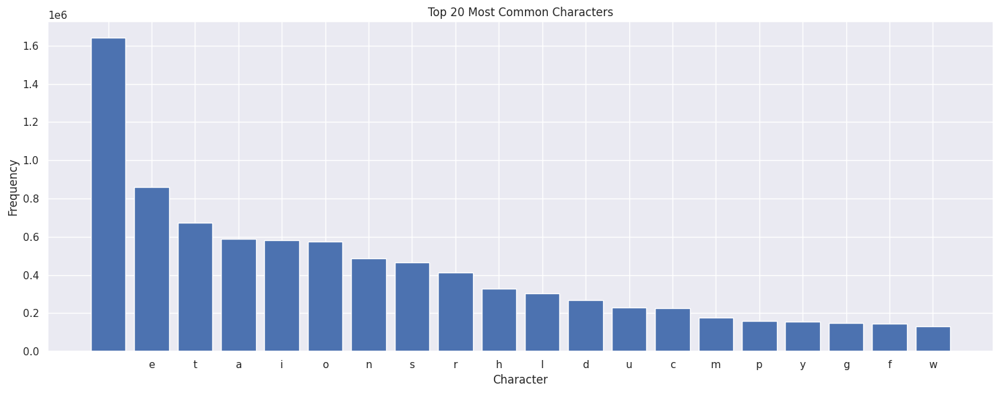

In [ ]:
analyze_character_level(train_df)

Plot individual pie charts


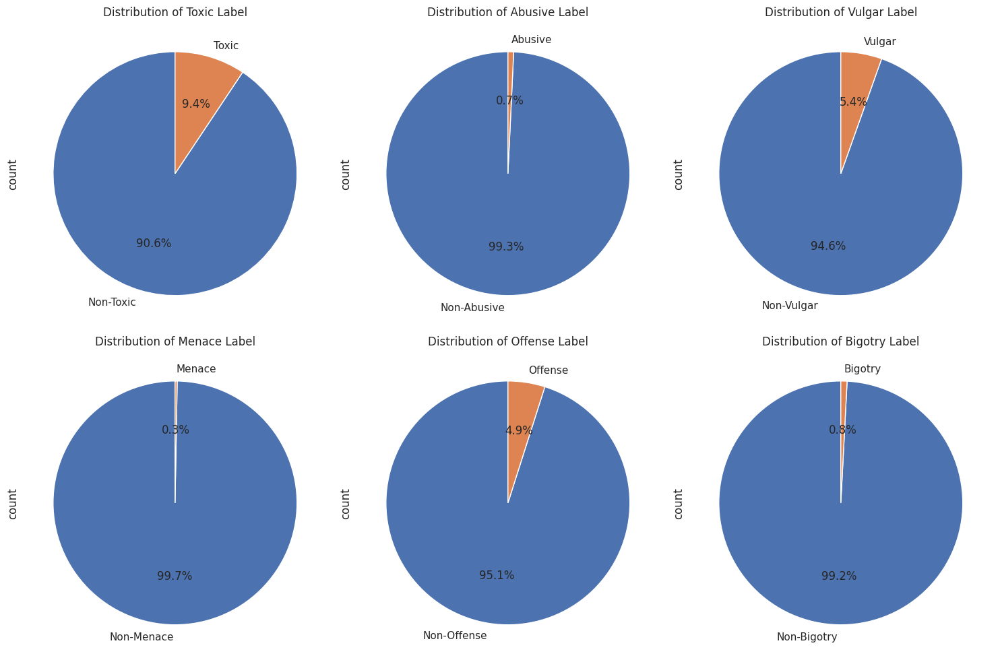


Plot overall label distribution


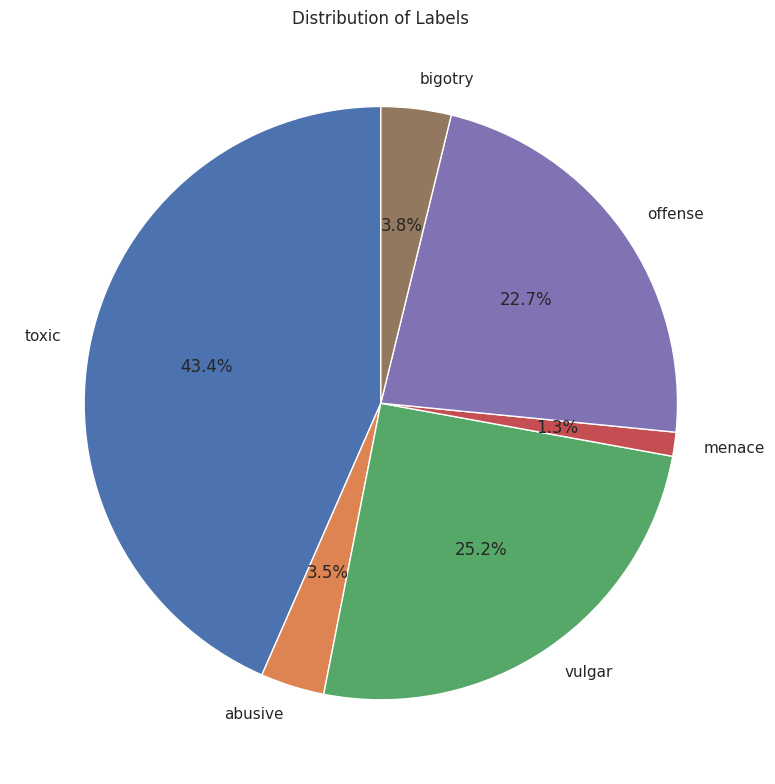

In [ ]:
analyze_label_distribution_pie(train_df)

In [ ]:
analyze_label_venn_diagram(train_df)

In [ ]:
analyze_text_complexity(train_df)

In [ ]:
analyze_label_correlation_network(train_df)

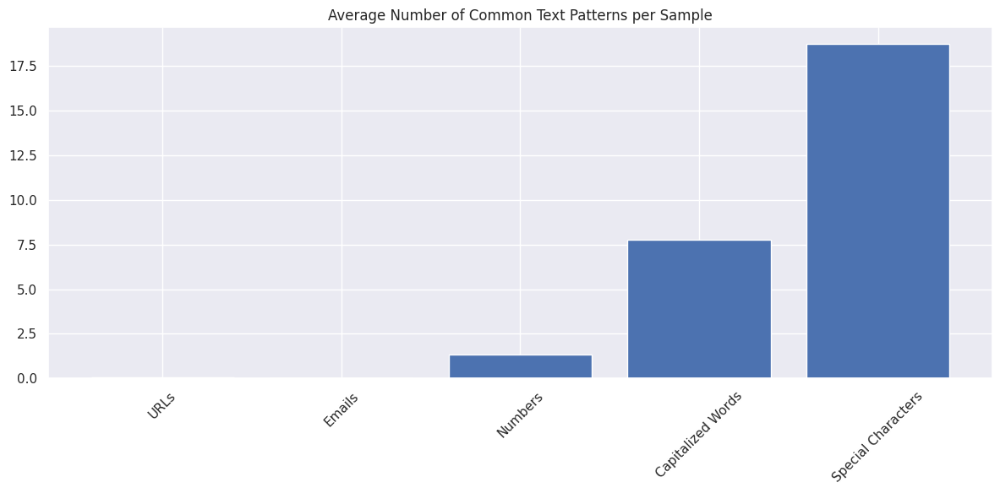

In [ ]:
analyze_text_patterns(train_df)

Create bins for text length


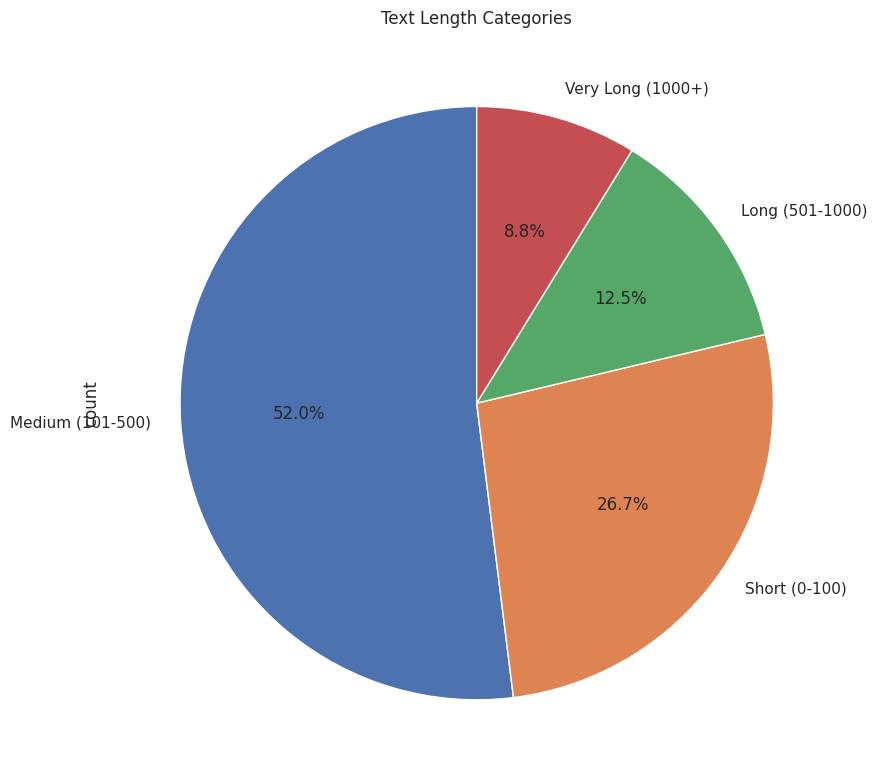


Relation between text length and toxicity


<Figure size 1200x600 with 0 Axes>

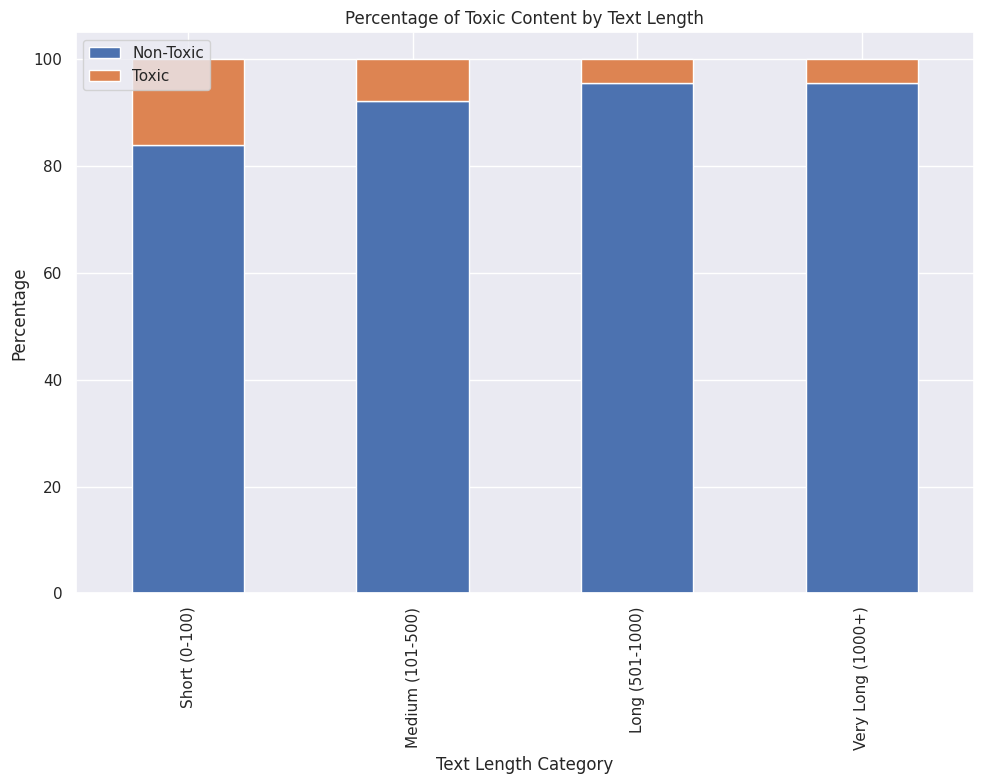

In [ ]:
analyze_additional_pie_charts(train_df)

Create a figure with subplots for each target column


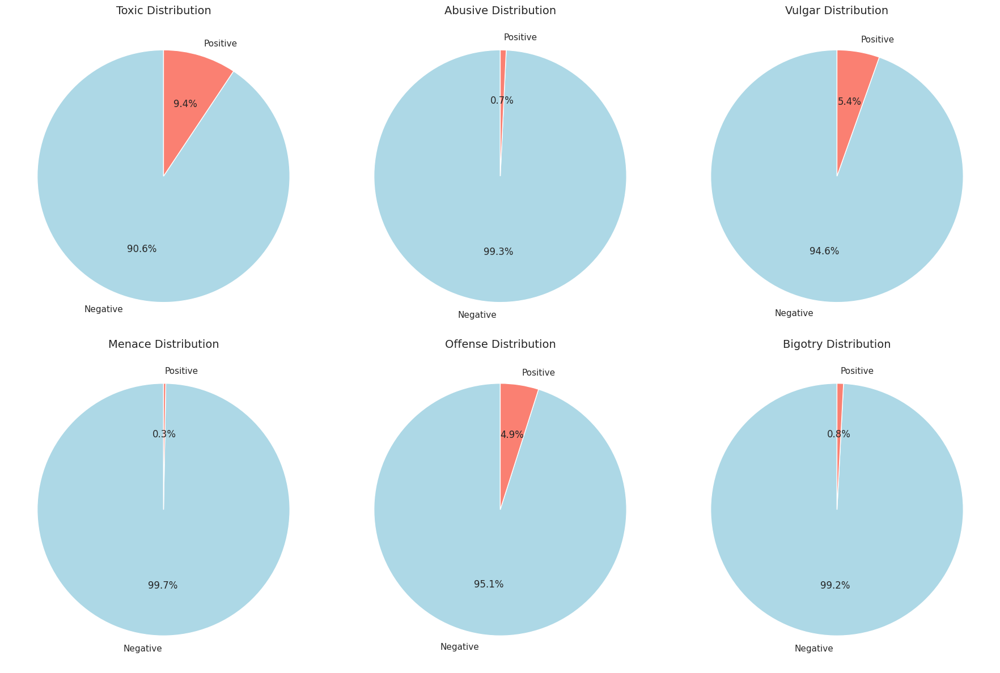


Create a single pie chart that shows the distribution of samples across all target columns


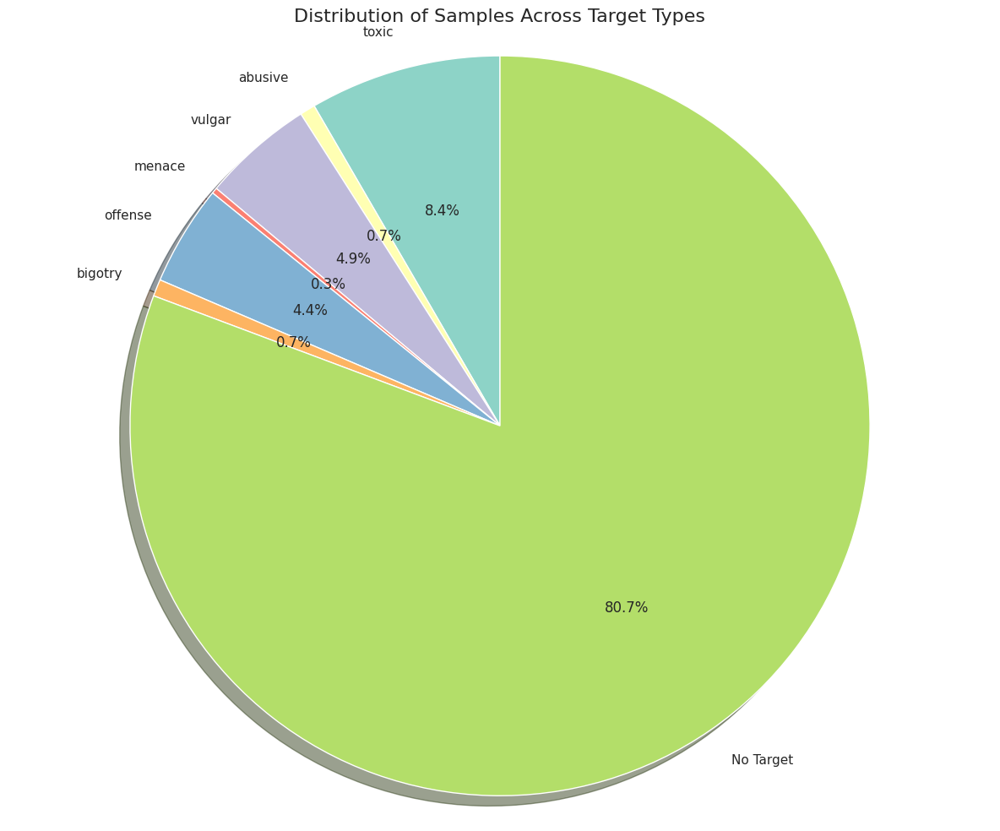

In [ ]:
create_target_column_pie_charts(train_df)

## **Word Cloud Visualization on Train Data**

In [ ]:
# Download required NLTK data
nltk.download('stopwords')

# Set style for better visualizations
sns.set_theme()
plt.rcParams['figure.figsize'] = [10, 8]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
def clean_text(text):
    """Clean text by removing special characters, numbers, etc."""
    if isinstance(text, str):
        # Convert to lowercase
        text = text.lower()
        # Remove URLs
        text = re.sub(r'http\S+', '', text)
        # Remove special characters and numbers
        text = re.sub(r'[^a-zA-Z\s]', ' ', text)
        # Remove extra whitespaces
        text = re.sub(r'\s+', ' ', text).strip()
    else:
        text = ''
    return text

def generate_wordcloud(text, title, max_words=200, width=1000, height=600,
                      background_color='white', colormap='viridis'):
    """Generate and display wordcloud"""
    # Create custom stopwords
    custom_stopwords = set(stopwords.words('english'))
    custom_stopwords.update(['would', 'also', 'get', 'use', 'say', 'make', 'see', 'one', 'like', 'go'])

    # Create and generate wordcloud
    wordcloud = WordCloud(
        max_words=max_words,
        width=width,
        height=height,
        stopwords=custom_stopwords,
        background_color=background_color,
        colormap=colormap,
        contour_width=1,
        contour_color='steelblue'
    ).generate(text)

    # Plot
    plt.figure(figsize=(8, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(title, fontsize=24)
    plt.tight_layout(pad=0)
    plt.show()

Generating overall word cloud...


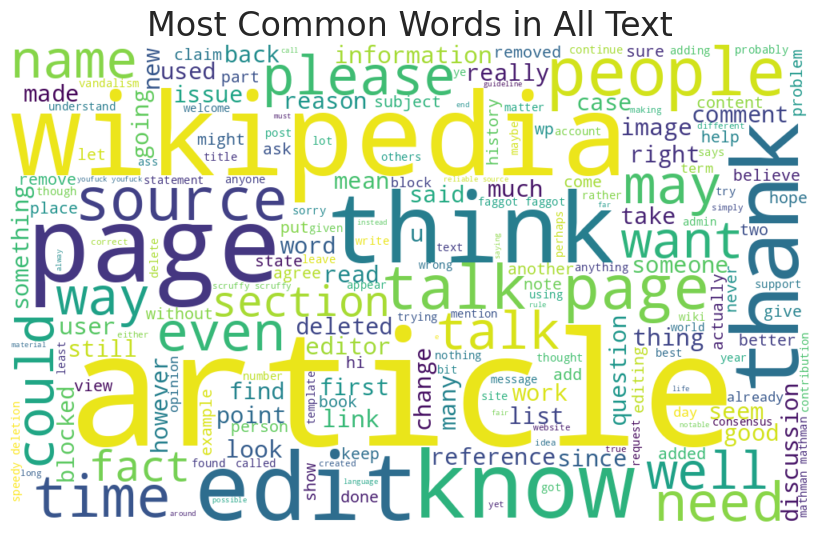

In [ ]:
    print("Generating overall word cloud...")
    # Process all text
    all_text = ' '.join(train_df['feedback_text'].apply(clean_text))
    generate_wordcloud(all_text, 'Most Common Words in All Text')

Generating toxic word cloud...


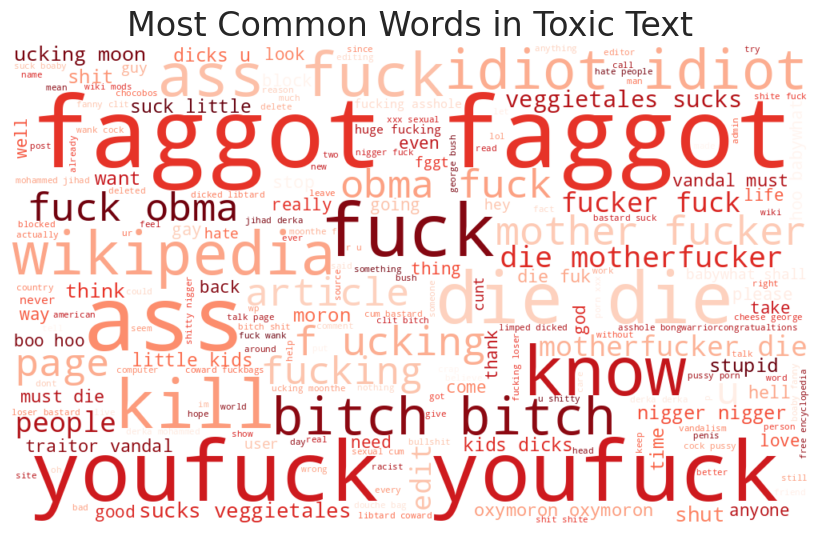

In [ ]:
    # Process toxic text
    print("Generating toxic word cloud...")
    toxic_text = ' '.join(train_df[train_df['toxic'] == 1]['feedback_text'].apply(clean_text))
    generate_wordcloud(toxic_text, 'Most Common Words in Toxic Text', colormap='Reds')

Generating non-toxic word cloud...


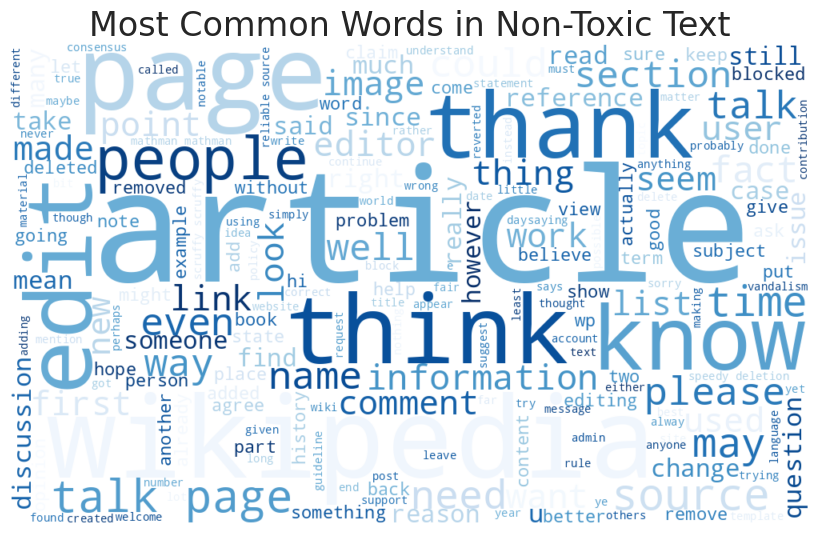

In [ ]:
    # Process non-toxic text for comparison
    print("Generating non-toxic word cloud...")
    non_toxic_text = ' '.join(train_df[train_df['toxic'] == 0]['feedback_text'].apply(clean_text))
    generate_wordcloud(non_toxic_text, 'Most Common Words in Non-Toxic Text', colormap='Blues')

Generating abusive word cloud...


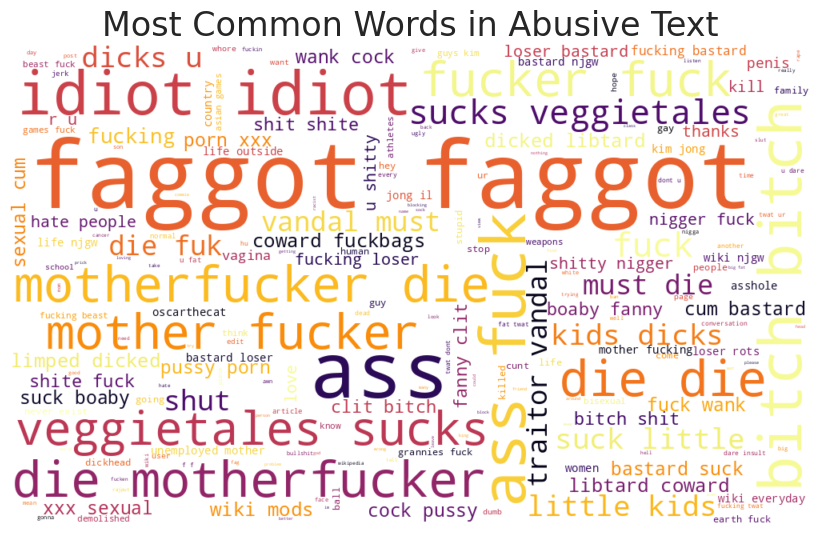

Generating vulgar word cloud...


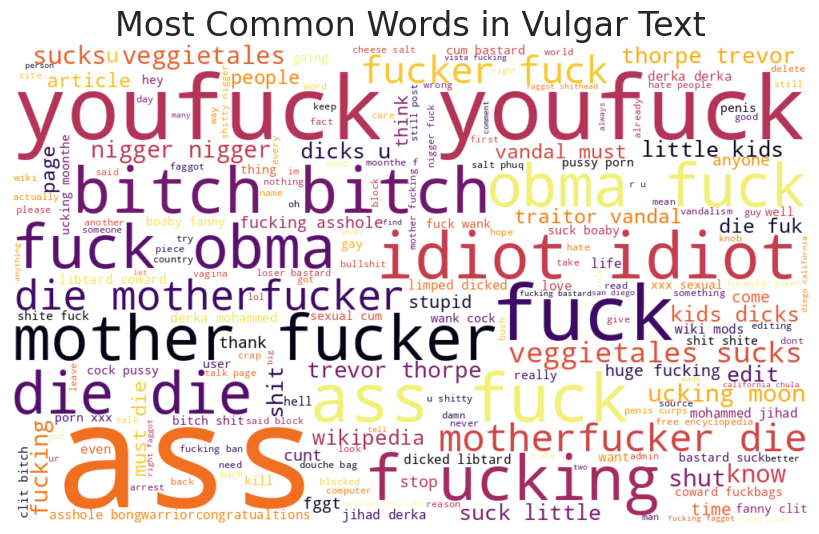

Generating menace word cloud...


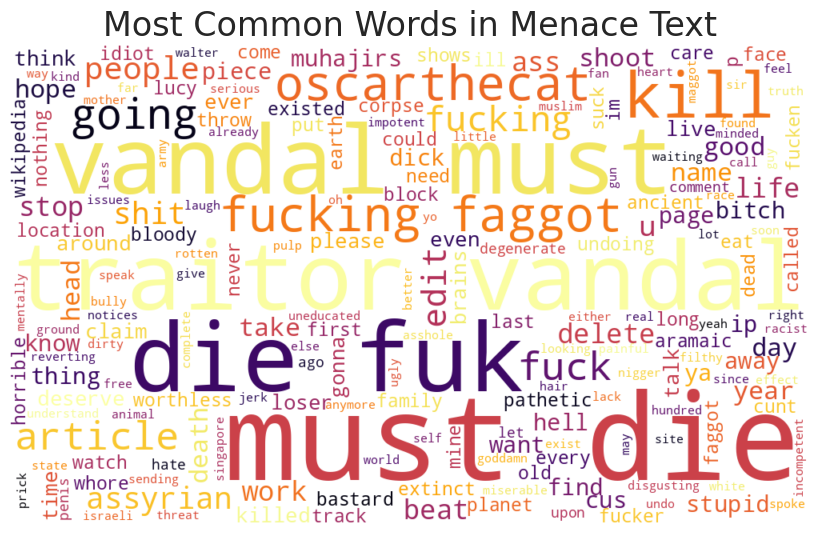

Generating offense word cloud...


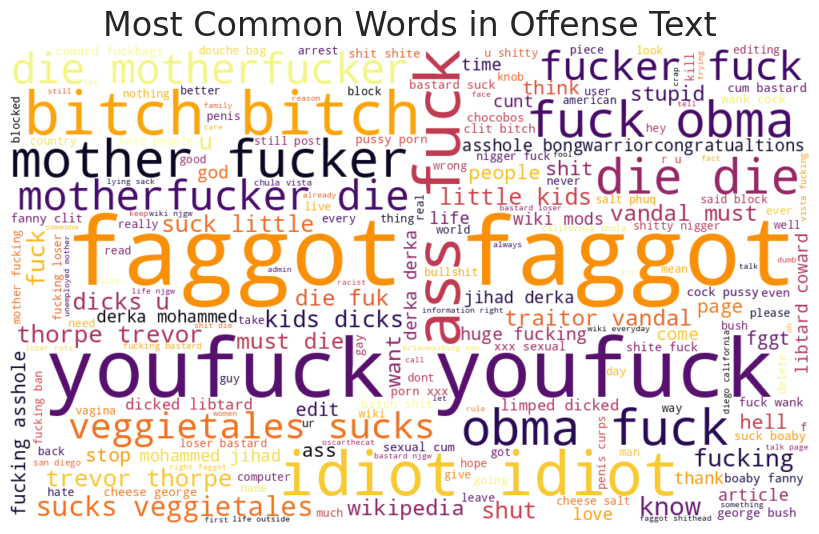

Generating bigotry word cloud...


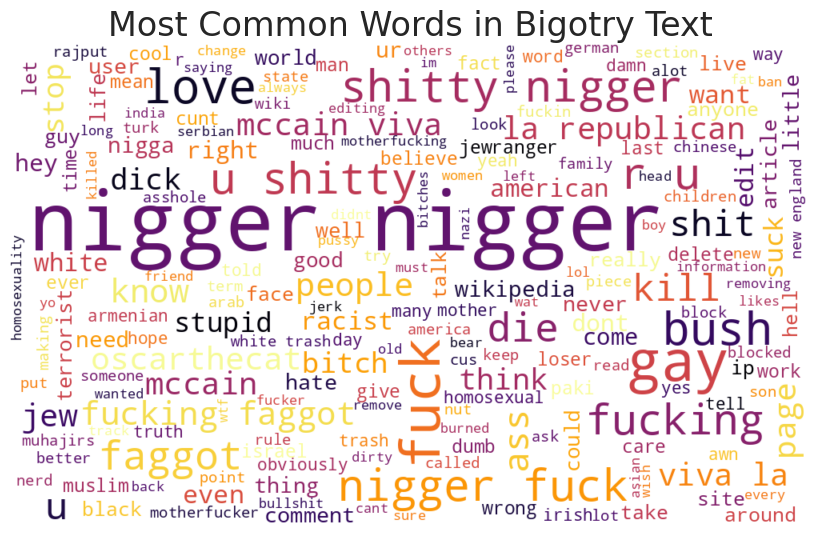

Generating comparative toxic/non-toxic word cloud...


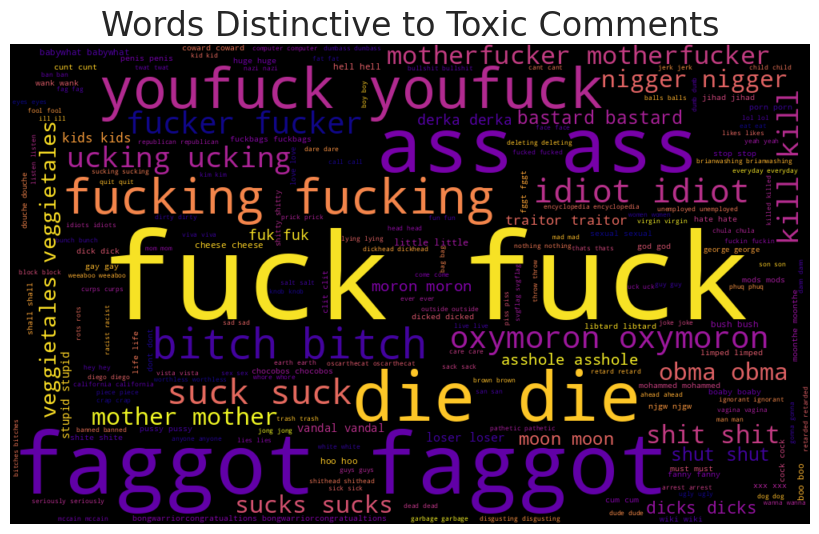

Word cloud analysis completed!


In [ ]:

    # Process specific toxicity subtypes if available
    for col in ['abusive', 'vulgar', 'menace', 'offense', 'bigotry']:
        if col in train_df.columns:
            print(f"Generating {col} word cloud...")
            subtype_text = ' '.join(train_df[train_df[col] == 1]['feedback_text'].apply(clean_text))
            generate_wordcloud(subtype_text, f'Most Common Words in {col.capitalize()} Text', colormap='inferno')

    # Generate comparative word cloud (words more common in toxic than non-toxic)
    print("Generating comparative toxic/non-toxic word cloud...")

    # Extract words and count frequencies
    toxic_words = ' '.join(train_df[train_df['toxic'] == 1]['feedback_text'].apply(clean_text)).split()
    non_toxic_words = ' '.join(train_df[train_df['toxic'] == 0]['feedback_text'].apply(clean_text)).split()

    # Count word frequencies
    toxic_word_freq = {}
    for word in toxic_words:
        if len(word) > 2:  # Filter very short words
            toxic_word_freq[word] = toxic_word_freq.get(word, 0) + 1

    non_toxic_word_freq = {}
    for word in non_toxic_words:
        if len(word) > 2:  # Filter very short words
            non_toxic_word_freq[word] = non_toxic_word_freq.get(word, 0) + 1

    # Calculate relative frequencies (to account for different corpus sizes)
    toxic_total = sum(toxic_word_freq.values())
    non_toxic_total = sum(non_toxic_word_freq.values())

    # Calculate words that are more common in toxic comments
    distinctive_toxic_words = {}
    for word, count in toxic_word_freq.items():
        toxic_rel_freq = count / toxic_total
        non_toxic_rel_freq = non_toxic_word_freq.get(word, 0) / non_toxic_total

        # If word is at least 2x more common in toxic comments
        if toxic_rel_freq > (non_toxic_rel_freq * 2) and word not in stopwords.words('english'):
            # Weight by how much more common it is in toxic comments
            distinctive_toxic_words[word] = int(count * (toxic_rel_freq / (non_toxic_rel_freq + 0.0001)))

    # Create text from distinctive toxic words
    distinctive_text = ' '.join([f"{word} " * count for word, count in distinctive_toxic_words.items()])

    # Generate distinctive toxic words cloud
    generate_wordcloud(distinctive_text, 'Words Distinctive to Toxic Comments', colormap='plasma', background_color='black')

    print("Word cloud analysis completed!")




# **EDA and Visualization on Test Data**

In [ ]:
# -*- coding: utf-8 -*-
"""
# Exploratory Data Analysis on Test Data
"""

# Load the dataset
print("Loading the dataset...")
# For local testing
df = test_df

# For Colab: Uncomment these lines
# uploaded = files.upload()  # This will prompt for test.csv upload
# df = pd.read_csv(io.BytesIO(uploaded['test.csv']))

# Basic information
print("\n--- BASIC INFORMATION ---")
print(f"Dataset shape: {df.shape}")
print(f"Total elements: {df.size}")
print(f"Memory usage: {df.memory_usage().sum() / 1024**2:.2f} MB")

# Data types and null values
print("\n--- DATA TYPES AND NULL VALUES ---")
dtype_info = pd.DataFrame(df.dtypes).reset_index()
dtype_info.columns = ['Column', 'Data Type']
dtype_info['Null Count'] = df.isnull().sum().values
dtype_info['Null Percentage'] = (df.isnull().sum().values / len(df) * 100).round(2)
dtype_info['Unique Values'] = df.nunique().values
print(dtype_info.to_string())

# Adding derived columns for analysis
if 'feedback_text' in df.columns:
    df['text_length'] = df['feedback_text'].apply(len)
    df['word_count'] = df['feedback_text'].apply(lambda x: len(str(x).split()))
    df['special_char_count'] = df['feedback_text'].apply(lambda x: len(re.findall(r'[!@#$%^&*(),.?":{}|<>]', x)))
    df['uppercase_count'] = df['feedback_text'].apply(lambda x: sum(1 for c in x if c.isupper()))
    df['exclamation_count'] = df['feedback_text'].apply(lambda x: x.count('!'))
    df['question_count'] = df['feedback_text'].apply(lambda x: x.count('?'))

    # Text analysis
    print("\n--- TEXT ANALYSIS ---")
    print(f"Total number of feedback texts: {len(df['feedback_text'])}")

    # Text length statistics
    print("\n--- TEXT LENGTH STATISTICS ---")
    text_length_stats = df['text_length'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99])
    print(text_length_stats)

    # Word count statistics
    print("\n--- WORD COUNT STATISTICS ---")
    word_count_stats = df['word_count'].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99])
    print(word_count_stats)

# Check for numerical columns
numerical_cols = df.select_dtypes(include=['number']).columns
if len(numerical_cols) > 0:
    print("\n--- NUMERICAL COLUMNS STATISTICS ---")
    num_stats = df[numerical_cols].describe(percentiles=[.01, .05, .25, .5, .75, .95, .99]).T
    print(num_stats.to_string())

# Check for categorical columns
categorical_cols = df.select_dtypes(include=['object', 'category']).columns
if len(categorical_cols) > 0:
    print("\n--- CATEGORICAL COLUMNS ANALYSIS ---")
    for col in categorical_cols:
        print(f"\nColumn: {col}")
        value_counts = df[col].value_counts().head(10)  # Top 10 values
        print(f"Top values:\n{value_counts.to_string()}")
        print(f"Total unique values: {df[col].nunique()}")

# Special character analysis if text data exists
if 'feedback_text' in df.columns:
    print("\n--- SPECIAL CHARACTER ANALYSIS ---")
    special_features = ['special_char_count', 'uppercase_count', 'exclamation_count', 'question_count']

    special_stats = pd.DataFrame()
    for feature in special_features:
        special_stats[feature] = df[feature].describe(percentiles=[.25, .5, .75, .95, .99])

    print(special_stats.to_string())

# N-gram analysis for text content
if 'feedback_text' in df.columns:
    print("\n--- SAMPLE N-GRAM ANALYSIS ---")

    from sklearn.feature_extraction.text import CountVectorizer

    # Preprocess texts
    def preprocess_text(text):
        text = text.lower()
        text = re.sub(f'[{re.escape(string.punctuation)}]', '', text)
        return text

    processed_texts = df['feedback_text'].apply(preprocess_text)

    # 2-grams
    print("\nTop 2-grams in texts:")
    vectorizer = CountVectorizer(ngram_range=(2, 2), stop_words='english', max_features=10)
    ngram_counts = vectorizer.fit_transform(processed_texts)
    ngrams = vectorizer.get_feature_names_out()
    ngram_freq = ngram_counts.sum(axis=0).tolist()[0]
    ngram_freq = sorted(zip(ngrams, ngram_freq), key=lambda x: x[1], reverse=True)

    for ngram, count in ngram_freq[:10]:
        print(f"  '{ngram}': {count}")

# Check for duplicate rows
print("\n--- DUPLICATE ROWS ---")
duplicate_count = df.duplicated().sum()
print(f"Total duplicate rows: {duplicate_count} ({(duplicate_count/len(df)*100):.2f}% of data)")

# Function to check for outliers in numerical data
def detect_outliers(df, col):
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]
    return len(outliers), (len(outliers)/len(df)*100)

# Outlier detection for numerical columns
if len(numerical_cols) > 0:
    print("\n--- OUTLIER DETECTION ---")
    for col in numerical_cols:
        outlier_count, outlier_pct = detect_outliers(df, col)
        print(f"{col}: {outlier_count} outliers detected ({outlier_pct:.2f}% of data)")

# Text-related outlier detection if text data exists
if 'feedback_text' in df.columns:
    print("\n--- TEXT FEATURE OUTLIERS ---")
    text_features = ['text_length', 'word_count', 'special_char_count', 'uppercase_count']
    for feature in text_features:
        outlier_count, outlier_pct = detect_outliers(df, feature)
        print(f"{feature}: {outlier_count} outliers detected ({outlier_pct:.2f}% of data)")

print("\n--- COMPREHENSIVE EDA COMPLETED ---")

Loading the dataset...

--- BASIC INFORMATION ---
Dataset shape: (6000, 3)
Total elements: 18000
Memory usage: 0.14 MB

--- DATA TYPES AND NULL VALUES ---
    Column Data Type  Null Count  Null Percentage  Unique Values
0       id     int64           0              0.0           6000
1  content    object           0              0.0           6000
2     lang    object           0              0.0              6

--- NUMERICAL COLUMNS STATISTICS ---
     count    mean          std  min     1%      5%      25%     50%      75%      95%      99%     max
id  6000.0  2999.5  1732.195139  0.0  59.99  299.95  1499.75  2999.5  4499.25  5699.05  5939.01  5999.0

--- CATEGORICAL COLUMNS ANALYSIS ---

Column: content
Top values:
content
HE BORRADO ESTE ARTICULO PORQUE ES UNA MIERDA Y VOY A BORRAR TODA LA WIKI EDIA JAJJAJJAJ SOY EL REY DEL PATIO MINIHASSAN RECORDAD YO SOI EL HITLER DEL SIGLO XXI EN MORO!                                                                                               

Loading the dataset...
Dataset shape: (6000, 3)
Text Length Distribution


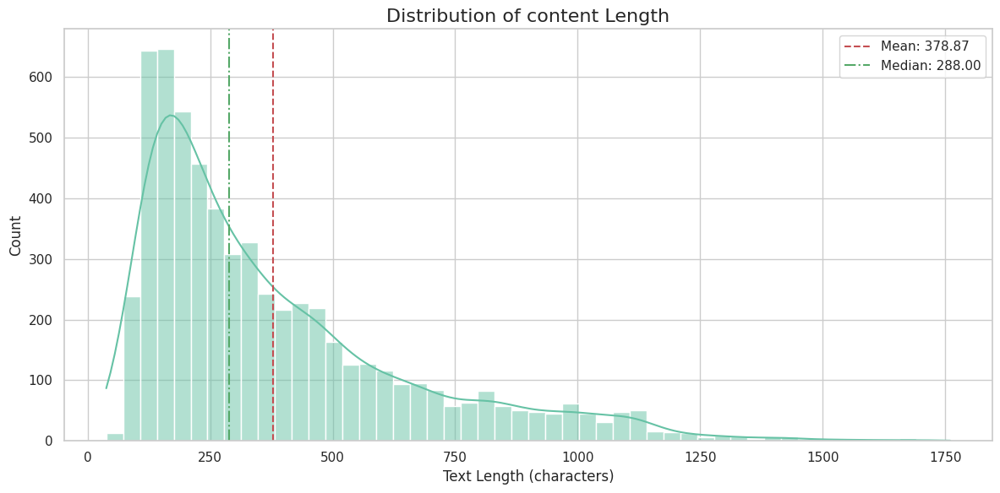


Word Count Distribution


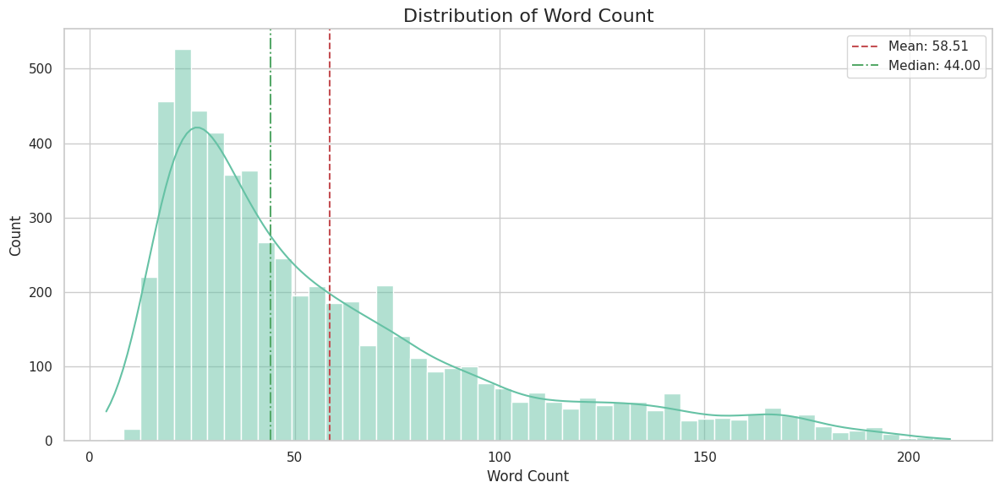


Character Type Analysis


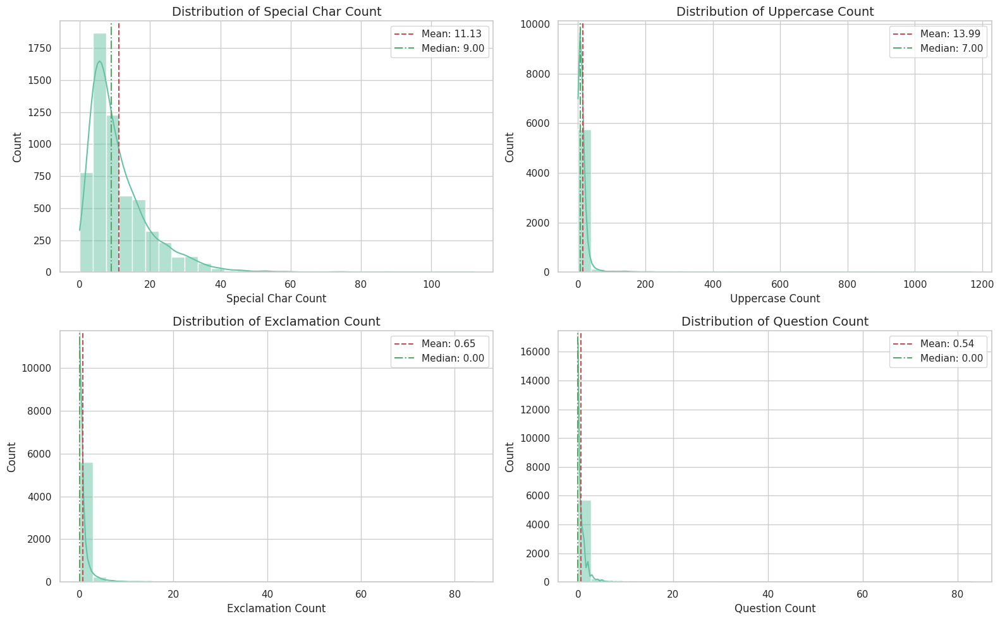


Correlations between text features


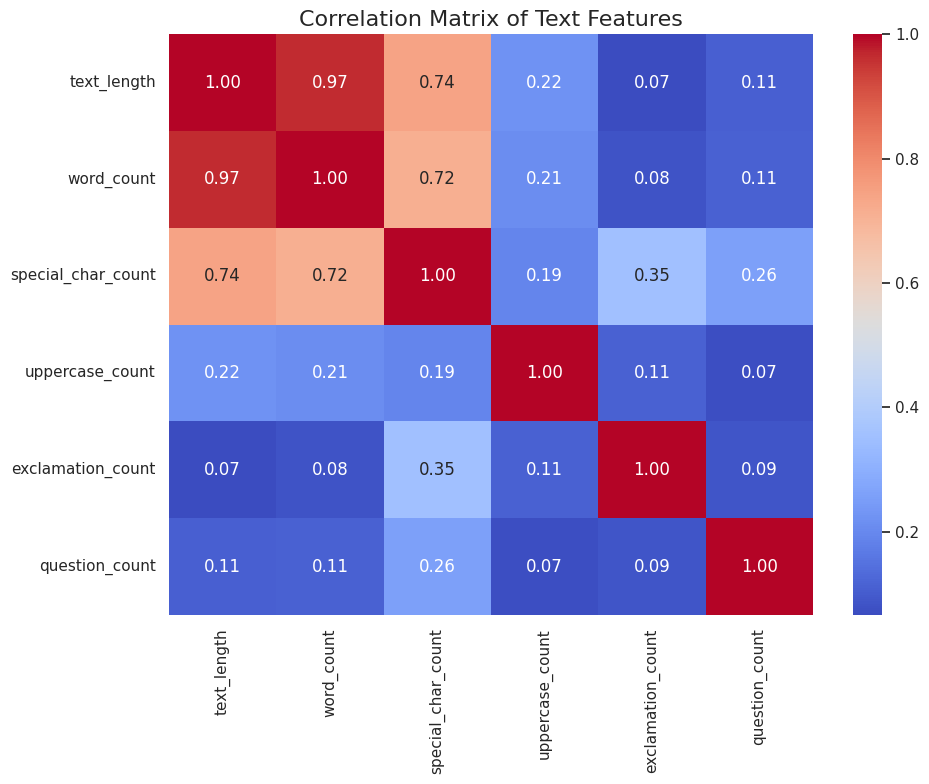


Word cloud visualization for common words


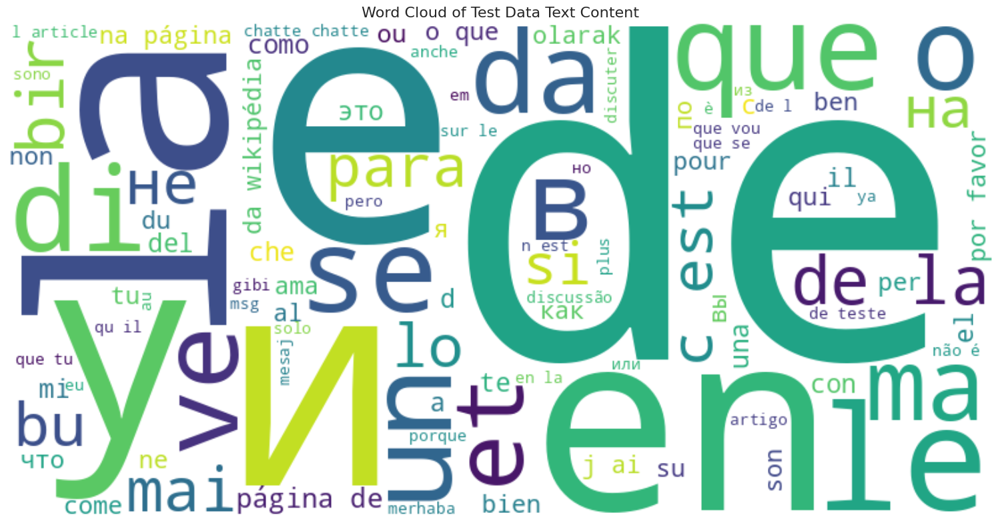


Box plots for text features


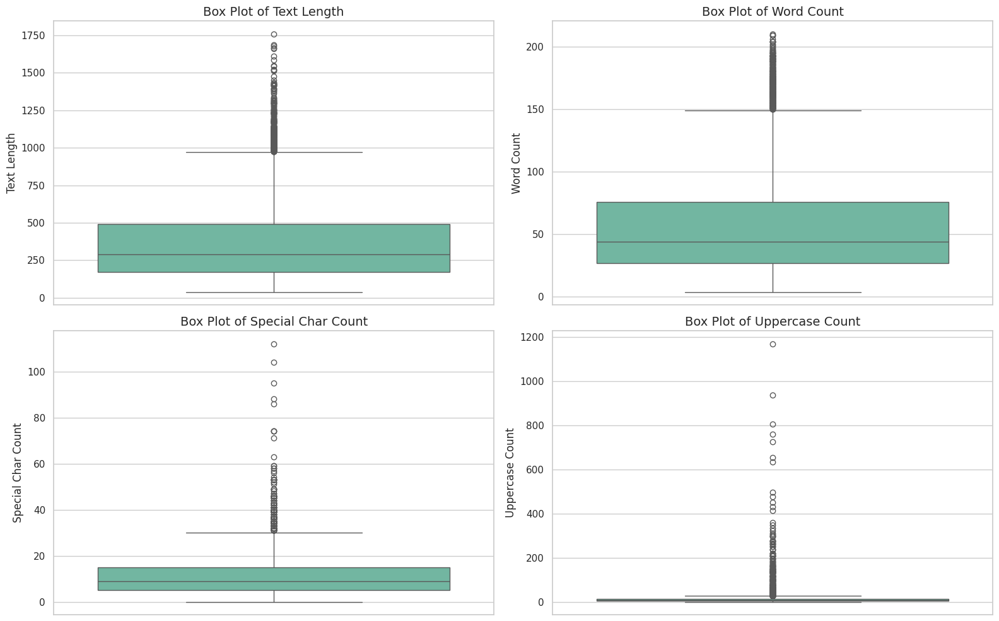


Scatter plot to explore relationships between text features


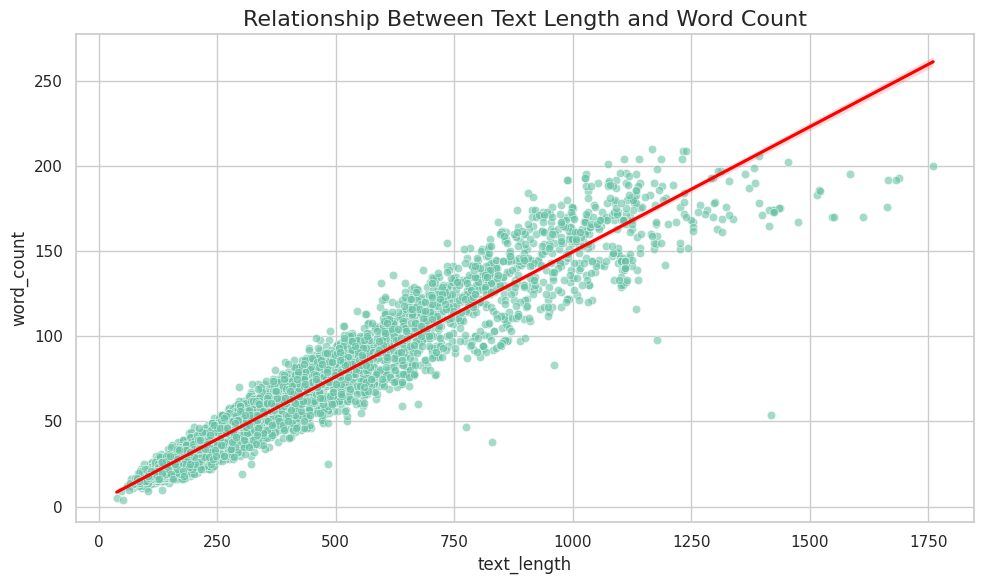


Visualize top N-grams



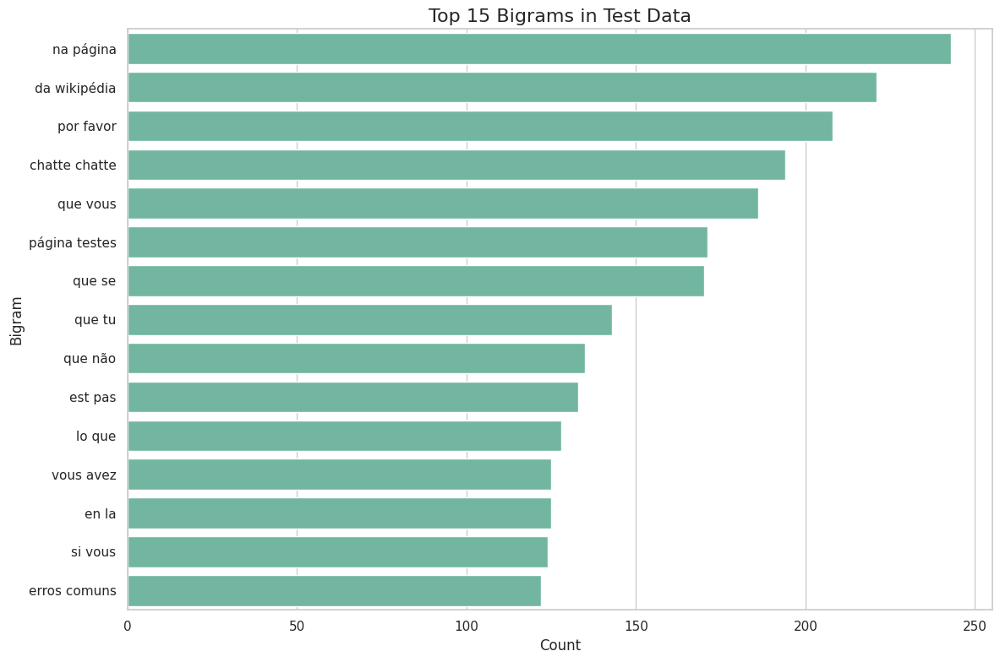

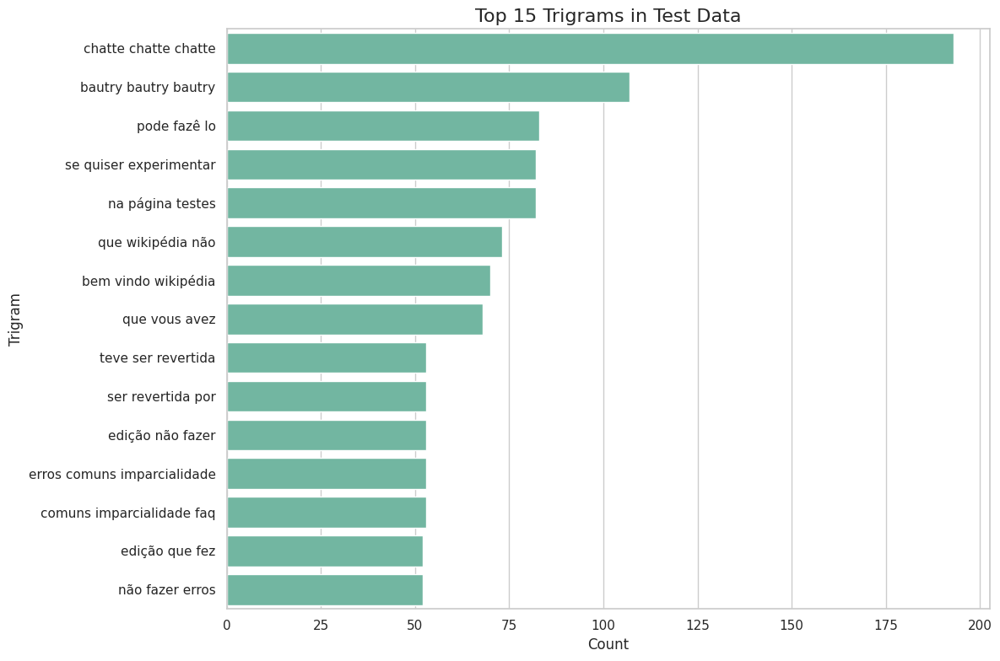

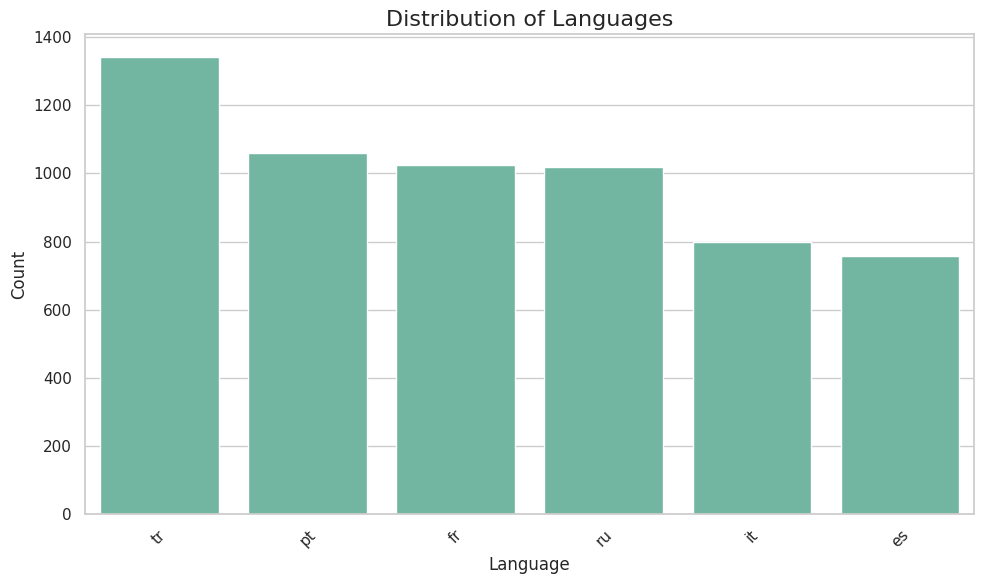

Data visualization completed. All visualizations displayed.


In [ ]:
# -*- coding: utf-8 -*-
"""
# Data Visualization for Test Data
"""

# Set the style for visualizations
plt.style.use('ggplot')
sns.set(style="whitegrid")
sns.set_palette("Set2")


print(f"Dataset shape: {df.shape}")

# Determine if we have text data
has_text_field = False
text_field = None
if 'feedback_text' in df.columns:
    text_field = 'feedback_text'
    has_text_field = True
elif 'content' in df.columns:
    text_field = 'content'
    has_text_field = True

# Add derived columns for analysis if text data exists
if has_text_field:
    df['text_length'] = df[text_field].apply(len)
    df['word_count'] = df[text_field].apply(lambda x: len(str(x).split()))
    df['special_char_count'] = df[text_field].apply(lambda x: len(re.findall(r'[!@#$%^&*(),.?":{}|<>]', x)))
    df['uppercase_count'] = df[text_field].apply(lambda x: sum(1 for c in x if c.isupper()))
    df['exclamation_count'] = df[text_field].apply(lambda x: x.count('!'))
    df['question_count'] = df[text_field].apply(lambda x: x.count('?'))

# Function to save a figure
def save_figure(fig, filename, dpi=300):
    """Save the figure to a file."""
    fig.savefig(filename, dpi=dpi, bbox_inches='tight')
    plt.close(fig)

print("Text Length Distribution")
# 1. Text Length Distribution
if has_text_field:
    fig, ax = plt.subplots(figsize=(12, 6))
    sns.histplot(df['text_length'], bins=50, kde=True, ax=ax)
    ax.set_title(f'Distribution of {text_field} Length', fontsize=16)
    ax.set_xlabel('Text Length (characters)', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.axvline(df['text_length'].mean(), color='r', linestyle='--', label=f'Mean: {df["text_length"].mean():.2f}')
    ax.axvline(df['text_length'].median(), color='g', linestyle='-.', label=f'Median: {df["text_length"].median():.2f}')
    ax.legend()
    plt.tight_layout()
    plt.show()


print()
print("Word Count Distribution")
# 2. Word Count Distribution
if has_text_field:
    fig, ax = plt.subplots(figsize=(12, 6))
    sns.histplot(df['word_count'], bins=50, kde=True, ax=ax)
    ax.set_title('Distribution of Word Count', fontsize=16)
    ax.set_xlabel('Word Count', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    ax.axvline(df['word_count'].mean(), color='r', linestyle='--', label=f'Mean: {df["word_count"].mean():.2f}')
    ax.axvline(df['word_count'].median(), color='g', linestyle='-.', label=f'Median: {df["word_count"].median():.2f}')
    ax.legend()
    plt.tight_layout()
    plt.show()

print()
print("Character Type Analysis")
# 3. Character Type Analysis
if has_text_field:
    char_features = ['special_char_count', 'uppercase_count', 'exclamation_count', 'question_count']

    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    for i, feature in enumerate(char_features):
        sns.histplot(df[feature], bins=30, kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {feature.replace("_", " ").title()}', fontsize=14)
        axes[i].set_xlabel(feature.replace("_", " ").title(), fontsize=12)
        axes[i].set_ylabel('Count', fontsize=12)
        axes[i].axvline(df[feature].mean(), color='r', linestyle='--', label=f'Mean: {df[feature].mean():.2f}')
        axes[i].axvline(df[feature].median(), color='g', linestyle='-.', label=f'Median: {df[feature].median():.2f}')
        axes[i].legend()

    plt.tight_layout()
    plt.show()

print()
print("Correlations between text features")
# 4. Correlations between text features
if has_text_field:
    # Create correlation matrix
    text_features = ['text_length', 'word_count', 'special_char_count', 'uppercase_count',
                    'exclamation_count', 'question_count']

    corr_matrix = df[text_features].corr()

    # Plot correlation heatmap
    fig, ax = plt.subplots(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', ax=ax)
    ax.set_title('Correlation Matrix of Text Features', fontsize=16)
    plt.tight_layout()
    plt.show()


print()
print("Word cloud visualization for common words")
# 5. Word cloud visualization for common words
if has_text_field:
    try:
        from wordcloud import WordCloud

        # Preprocess texts
        def preprocess_text(text):
            text = text.lower()
            text = re.sub(f'[{re.escape(string.punctuation)}]', '', text)
            return text

        # Combine all texts
        all_text = ' '.join(df[text_field].apply(preprocess_text).tolist())

        # Generate word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white',
                            max_words=100, contour_width=3, contour_color='steelblue')
        wordcloud.generate(all_text)

        # Display word cloud
        fig, ax = plt.subplots(figsize=(16, 8))
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.set_title('Word Cloud of Test Data Text Content', fontsize=16)
        ax.axis('off')
        plt.tight_layout()
        plt.show()
    except ImportError:
        print("WordCloud package not installed. Install with: pip install wordcloud")


print()
print("Box plots for text features")
# 6. Box plots for text features
if has_text_field:
    text_features = ['text_length', 'word_count', 'special_char_count', 'uppercase_count']

    fig, axes = plt.subplots(2, 2, figsize=(16, 10))
    axes = axes.flatten()

    for i, feature in enumerate(text_features):
        sns.boxplot(y=df[feature], ax=axes[i])
        axes[i].set_title(f'Box Plot of {feature.replace("_", " ").title()}', fontsize=14)
        axes[i].set_ylabel(feature.replace("_", " ").title(), fontsize=12)

    plt.tight_layout()
    plt.show()


print()
print("Scatter plot to explore relationships between text features")
# 7. Scatter plot to explore relationships between text features
if has_text_field:
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.scatterplot(x='text_length', y='word_count', data=df, alpha=0.6, ax=ax)
    ax.set_title('Relationship Between Text Length and Word Count', fontsize=16)
    ax.set_xlabel('Text Length (characters)', fontsize=12)
    ax.set_ylabel('Word Count', fontsize=12)

    # Add regression line
    sns.regplot(x='text_length', y='word_count', data=df, scatter=False,
                line_kws={"color": "red"}, ax=ax)

    plt.tight_layout()
    plt.show()


print()
print("Visualize top N-grams")
# 8. Visualize top N-grams
if has_text_field:
    # Function to get top n-grams
    def get_top_ngrams(corpus, n=2, top_k=20):
        vec = CountVectorizer(ngram_range=(n, n), stop_words='english').fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0)
        words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
        words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
        return words_freq[:top_k]

    # Preprocess texts
    processed_texts = df[text_field].apply(lambda x: x.lower())

    # Get top bigrams and trigrams
    top_bigrams = get_top_ngrams(processed_texts, n=2, top_k=15)
    print()
    # Plot bigrams
    if top_bigrams:
        fig, ax = plt.subplots(figsize=(12, 8))
        x, y = zip(*[(b[0], b[1]) for b in top_bigrams])
        sns.barplot(x=list(y), y=list(x), ax=ax)
        ax.set_title('Top 15 Bigrams in Test Data', fontsize=16)
        ax.set_xlabel('Count', fontsize=12)
        ax.set_ylabel('Bigram', fontsize=12)
        plt.tight_layout()
        plt.show()

    # Get trigrams
    top_trigrams = get_top_ngrams(processed_texts, n=3, top_k=15)
    print()
    # Plot trigrams
    if top_trigrams:
        fig, ax = plt.subplots(figsize=(12, 8))
        x, y = zip(*[(t[0], t[1]) for t in top_trigrams])
        sns.barplot(x=list(y), y=list(x), ax=ax)
        ax.set_title('Top 15 Trigrams in Test Data', fontsize=16)
        ax.set_xlabel('Count', fontsize=12)
        ax.set_ylabel('Trigram', fontsize=12)
        plt.tight_layout()
        plt.show()


print()
print("")
# 9. Language distribution if available
if 'lang' in df.columns:
    fig, ax = plt.subplots(figsize=(10, 6))
    language_counts = df['lang'].value_counts()
    sns.barplot(x=language_counts.index, y=language_counts.values, ax=ax)
    ax.set_title('Distribution of Languages', fontsize=16)
    ax.set_xlabel('Language', fontsize=12)
    ax.set_ylabel('Count', fontsize=12)
    # Rotate x-axis labels if there are many languages
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

print("Data visualization completed. All visualizations displayed.")

# **EDA and Visualization on Validation Dataset**

In [ ]:
sns.set(style="whitegrid")
plt.style.use("fivethirtyeight")
plt.rcParams["figure.figsize"] = (12, 8)
plt.rcParams["font.size"] = 12

# Download necessary NLTK resources
nltk.download('stopwords')
nltk.download('punkt')



[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# Display markdown heading
display(HTML("<h1 style='color: #4169E1; text-align: center;'>Validation Dataset Analysis</h1>"))
display(HTML("<h2 style='color: #6A5ACD; text-align: center;'>Multilingual Toxicity Classification</h2>"))
df=validation_df
# Display basic information
print("\n" + "="*80)
print("📊 BASIC DATASET INFORMATION")
print("="*80)

# Dataset shape and memory usage
print(f"Dataset shape: {df.shape[0]} rows × {df.shape[1]} columns")
print(f"Total elements: {df.size}")
memory_usage = df.memory_usage(deep=True).sum()
print(f"Memory usage: {memory_usage / 1024**2:.2f} MB")

# Columns in dataset
print("\nColumns in the dataset:")
for col in df.columns:
    print(f"- {col}")

# Data types
print("\nData types:")
print(df.dtypes)

# Check for null values
nulls = df.isnull().sum()
print("\nNull values per column:")
print(nulls)

# Display unique values for categorical columns
if 'lang' in df.columns:
    print("\nLanguage distribution:")
    lang_counts = df['lang'].value_counts()
    print(lang_counts)

if 'toxic' in df.columns:
    print("\nToxicity distribution:")
    toxic_counts = df['toxic'].value_counts()
    print(toxic_counts)
    toxic_percentage = df['toxic'].mean() * 100
    print(f"Percentage of toxic texts: {toxic_percentage:.2f}%")

# Display sample rows
print("\nSample of the dataset:")
display(df.head())

# ## Text Analysis and Feature Engineering

# Create derived columns for text analysis
print("\n" + "="*80)
print("📝 TEXT ANALYSIS AND FEATURE ENGINEERING")
print("="*80)

# Only process if feedback_text column exists
if 'feedback_text' in df.columns:
    # Create text features
    df['text_length'] = df['feedback_text'].apply(len)
    df['word_count'] = df['feedback_text'].apply(lambda x: len(str(x).split()))
    df['special_char_count'] = df['feedback_text'].apply(lambda x: len(re.findall(r'[^\w\s]', str(x))))
    df['uppercase_count'] = df['feedback_text'].apply(lambda x: sum(1 for c in str(x) if c.isupper()))
    df['exclamation_count'] = df['feedback_text'].apply(lambda x: str(x).count('!'))
    df['question_count'] = df['feedback_text'].apply(lambda x: str(x).count('?'))

    # Summary of text features
    print("\nText features summary statistics:")
    text_features = ['text_length', 'word_count', 'special_char_count',
                    'uppercase_count', 'exclamation_count', 'question_count']
    print(df[text_features].describe())

    # Check for outliers in text features
    def detect_outliers(df, column):
        """Detect outliers using IQR method"""
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        return outliers.shape[0], lower_bound, upper_bound

    print("\nOutlier detection in text features:")
    for feature in text_features:
        outlier_count, lb, ub = detect_outliers(df, feature)
        print(f"- {feature}: {outlier_count} outliers (outside range {lb:.2f} - {ub:.2f})")

    # Compare text feature distributions between toxic and non-toxic texts
    if 'toxic' in df.columns:
        print("\nComparison of text features between toxic and non-toxic texts:")

        toxic_df = df[df['toxic'] == 1]
        non_toxic_df = df[df['toxic'] == 0]

        for feature in text_features:
            toxic_mean = toxic_df[feature].mean()
            non_toxic_mean = non_toxic_df[feature].mean()
            percentage_diff = ((toxic_mean - non_toxic_mean) / non_toxic_mean) * 100

            print(f"- {feature}:")
            print(f"  - Toxic mean: {toxic_mean:.2f}")
            print(f"  - Non-toxic mean: {non_toxic_mean:.2f}")
            print(f"  - Difference: {percentage_diff:.2f}%")

            # T-test for significance
            t_stat, p_value = stats.ttest_ind(toxic_df[feature], non_toxic_df[feature], equal_var=False)
            significance = "Significant" if p_value < 0.05 else "Not significant"
            print(f"  - Statistical significance: {significance} (p-value: {p_value:.4f})")
else:
    print("No 'feedback_text' column found in the dataset.")


📊 BASIC DATASET INFORMATION
Dataset shape: 840 rows × 10 columns
Total elements: 8400
Memory usage: 0.59 MB

Columns in the dataset:
- id
- feedback_text
- lang
- toxic
- text_length
- word_count
- special_char_count
- uppercase_count
- exclamation_count
- question_count

Data types:
id                     int64
feedback_text         object
lang                  object
toxic                  int64
text_length            int64
word_count             int64
special_char_count     int64
uppercase_count        int64
exclamation_count      int64
question_count         int64
dtype: object

Null values per column:
id                    0
feedback_text         0
lang                  0
toxic                 0
text_length           0
word_count            0
special_char_count    0
uppercase_count       0
exclamation_count     0
question_count        0
dtype: int64

Language distribution:
lang
tr    299
es    279
it    262
Name: count, dtype: int64

Toxicity distribution:
toxic
0    706
1    134

,id,feedback_text,lang,toxic,text_length,word_count,special_char_count,uppercase_count,exclamation_count,question_count
0,1203,İyi tamam olabilir. Balkanlar maddesini gelişt...,tr,0,458,58,11,16,0,0
1,5871,"Por dios, y la canción de John Lennon: http://...",es,1,235,31,15,9,0,1
2,3590,Selam. Öncelikle tebrik ederim... Bu arada ken...,tr,0,189,27,8,4,0,1
3,447,Leggiti tutte le discussioni. Magari cancellal...,it,1,200,31,5,3,1,0
4,6634,A LAS TOKITAS NOS VALE QUE LAS JONATICAS INSUL...,es,1,229,43,14,173,4,0



📝 TEXT ANALYSIS AND FEATURE ENGINEERING

Text features summary statistics:
       text_length  word_count  special_char_count  uppercase_count  \
count   840.000000  840.000000          840.000000       840.000000   
mean    368.303571   55.658333           11.552381        14.544048   
std     267.134446   39.381829           12.116326        42.303664   
min      78.000000   11.000000            0.000000         0.000000   
25%     177.000000   28.000000            5.000000         4.000000   
50%     278.500000   43.000000            9.000000         7.000000   
75%     467.250000   70.000000           14.000000        13.000000   
max    1550.000000  203.000000          204.000000       585.000000   

       exclamation_count  question_count  
count         840.000000      840.000000  
mean            0.438095        0.488095  
std             2.113801        1.086202  
min             0.000000        0.000000  
25%             0.000000        0.000000  
50%             0.000000  

In [ ]:
# ## Visualizations

# Text length and word count distribution
print("\n" + "="*80)
print("📊 VISUALIZATIONS")
print("="*80)


📊 VISUALIZATIONS


Text(0, 0.5, 'Frequency')

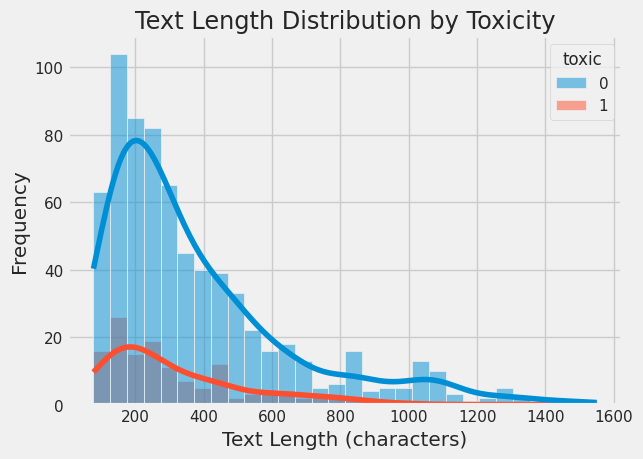

In [ ]:
    plt.figure(figsize=(14, 10))

    # Text length distribution by toxicity
    plt.subplot(2, 2, 1)
    if 'toxic' in df.columns:
        sns.histplot(data=df, x='text_length', hue='toxic', kde=True, bins=30)
        plt.title('Text Length Distribution by Toxicity')
    else:
        sns.histplot(data=df, x='text_length', kde=True, bins=30)
        plt.title('Text Length Distribution')
    plt.xlabel('Text Length (characters)')
    plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

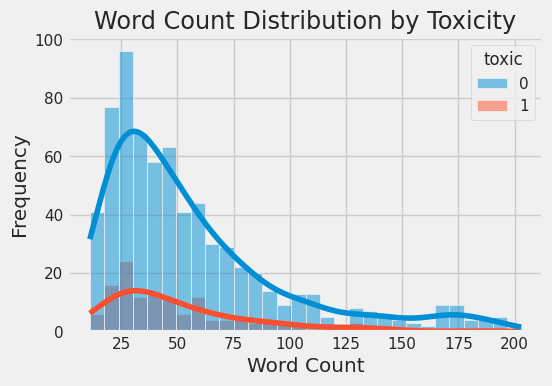

In [ ]:
    # Word count distribution by toxicity
    plt.subplot(2, 2, 2)
    if 'toxic' in df.columns:
        sns.histplot(data=df, x='word_count', hue='toxic', kde=True, bins=30)
        plt.title('Word Count Distribution by Toxicity')
    else:
        sns.histplot(data=df, x='word_count', kde=True, bins=30)
        plt.title('Word Count Distribution')
    plt.xlabel('Word Count')
    plt.ylabel('Frequency')

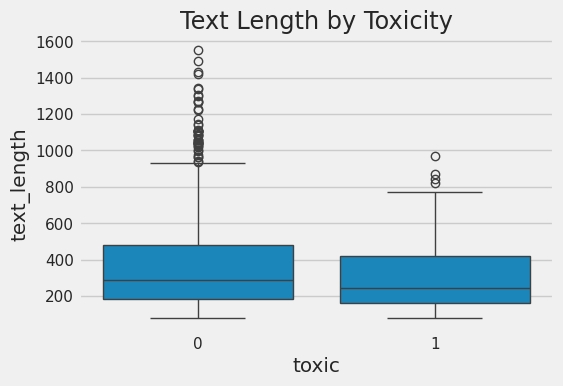

In [ ]:
    # Box plots for text features
    plt.subplot(2, 2, 3)
    if 'toxic' in df.columns:
        sns.boxplot(x='toxic', y='text_length', data=df)
        plt.title('Text Length by Toxicity')
    else:
        sns.boxplot(y='text_length', data=df)
        plt.title('Text Length Distribution')


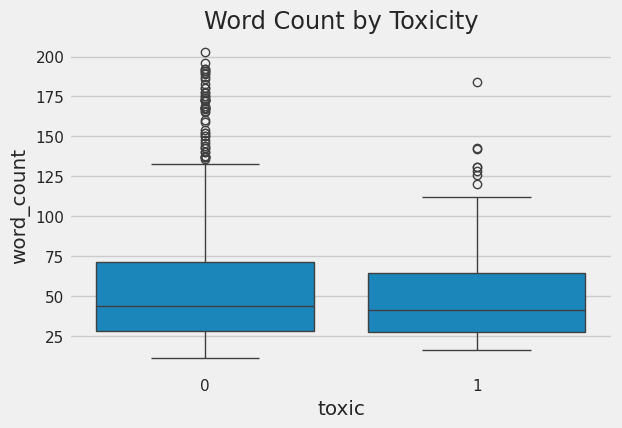

In [ ]:
    # Box plots for word count
    plt.subplot(2, 2, 4)
    if 'toxic' in df.columns:
        sns.boxplot(x='toxic', y='word_count', data=df)
        plt.title('Word Count by Toxicity')
    else:
        sns.boxplot(y='word_count', data=df)
        plt.title('Word Count Distribution')

    plt.tight_layout()
    plt.show()

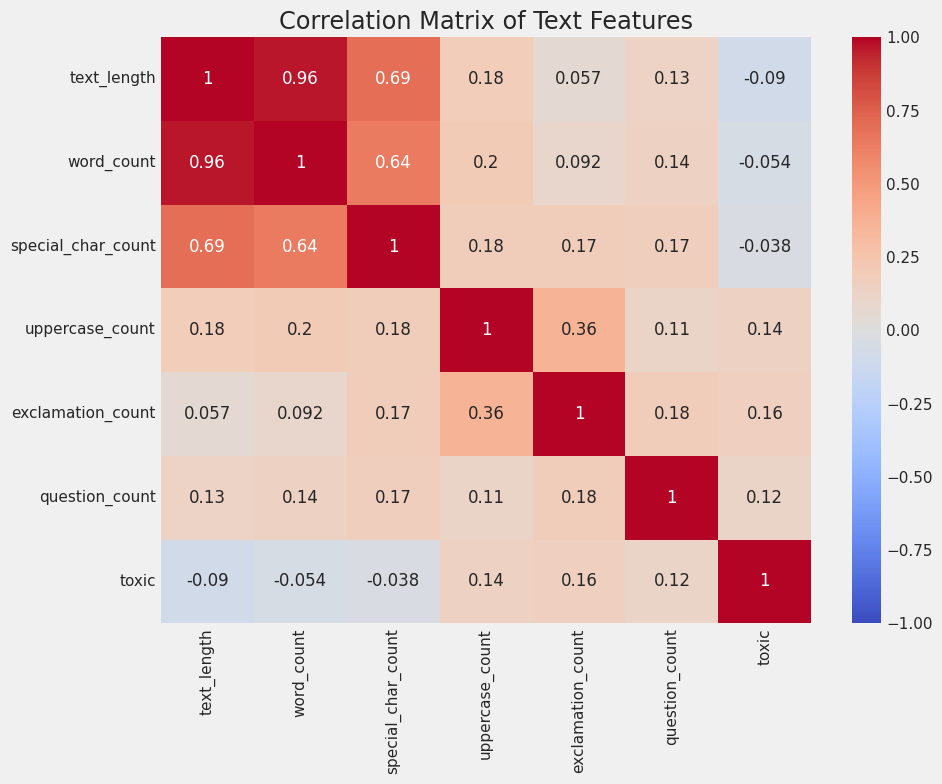

In [ ]:
    # Correlation heatmap for text features
    plt.figure(figsize=(10, 8))
    text_features_and_toxic = text_features.copy()
    if 'toxic' in df.columns:
        text_features_and_toxic.append('toxic')

    correlation = df[text_features_and_toxic].corr()
    sns.heatmap(correlation, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
    plt.title('Correlation Matrix of Text Features')
    plt.tight_layout()
    plt.show()

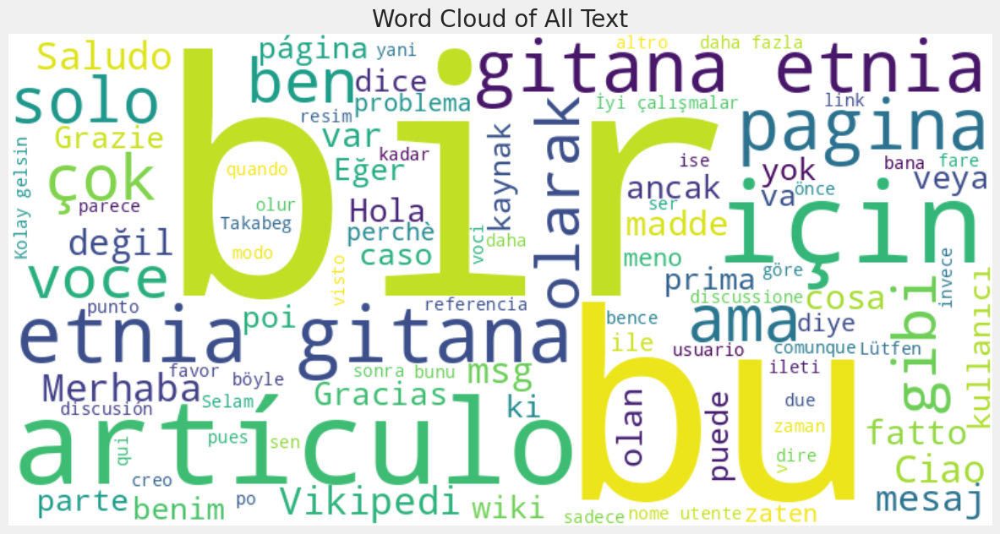

In [ ]:


            plt.figure(figsize=(12, 8))

            # Combine all text
            all_text = ' '.join(df['feedback_text'].astype(str).tolist())

            # Generate word cloud
            stop_words = set(stopwords.words('english') +
                            stopwords.words('spanish') +
                            stopwords.words('italian'))

            wordcloud = WordCloud(width=800, height=400,
                                background_color='white',
                                stopwords=stop_words,
                                max_words=100,
                                contour_width=3,
                                contour_color='steelblue').generate(all_text)

            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis('off')
            plt.title('Word Cloud of All Text', fontsize=20)
            plt.tight_layout()
            plt.show()

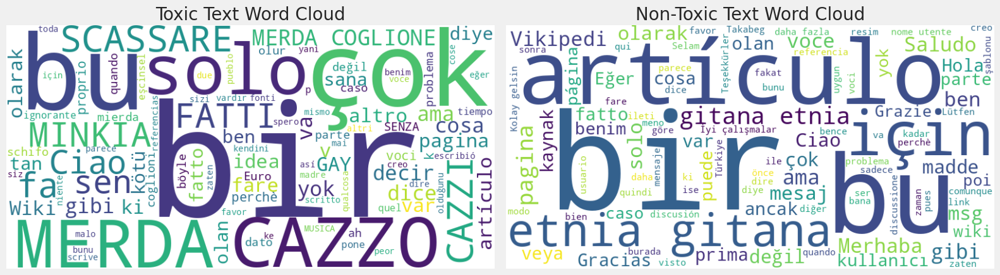

In [ ]:
# Word clouds by toxicity
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# Toxic text word cloud
if toxic_df.shape[0] > 0:
    toxic_text = ' '.join(toxic_df['feedback_text'].astype(str).tolist())
    toxic_wordcloud = WordCloud(width=800, height=400,
                              background_color='white',
                              stopwords=stop_words,
                              max_words=100,
                              contour_width=3,
                              contour_color='darkred').generate(toxic_text)

    ax[0].imshow(toxic_wordcloud, interpolation='bilinear')
    ax[0].axis('off')
    ax[0].set_title('Toxic Text Word Cloud', fontsize=20)
else:
    ax[0].text(0.5, 0.5, 'No toxic texts available',
              horizontalalignment='center', verticalalignment='center',
              fontsize=20)
    ax[0].axis('off')

# Non-toxic text word cloud
if non_toxic_df.shape[0] > 0:
    non_toxic_text = ' '.join(non_toxic_df['feedback_text'].astype(str).tolist())
    non_toxic_wordcloud = WordCloud(width=800, height=400,
                                  background_color='white',
                                  stopwords=stop_words,
                                  max_words=100,
                                  contour_width=3,
                                  contour_color='darkgreen').generate(non_toxic_text)

    ax[1].imshow(non_toxic_wordcloud, interpolation='bilinear')
    ax[1].axis('off')
    ax[1].set_title('Non-Toxic Text Word Cloud', fontsize=20)
else:
    ax[1].text(0.5, 0.5, 'No non-toxic texts available',
              horizontalalignment='center', verticalalignment='center',
              fontsize=20)
    ax[1].axis('off')

plt.tight_layout()
plt.show()


🌎 LANGUAGE ANALYSIS


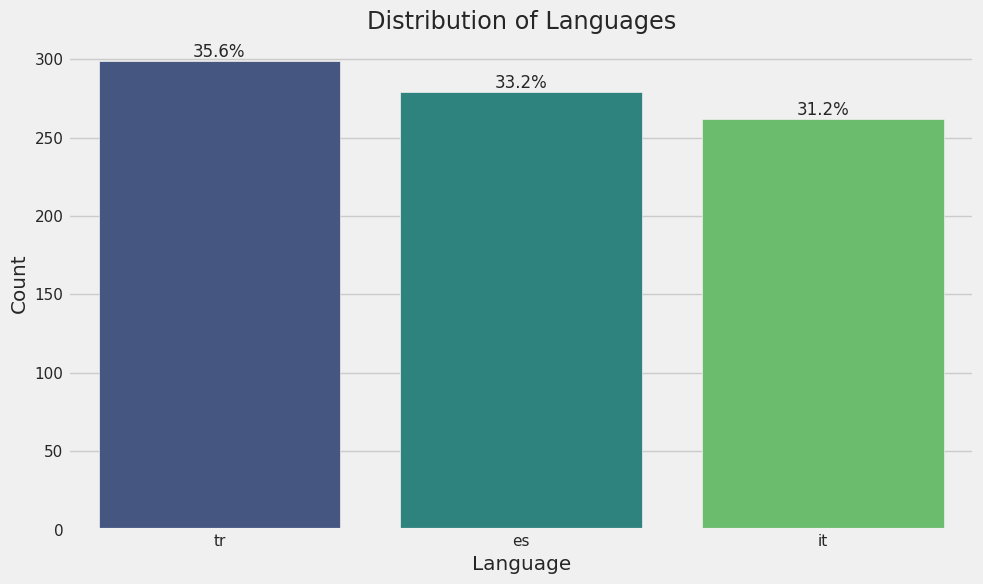

In [ ]:
    print("\n" + "="*80)
    print("🌎 LANGUAGE ANALYSIS")
    print("="*80)

    # Language distribution
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x='lang', palette='viridis')
    plt.title('Distribution of Languages')
    plt.xlabel('Language')
    plt.ylabel('Count')
    total = df.shape[0]
    for p in plt.gca().patches:
        percentage = 100 * p.get_height() / total
        plt.gca().annotate(f'{percentage:.1f}%',
                          (p.get_x() + p.get_width() / 2., p.get_height()),
                          ha='center', va='bottom')
    plt.tight_layout()
    plt.show()

Text(0, 0.5, 'Toxicity Percentage (%)')

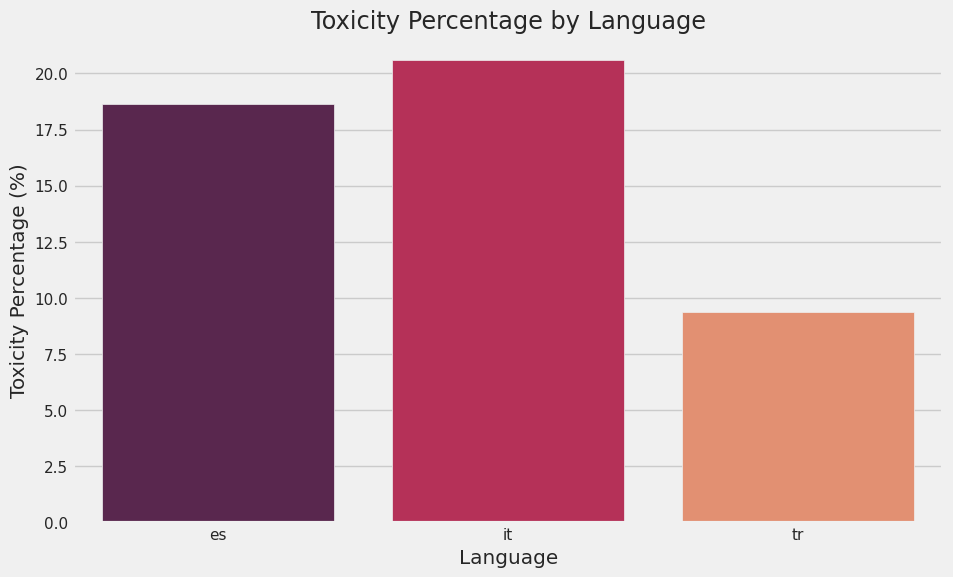

In [ ]:
        lang_toxic = df.groupby('lang')['toxic'].agg(['mean', 'count']).reset_index()
        lang_toxic['mean'] = lang_toxic['mean'] * 100  # Convert to percentage

        # Plot toxicity percentage by language
        plt.figure(figsize=(10, 6))
        ax = sns.barplot(data=lang_toxic, x='lang', y='mean', palette='rocket')
        plt.title('Toxicity Percentage by Language')
        plt.xlabel('Language')
        plt.ylabel('Toxicity Percentage (%)')

<Figure size 1200x800 with 0 Axes>

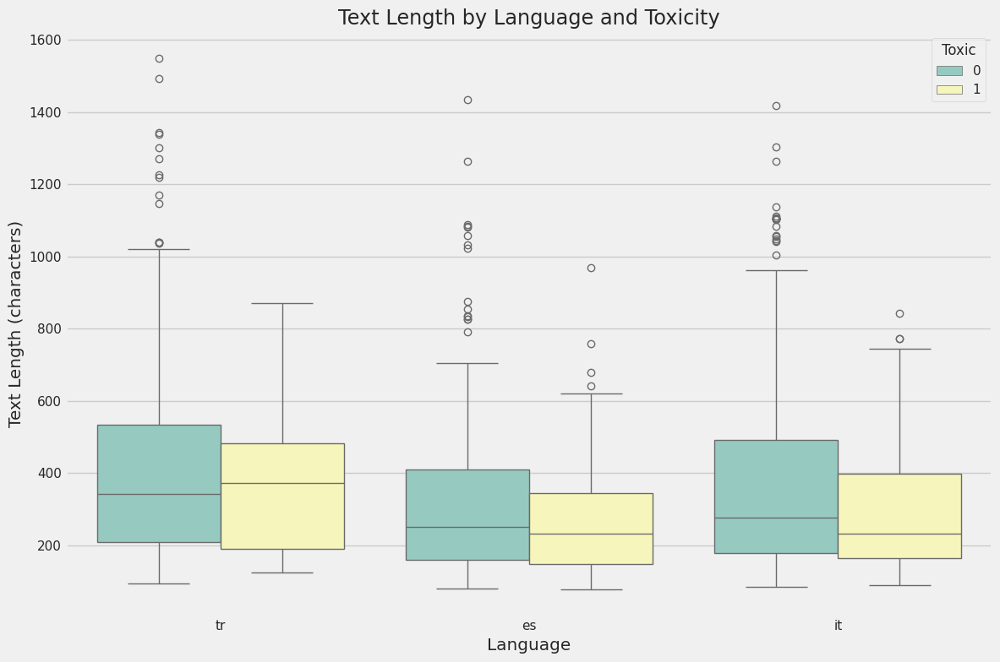

In [ ]:


        # Add percentage labels
        for p in ax.patches:
            ax.annotate(f'{p.get_height():.1f}%',
                      (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='bottom')

        # Add sample size
        for i, row in lang_toxic.iterrows():
            ax.text(i, 5, f'n={row["count"]}', ha='center')

        plt.tight_layout()
        plt.show()

        # Text length by language and toxicity
        plt.figure(figsize=(12, 8))
        sns.boxplot(x='lang', y='text_length', hue='toxic', data=df, palette='Set3')
        plt.title('Text Length by Language and Toxicity')
        plt.xlabel('Language')
        plt.ylabel('Text Length (characters)')
        plt.legend(title='Toxic')
        plt.tight_layout()
        plt.show()

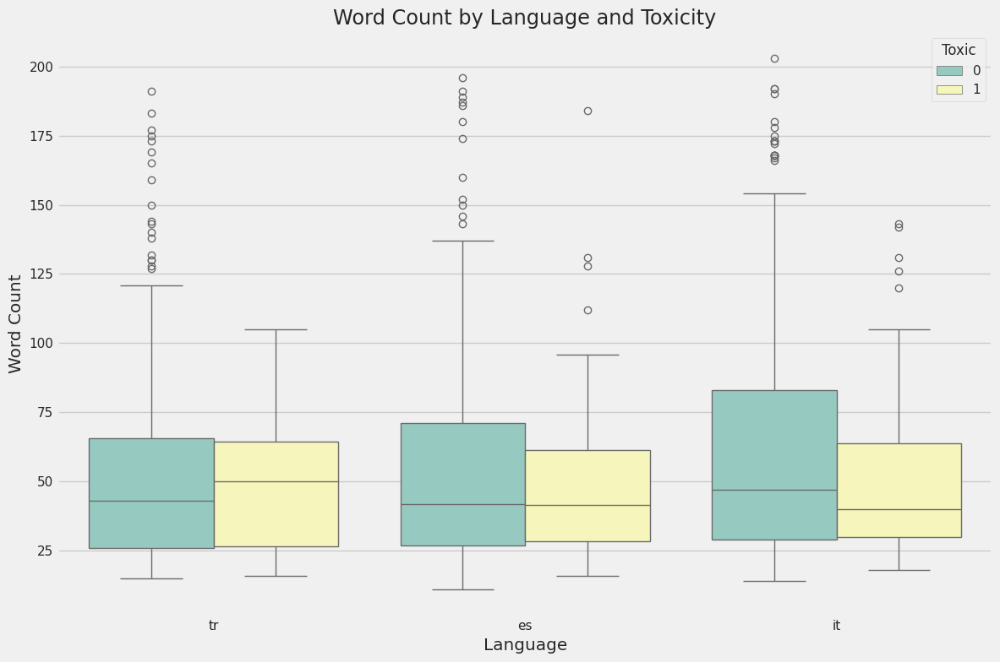

In [ ]:
        # Word count by language and toxicity
        plt.figure(figsize=(12, 8))
        sns.boxplot(x='lang', y='word_count', hue='toxic', data=df, palette='Set3')
        plt.title('Word Count by Language and Toxicity')
        plt.xlabel('Language')
        plt.ylabel('Word Count')
        plt.legend(title='Toxic')
        plt.tight_layout()
        plt.show()

In [ ]:
# Function to get top n-grams
def get_top_ngrams(corpus, n_gram_range=(1, 1), top_n=10):
    """Extract top n-grams from corpus"""
    vectorizer = CountVectorizer(ngram_range=n_gram_range, stop_words='english')
    X = vectorizer.fit_transform(corpus)
    words = vectorizer.get_feature_names_out()
    word_frequencies = np.sum(X.toarray(), axis=0)
    word_freq_pairs = [(word, word_frequencies[i]) for i, word in enumerate(words)]
    return sorted(word_freq_pairs, key=lambda x: x[1], reverse=True)[:top_n]


📊 N-GRAM ANALYSIS

Top 20 unigrams in toxic texts:
- que: 137
- la: 102
- che: 89
- di: 85
- non: 62
- es: 57
- el: 53
- se: 53
- en: 48
- lo: 44
- si: 44
- bir: 42
- il: 42
- da: 35
- una: 32
- los: 30
- su: 30
- por: 29
- tu: 29
- ve: 29


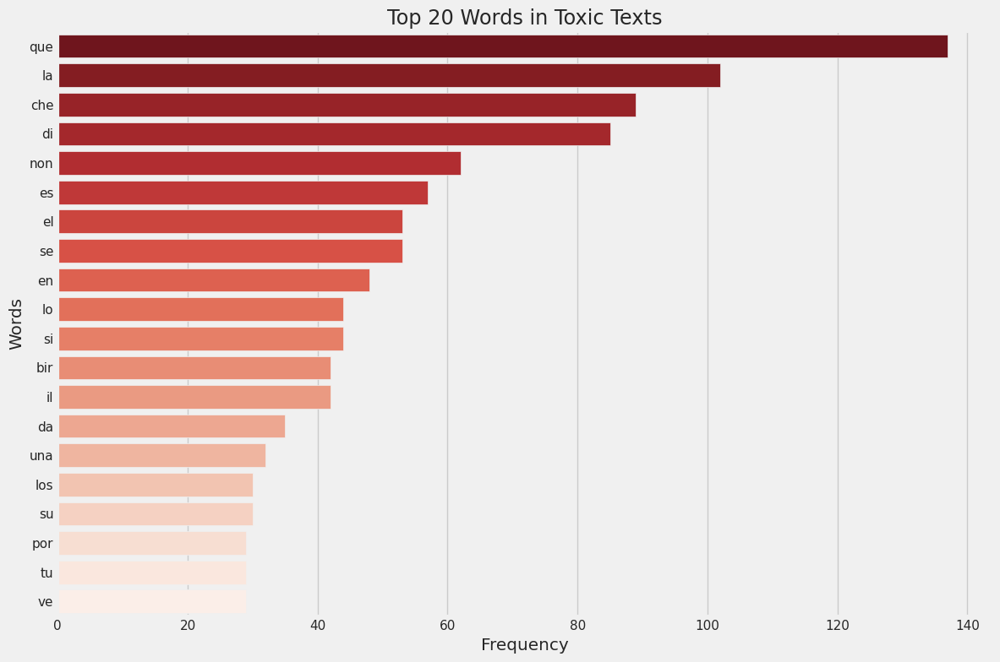


Top 20 unigrams in non-toxic texts:
- la: 581
- que: 544
- di: 348
- che: 343
- en: 296
- bir: 289
- non: 282
- el: 272
- il: 225
- se: 224
- ve: 222
- bu: 212
- una: 203
- si: 185
- lo: 178
- da: 172
- por: 165
- es: 161
- için: 152
- mi: 152


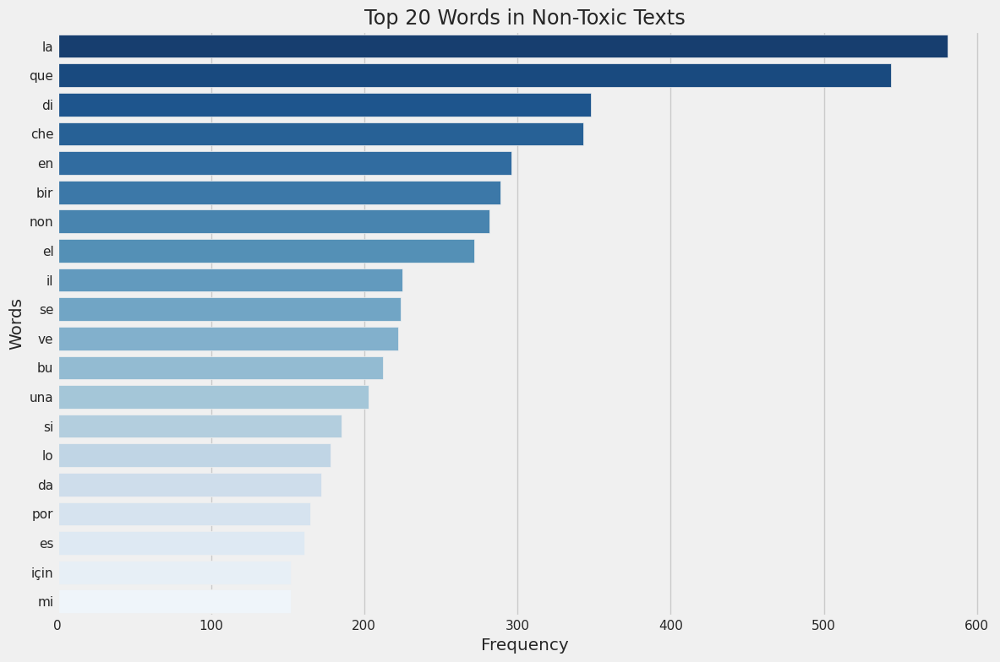


Top 15 bigrams in toxic texts:
- lo que: 17
- que es: 14
- non ci: 13
- cazzi tuoi: 10
- ci scassare: 10
- coglione non: 10
- fatti cazzi: 10
- la minkia: 10
- minkia fatti: 10
- scassare la: 10
- tuoi merda: 10
- merda coglione: 9
- que se: 9
- 78 167: 8
- 167 99: 7


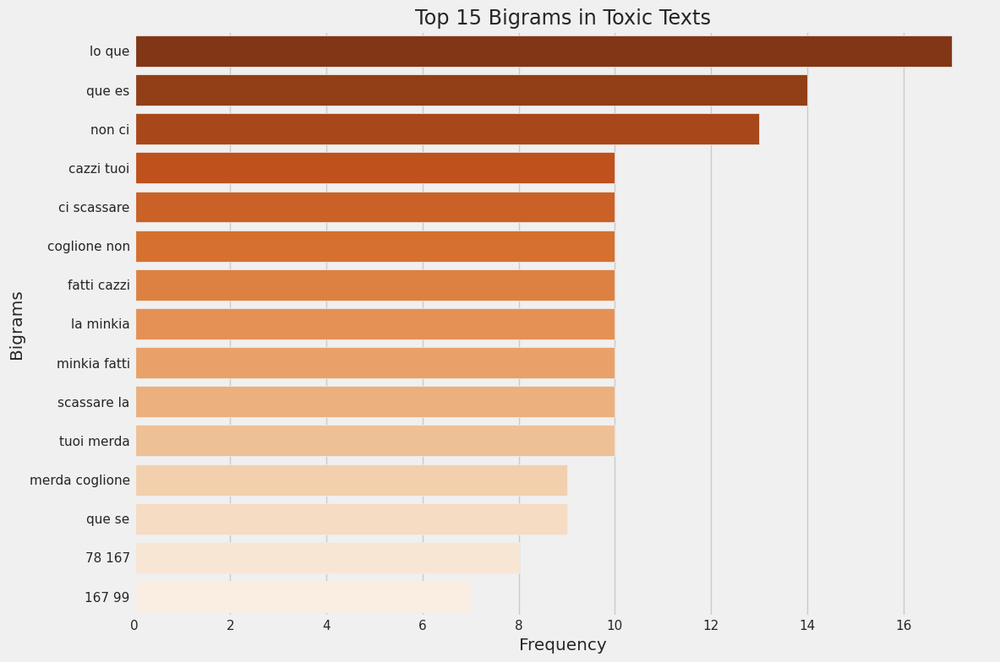

In [ ]:
if 'feedback_text' in df.columns and 'toxic' in df.columns:
    print("\n" + "="*80)
    print("📊 N-GRAM ANALYSIS")
    print("="*80)

    # Get top unigrams for toxic and non-toxic texts
    try:
        toxic_texts = df[df['toxic'] == 1]['feedback_text'].astype(str).tolist()
        non_toxic_texts = df[df['toxic'] == 0]['feedback_text'].astype(str).tolist()

        if toxic_texts:
            top_toxic_unigrams = get_top_ngrams(toxic_texts, (1, 1), 20)
            print("\nTop 20 unigrams in toxic texts:")
            for word, freq in top_toxic_unigrams:
                print(f"- {word}: {freq}")

            # Visualize top toxic unigrams
            plt.figure(figsize=(12, 8))
            words, freqs = zip(*top_toxic_unigrams)
            sns.barplot(x=list(freqs), y=list(words), palette='Reds_r')
            plt.title('Top 20 Words in Toxic Texts')
            plt.xlabel('Frequency')
            plt.ylabel('Words')
            plt.tight_layout()
            plt.show()

        if non_toxic_texts:
            top_non_toxic_unigrams = get_top_ngrams(non_toxic_texts, (1, 1), 20)
            print("\nTop 20 unigrams in non-toxic texts:")
            for word, freq in top_non_toxic_unigrams:
                print(f"- {word}: {freq}")

            # Visualize top non-toxic unigrams
            plt.figure(figsize=(12, 8))
            words, freqs = zip(*top_non_toxic_unigrams)
            sns.barplot(x=list(freqs), y=list(words), palette='Blues_r')
            plt.title('Top 20 Words in Non-Toxic Texts')
            plt.xlabel('Frequency')
            plt.ylabel('Words')
            plt.tight_layout()
            plt.show()

        # Get top bigrams for toxic texts
        if toxic_texts:
            top_toxic_bigrams = get_top_ngrams(toxic_texts, (2, 2), 15)
            print("\nTop 15 bigrams in toxic texts:")
            for bigram, freq in top_toxic_bigrams:
                print(f"- {bigram}: {freq}")

            # Visualize top toxic bigrams
            plt.figure(figsize=(12, 8))
            bigrams, freqs = zip(*top_toxic_bigrams)
            sns.barplot(x=list(freqs), y=list(bigrams), palette='Oranges_r')
            plt.title('Top 15 Bigrams in Toxic Texts')
            plt.xlabel('Frequency')
            plt.ylabel('Bigrams')
            plt.tight_layout()
            plt.show()
    except Exception as e:
        print(f"Error in n-gram analysis: {str(e)}")

In [ ]:
# ## Summary of Key Findings

print("\n" + "="*80)
print("📝 SUMMARY OF KEY FINDINGS")
print("="*80)

# Dataset information
print(f"• Dataset contains {df.shape[0]} rows and {df.shape[1]} columns")

# Language distribution
if 'lang' in df.columns:
    lang_counts = df['lang'].value_counts()
    print("\n• Language distribution:")
    for lang, count in lang_counts.items():
        percentage = 100 * count / df.shape[0]
        print(f"  - {lang}: {count} samples ({percentage:.1f}%)")

# Toxicity distribution
if 'toxic' in df.columns:
    toxic_percentage = df['toxic'].mean() * 100
    print(f"\n• Overall toxicity rate: {toxic_percentage:.2f}%")

    # Toxicity by language
    if 'lang' in df.columns:
        print("\n• Toxicity rates by language:")
        for lang in df['lang'].unique():
            lang_df = df[df['lang'] == lang]
            lang_toxic_pct = lang_df['toxic'].mean() * 100
            print(f"  - {lang}: {lang_toxic_pct:.2f}% toxic")

# Text features
if 'feedback_text' in df.columns:
    print("\n• Text features summary:")
    print(f"  - Average text length: {df['text_length'].mean():.2f} characters")
    print(f"  - Average word count: {df['word_count'].mean():.2f} words")

    # Text features by toxicity
    if 'toxic' in df.columns:
        print("\n• Text features comparison (toxic vs non-toxic):")

        for feature in text_features:
            toxic_mean = toxic_df[feature].mean()
            non_toxic_mean = non_toxic_df[feature].mean()
            percentage_diff = ((toxic_mean - non_toxic_mean) / non_toxic_mean) * 100

            # Determine if toxic texts have more or less of this feature
            direction = "more" if percentage_diff > 0 else "fewer"
            print(f"  - Toxic texts have {abs(percentage_diff):.2f}% {direction} {feature.replace('_', ' ')}")

# Overall insights
print("\n• Key insights:")
if 'toxic' in df.columns and 'feedback_text' in df.columns:
    # Get most significant differences
    feature_diffs = []
    for feature in text_features:
        toxic_mean = toxic_df[feature].mean()
        non_toxic_mean = non_toxic_df[feature].mean()
        percentage_diff = ((toxic_mean - non_toxic_mean) / non_toxic_mean) * 100
        feature_diffs.append((feature, abs(percentage_diff)))

    # Sort by absolute difference
    feature_diffs.sort(key=lambda x: x[1], reverse=True)

    # Report top 3 differences
    for i, (feature, diff) in enumerate(feature_diffs[:3]):
        toxic_mean = toxic_df[feature].mean()
        non_toxic_mean = non_toxic_df[feature].mean()
        percentage_diff = ((toxic_mean - non_toxic_mean) / non_toxic_mean) * 100
        direction = "more" if percentage_diff > 0 else "fewer"
        feature_name = feature.replace('_', ' ')
        print(f"  - The most significant difference #{i+1}: Toxic texts have {abs(percentage_diff):.2f}% {direction} {feature_name}")

# Correlation insights
if 'toxic' in df.columns and 'feedback_text' in df.columns:
    # Get correlations with toxicity
    correlations = []
    for feature in text_features:
        corr = df[feature].corr(df['toxic'])
        correlations.append((feature, corr))

    # Sort by absolute correlation
    correlations.sort(key=lambda x: abs(x[1]), reverse=True)

    # Report top 3 correlations
    print("\n• Top feature correlations with toxicity:")
    for i, (feature, corr) in enumerate(correlations[:3]):
        feature_name = feature.replace('_', ' ')
        direction = "positive" if corr > 0 else "negative"
        print(f"  - {feature_name}: {abs(corr):.3f} ({direction})")

# Final remarks
print("\nThis analysis provides insights into the multilingual toxic text classification dataset.")
print("The findings can be used to develop better models for detecting toxic content across languages.")

print("\n" + "="*80)
print("ANALYSIS COMPLETE")
print("="*80)


📝 SUMMARY OF KEY FINDINGS
• Dataset contains 840 rows and 10 columns

• Language distribution:
  - tr: 299 samples (35.6%)
  - es: 279 samples (33.2%)
  - it: 262 samples (31.2%)

• Overall toxicity rate: 15.95%

• Toxicity rates by language:
  - tr: 9.36% toxic
  - es: 18.64% toxic
  - it: 20.61% toxic

• Text features summary:
  - Average text length: 368.30 characters
  - Average word count: 55.66 words

• Text features comparison (toxic vs non-toxic):
  - Toxic texts have 17.39% fewer text length
  - Toxic texts have 10.30% fewer word count
  - Toxic texts have 10.80% fewer special char count
  - Toxic texts have 133.71% more uppercase count
  - Toxic texts have 318.92% more exclamation count
  - Toxic texts have 79.07% more question count

• Key insights:
  - The most significant difference #1: Toxic texts have 318.92% more exclamation count
  - The most significant difference #2: Toxic texts have 133.71% more uppercase count
  - The most significant difference #3: Toxic texts ha

# **Data Preprocessing**

# **Text Preprocessing and Feature Extraction Functions**

In [ ]:
# ----------------------- TEXT PREPROCESSING FUNCTIONS -----------------------

def clean_text(text):
    """Thorough text cleaning with multiple steps."""
    if not isinstance(text, str):
        return ""

    # Convert to lowercase
    text = text.lower()

    # Remove URLs, HTML tags, and emails
    text = re.sub(r'https?://\S+|www\.\S+', '', text)
    text = re.sub(r'<.*?>', '', text)
    text = re.sub(r'\S*@\S*\s?', '', text)

    # Replace repeated characters (e.g., "goooood" -> "good")
    text = re.sub(r'(.)\1{2,}', r'\1\1', text)

    # Replace numbers with space
    text = re.sub(r'\d+', ' ', text)

    # Keep some important punctuation that might indicate toxicity
    text = re.sub(r'[^\w\s!?]', ' ', text)

    # Remove extra whitespaces
    text = re.sub(r'\s+', ' ', text).strip()

    return text

def extract_text_features(text):
    """Extract rich text features that might correlate with toxicity."""
    if not isinstance(text, str):
        return {
            'length': 0,
            'word_count': 0,
            'avg_word_length': 0,
            'uppercase_ratio': 0,
            'exclamation_count': 0,
            'question_count': 0,
            'special_char_ratio': 0,
            'punctuation_ratio': 0,
            'repeated_chars_count': 0
        }

    # Basic statistics
    length = len(text)
    words = text.split()
    word_count = len(words)
    avg_word_length = sum(len(word) for word in words) / max(1, word_count)

    # Character-level features
    uppercase_letters = sum(1 for char in text if char.isupper())
    uppercase_ratio = uppercase_letters / max(1, len(text.replace(" ", "")))
    exclamation_count = text.count('!')
    question_count = text.count('?')

    # Potential markers of offensive content
    special_chars = sum(1 for char in text if not char.isalnum() and not char.isspace())
    special_char_ratio = special_chars / max(1, length)

    punctuation_count = sum(1 for char in text if char in string.punctuation)
    punctuation_ratio = punctuation_count / max(1, length)

    # Count repeated character patterns (like "!!!" or "???")
    repeated_chars_count = len(re.findall(r'(.)\1{2,}', text))

    return {
        'length': length,
        'word_count': word_count,
        'avg_word_length': avg_word_length,
        'uppercase_ratio': uppercase_ratio,
        'exclamation_count': exclamation_count,
        'question_count': question_count,
        'special_char_ratio': special_char_ratio,
        'punctuation_ratio': punctuation_ratio,
        'repeated_chars_count': repeated_chars_count
    }

def get_sentiment_features(text):
    """Extract sentiment polarity and subjectivity."""
    try:
        analysis = TextBlob(text)
        return {
            'polarity': analysis.sentiment.polarity,
            'subjectivity': analysis.sentiment.subjectivity
        }
    except:
        return {'polarity': 0, 'subjectivity': 0}

# Create an expanded offensive words dictionary
# Note: This is a minimal set for demonstration purposes
offensive_words = set([
    # Profanity & insults
    'fuck', 'shit', 'bitch', 'ass', 'damn', 'crap', 'idiot', 'stupid', 'dumb',
    'retard', 'moron', 'bastard', 'piss', 'dick', 'cock', 'pussy', 'whore', 'slut',
    'hell', 'wtf', 'stfu', 'gtfo', 'shut', 'dumbass', 'retarded', 'loser', 'jerk',
    'screw', 'lame', 'suck', 'trash', 'garbage', 'scum', 'pathetic', 'worthless',

    # Hate speech / slurs
    'fag', 'gay', 'queer', 'nigger', 'nigga', 'kike', 'spic', 'chink', 'gook',
    'tranny', 'dyke', 'coon', 'towelhead', 'cameljockey', 'shemale', 'hobo', 'cripple',

    # Aggressive or violent language
    'kill', 'die', 'hate', 'murder', 'attack', 'burn', 'destroy', 'bomb', 'stab', 'shoot',

    # Internet slang / implicit toxicity
    'noob', 'troll', 'simp', 'incel', 'beta', 'kys', 'lmao', 'rofl', 'smh', 'fml', 'cringe',

    # Derogatory phrases
    'go to hell', 'drop dead', 'eat shit', 'shut up', 'you suck', 'get lost', 'fatass',
    'ugly', 'nasty', 'gross', 'annoying', 'disgusting', 'kill yourself'
])

def count_offensive_terms(text, offensive_words_set):
    """Count potentially offensive terms in text."""
    if not isinstance(text, str):
        return 0
    text = text.lower()
    words = re.findall(r'\b\w+\b', text)
    return sum(1 for word in words if word in offensive_words_set)

# **Translation Functions for Text Processing and Batch Translation**

In [ ]:
# ----------------------- TRANSLATION FUNCTIONS -----------------------

def download_argos_package(from_code, to_code='en'):
    """Download language translation packages."""
    try:
        # Get available packages
        available_packages = argostranslate.package.get_available_packages()

        # Find the right package
        pkg = next((p for p in available_packages if p.from_code == from_code and p.to_code == to_code), None)
        if pkg is None:
            print(f"No package found for {from_code} → {to_code}")
            return

        # Install package
        downloaded_path = pkg.download()
        argostranslate.package.install_from_path(downloaded_path)
        print(f"Installed translation package: {from_code} → {to_code}")
    except Exception as e:
        print(f"Error downloading Argos package: {e}")

def safe_translate(text, from_code, to_code='en'):
    """Safely translate text handling exceptions."""
    if not isinstance(text, str) or not text.strip():
        return ""
    try:
        installed_languages = argostranslate.translate.get_installed_languages()
        from_lang = next((lang for lang in installed_languages if lang.code == from_code), None)
        to_lang = next((lang for lang in installed_languages if lang.code == to_code), None)

        if from_lang and to_lang:
            translation = from_lang.get_translation(to_lang)
            return translation.translate(text.strip())
        else:
            return text  # Return original if translation not available
    except Exception as e:
        print(f"Translation failed: {e}")
        return text  # Fall back to original text

def batch_translate_argos(df, text_column, lang_column):
    """Translate a batch of texts in a dataframe."""
    df = df.copy()
    df['translated_text'] = df[text_column]

    # Get unique languages needing translation
    langs_needed = set(df[lang_column].dropna().unique())
    langs_needed.discard('en')  # Skip English

    print(f"Downloading language models for: {langs_needed}")
    for lang in langs_needed:
        download_argos_package(lang, 'en')

    print("Translating non-English texts...")
    for i, row in tqdm.tqdm(df.iterrows(), total=len(df)):
        text = row[text_column]
        lang = row[lang_column]
        if lang != 'en' and isinstance(text, str):
            translated = safe_translate(text, lang)
            df.at[i, 'translated_text'] = translated

    return df

In [ ]:
print("\nTranslating validation data...")
validation_translated = batch_translate_argos(validation_df, 'feedback_text', 'lang')

print("\nTranslating test data...")
test_translated = batch_translate_argos(test_df, 'content', 'lang')

validation_translated.to_csv('/content/drive/MyDrive/dataset/translated/validation_translated.csv', index=False)
test_translated.to_csv('/content/drive/MyDrive/dataset/translated/test_translated.csv', index=False)
print("Translated data saved to CSV files")

# **Data Preparation: Text Cleaning, Feature Extraction, and Normalization**

In [ ]:
# ----------------------- DATA PREPARATION -----------------------

validation_translated = pd.read_csv('/kaggle/input/dataset/validation_translated.csv')
test_translated = pd.read_csv('/kaggle/input/dataset/test_translated.csv')

print("\nCleaning and preprocessing text data...")
# Clean text
train_df['cleaned_text'] = train_df['feedback_text'].apply(clean_text)
validation_translated['cleaned_text'] = validation_translated['translated_text'].apply(clean_text)
test_translated['cleaned_text'] = test_translated['translated_text'].apply(clean_text)

# Extract statistical features
print("Extracting text features...")
train_text_features = pd.DataFrame(train_df['feedback_text'].apply(extract_text_features).tolist())
validation_text_features = pd.DataFrame(validation_translated['translated_text'].apply(extract_text_features).tolist())
test_text_features = pd.DataFrame(test_translated['translated_text'].apply(extract_text_features).tolist())

# Extract sentiment features
print("Adding sentiment analysis features...")
train_sentiment = pd.DataFrame(train_df['cleaned_text'].apply(get_sentiment_features).tolist())
validation_sentiment = pd.DataFrame(validation_translated['cleaned_text'].apply(get_sentiment_features).tolist())
test_sentiment = pd.DataFrame(test_translated['cleaned_text'].apply(get_sentiment_features).tolist())

# Count offensive terms
print("Adding offensive language features...")
train_text_features['offensive_word_count'] = train_df['cleaned_text'].apply(
    lambda x: count_offensive_terms(x, offensive_words))
validation_text_features['offensive_word_count'] = validation_translated['cleaned_text'].apply(
    lambda x: count_offensive_terms(x, offensive_words))
test_text_features['offensive_word_count'] = test_translated['cleaned_text'].apply(
    lambda x: count_offensive_terms(x, offensive_words))

# Combine all features
train_features_df = pd.concat([train_text_features, train_sentiment], axis=1)
validation_features_df = pd.concat([validation_text_features, validation_sentiment], axis=1)
test_features_df = pd.concat([test_text_features, test_sentiment], axis=1)

# Normalize features
print("Normalizing features...")
scaler = StandardScaler()
train_features_scaled = scaler.fit_transform(train_features_df)
validation_features_scaled = scaler.transform(validation_features_df)
test_features_scaled = scaler.transform(test_features_df)


Cleaning and preprocessing text data...
Extracting text features...
Adding sentiment analysis features...
Adding offensive language features...
Normalizing features...


# **Text Vectorization: TF-IDF Word and Character Features Creation**

In [ ]:
# ----------------------- TEXT VECTORIZATION -----------------------

# Word level TF-IDF with n-grams
print("\nCreating word-level TF-IDF features...")
word_vectorizer = TfidfVectorizer(
    max_features=20000,
    min_df=3,
    max_df=0.9,
    strip_accents='unicode',
    analyzer='word',
    token_pattern=r'\w{1,}',
    ngram_range=(1, 3),
    use_idf=True,
    smooth_idf=True,
    sublinear_tf=True
)

# Character level TF-IDF (captures patterns regardless of language)
print("Creating character-level TF-IDF features...")
char_vectorizer = TfidfVectorizer(
    max_features=15000,
    min_df=2,
    max_df=0.9,
    strip_accents='unicode',
    analyzer='char',
    ngram_range=(2, 6),  # Expanded character n-gram range
    use_idf=True,
    smooth_idf=True,
    sublinear_tf=True
)

# Fit and transform the training data
word_tfidf_train = word_vectorizer.fit_transform(train_df['cleaned_text'])
char_tfidf_train = char_vectorizer.fit_transform(train_df['cleaned_text'])

# Transform validation and test data
word_tfidf_val = word_vectorizer.transform(validation_translated['cleaned_text'])
char_tfidf_val = char_vectorizer.transform(validation_translated['cleaned_text'])
word_tfidf_test = word_vectorizer.transform(test_translated['cleaned_text'])
char_tfidf_test = char_vectorizer.transform(test_translated['cleaned_text'])

# Combine all features
print("Combining features into final training matrices...")
X_train = hstack([word_tfidf_train, char_tfidf_train,
                 csr_matrix(train_features_scaled)])
X_val = hstack([word_tfidf_val, char_tfidf_val,
               csr_matrix(validation_features_scaled)])
X_test = hstack([word_tfidf_test, char_tfidf_test,
                csr_matrix(test_features_scaled)])

print(f"Final training feature shape: {X_train.shape}")
print(f"Final validation feature shape: {X_val.shape}")
print(f"Final test feature shape: {X_test.shape}")


Creating word-level TF-IDF features...
Creating character-level TF-IDF features...
Combining features into final training matrices...
Final training feature shape: (23473, 35012)
Final validation feature shape: (840, 35012)
Final test feature shape: (6000, 35012)


# **Logistic Regression**

# **Implementing Logistic Regression**

# **Model Training with Multi-Task Approach for Toxicity Detection**

In [ ]:
# ----------------------- MODEL TRAINING WITH MULTI-TASK APPROACH -----------------------

# Define target variables
print("\nPreparing training targets...")
y_train_labels = train_df[['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']]
y_val = validation_translated['toxic']

# Dictionary to store models for each toxicity dimension
dimension_models = {}

# Train a model for each dimension with balanced class weights and SMOTE
print("Training separate model for each toxicity dimension...")
for label in ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']:
    print(f"Training model for {label}...")

    # Handle class imbalance with SMOTE (more effective than simple class weights)
    smote = SMOTE(random_state=42, sampling_strategy=0.5)  # Create 50% positive samples
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, train_df[label])

    # Create and train model with optimized hyperparameters
    model = LogisticRegression(
        C=2.0,  # Regularization strength
        solver='liblinear',  # Fast solver for small/medium datasets
        max_iter=1000,
        class_weight='balanced',  # Build-in class weighting
        random_state=42,
        n_jobs=-1  # Use all cores
    )
    model.fit(X_train_resampled, y_train_resampled)
    dimension_models[label] = model

    # Show class distribution after SMOTE
    print(f"  Class distribution after SMOTE: {Counter(y_train_resampled)}")

    # Calculate training performance
    train_preds = model.predict(X_train_resampled)
    train_accuracy = accuracy_score(y_train_resampled, train_preds)
    train_f1 = f1_score(y_train_resampled, train_preds)
    print(f"  Training Accuracy: {train_accuracy:.4f}, F1: {train_f1:.4f}")


Preparing training targets...
Training separate model for each toxicity dimension...
Training model for toxic...
  Class distribution after SMOTE: Counter({0: 21277, 1: 10638})
  Training Accuracy: 0.9855, F1: 0.9786
Training model for abusive...
  Class distribution after SMOTE: Counter({0: 23297, 1: 11648})
  Training Accuracy: 0.9957, F1: 0.9936
Training model for vulgar...
  Class distribution after SMOTE: Counter({0: 22198, 1: 11099})
  Training Accuracy: 0.9933, F1: 0.9901
Training model for menace...
  Class distribution after SMOTE: Counter({0: 23407, 1: 11703})
  Training Accuracy: 0.9993, F1: 0.9990
Training model for offense...
  Class distribution after SMOTE: Counter({0: 22323, 1: 11161})
  Training Accuracy: 0.9904, F1: 0.9857
Training model for bigotry...
  Class distribution after SMOTE: Counter({0: 23280, 1: 11640})
  Training Accuracy: 0.9973, F1: 0.9960


# **Ensemble Prediction and Threshold Optimization for Toxicity Classification**


Generating ensemble predictions...

Finding optimal threshold on validation data:
Threshold 0.10 - Precision: 0.6061, Recall: 0.4478, F1: 0.5150
Threshold 0.15 - Precision: 0.6761, Recall: 0.3582, F1: 0.4683
Threshold 0.20 - Precision: 0.7708, Recall: 0.2761, F1: 0.4066
Threshold 0.25 - Precision: 0.7750, Recall: 0.2313, F1: 0.3563
Threshold 0.30 - Precision: 0.7586, Recall: 0.1642, F1: 0.2699
Threshold 0.35 - Precision: 0.8000, Recall: 0.1493, F1: 0.2516
Threshold 0.40 - Precision: 0.8000, Recall: 0.1194, F1: 0.2078
Threshold 0.45 - Precision: 0.8000, Recall: 0.0896, F1: 0.1611
Threshold 0.50 - Precision: 1.0000, Recall: 0.0672, F1: 0.1259
Threshold 0.55 - Precision: 1.0000, Recall: 0.0522, F1: 0.0993
Threshold 0.60 - Precision: 1.0000, Recall: 0.0299, F1: 0.0580
Threshold 0.65 - Precision: 1.0000, Recall: 0.0149, F1: 0.0294
Threshold 0.70 - Precision: 1.0000, Recall: 0.0149, F1: 0.0294
Threshold 0.75 - Precision: 1.0000, Recall: 0.0149, F1: 0.0294
Threshold 0.80 - Precision: 1.0000,

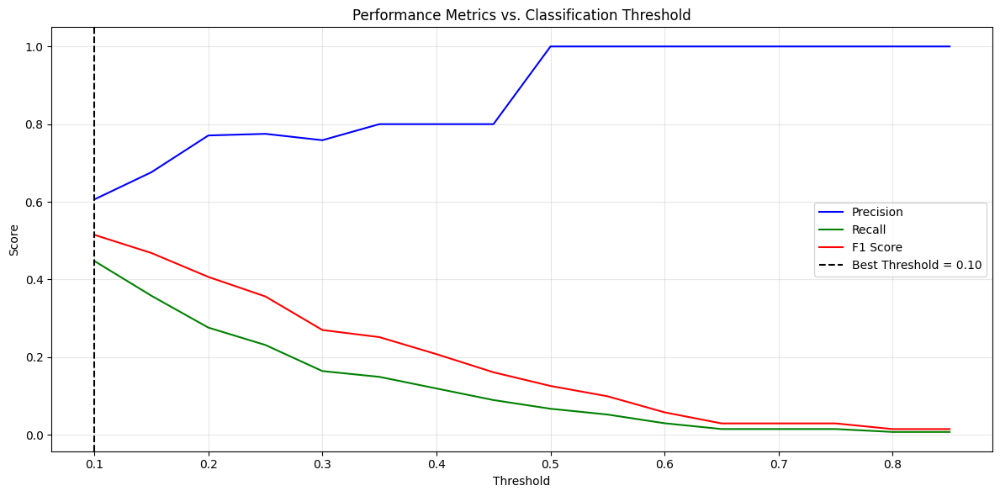

In [ ]:
# ----------------------- ENSEMBLE PREDICTION & THRESHOLD OPTIMIZATION -----------------------

# Calculate ensemble predictions for validation set
print("\nGenerating ensemble predictions...")
val_probs_ensemble = np.zeros(X_val.shape[0])
for label, model in dimension_models.items():
    val_probs_ensemble += model.predict_proba(X_val)[:, 1]
val_probs_ensemble /= len(dimension_models)  # Average probabilities

# Calculate ensemble predictions for test set
test_probs_ensemble = np.zeros(X_test.shape[0])
for label, model in dimension_models.items():
    test_probs_ensemble += model.predict_proba(X_test)[:, 1]
test_probs_ensemble /= len(dimension_models)

# Find optimal threshold by optimizing F1 score on validation data
print("\nFinding optimal threshold on validation data:")
thresholds = np.arange(0.1, 0.91, 0.05)
best_f1 = 0
best_threshold = 0.5

f1_scores = []
precisions = []
recalls = []
threshold_values = []

for threshold in thresholds:
    val_preds_temp = (val_probs_ensemble >= threshold).astype(int)
    precision = precision_score(y_val, val_preds_temp, pos_label=1, zero_division=0)
    recall = recall_score(y_val, val_preds_temp, pos_label=1, zero_division=0)

    if precision + recall > 0:
        f1 = 2 * (precision * recall) / (precision + recall)
        print(f"Threshold {threshold:.2f} - Precision: {precision:.4f}, Recall: {recall:.4f}, F1: {f1:.4f}")

        threshold_values.append(threshold)
        precisions.append(precision)
        recalls.append(recall)
        f1_scores.append(f1)

        if f1 > best_f1:
            best_f1 = f1
            best_threshold = threshold

print(f"\nBest threshold: {best_threshold:.2f} with F1 Score: {best_f1:.4f}")

# Plot threshold vs metrics
plt.figure(figsize=(12, 6))
plt.plot(threshold_values, precisions, 'b-', label='Precision')
plt.plot(threshold_values, recalls, 'g-', label='Recall')
plt.plot(threshold_values, f1_scores, 'r-', label='F1 Score')
plt.axvline(x=best_threshold, color='k', linestyle='--', label=f'Best Threshold = {best_threshold:.2f}')
plt.title('Performance Metrics vs. Classification Threshold')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# **Validation Evaluation: Accuracy, Classification Report, Confusion Matrix, and ROC Curv**

Validation Accuracy: 0.8655

Validation Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.94      0.92       706
           1       0.61      0.45      0.52       134

    accuracy                           0.87       840
   macro avg       0.75      0.70      0.72       840
weighted avg       0.85      0.87      0.86       840



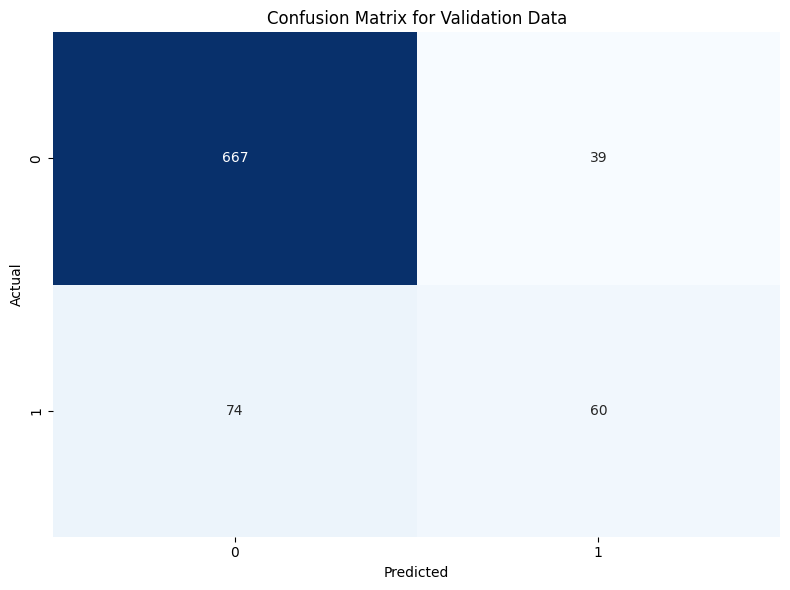

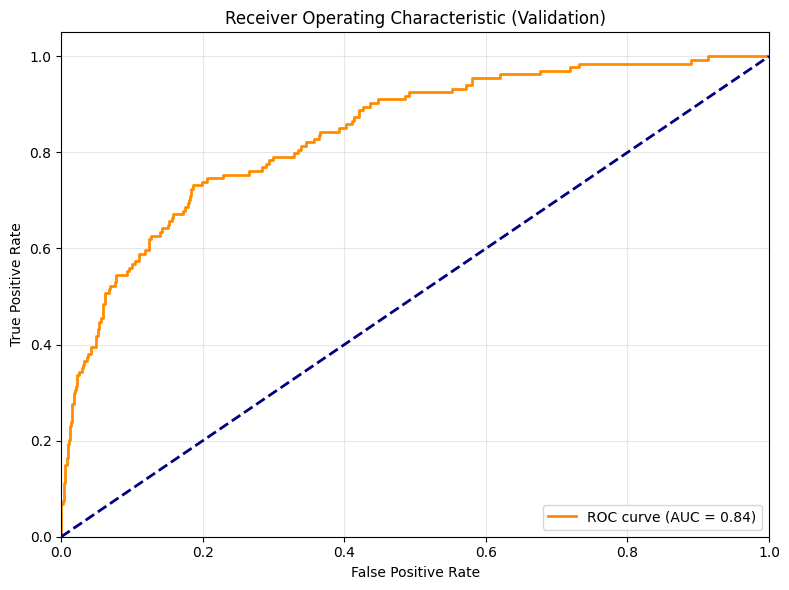

In [ ]:
# ----------------------- VALIDATION EVALUATION -----------------------

# Final validation predictions with best threshold
val_preds = (val_probs_ensemble >= best_threshold).astype(int)

# Calculate metrics
val_accuracy = accuracy_score(y_val, val_preds)
print(f"Validation Accuracy: {val_accuracy:.4f}")

print("\nValidation Classification Report:")
print(classification_report(y_val, val_preds))

# Confusion Matrix
cm = confusion_matrix(y_val, val_preds)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix for Validation Data')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.tight_layout()
plt.show()

# ROC Curve for Validation
fpr, tpr, _ = roc_curve(y_val, val_probs_ensemble)
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (Validation)')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# **Test Predictions and Evaluation: Saving Results and Comparing with Provided Labels**

Test predictions saved to 'predicted_test_labels.csv'

Comparing with provided test_labels.csv:
Test Accuracy: 0.8255

Test Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.92      0.89      4637
           1       0.65      0.51      0.57      1363

    accuracy                           0.83      6000
   macro avg       0.76      0.71      0.73      6000
weighted avg       0.82      0.83      0.82      6000



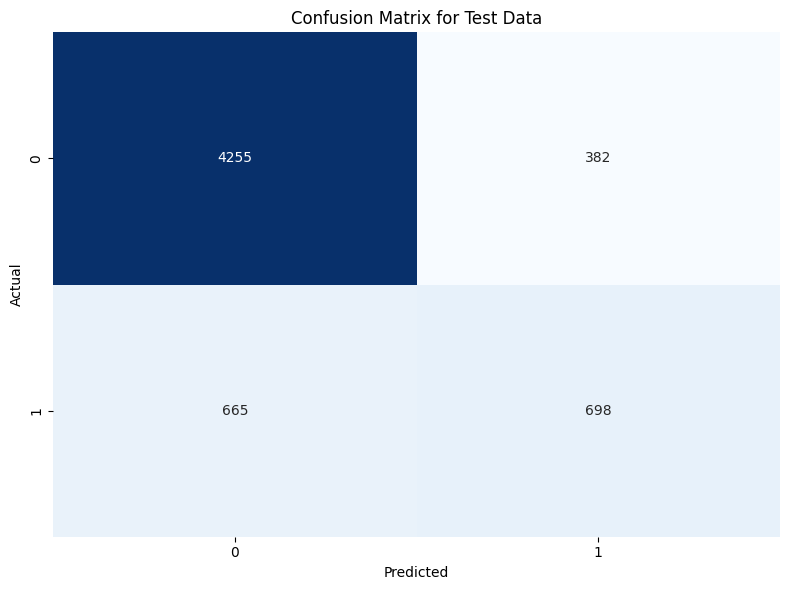

In [ ]:
# ----------------------- TEST PREDICTIONS -----------------------

# Apply best threshold to test predictions
test_preds = (test_probs_ensemble >= best_threshold).astype(int)

# Create test_labels.csv output
test_output = pd.DataFrame({
    'id': test_df['id'],
    'toxic': test_preds
})

# Save predictions to CSV
test_output.to_csv('/kaggle/working/predicted_test_labels.csv', index=False)
print("Test predictions saved to 'predicted_test_labels.csv'")

# Compare with provided test_labels.csv
if not test_labels_df.empty:
    print("\nComparing with provided test_labels.csv:")
    test_output_sorted = test_output.set_index('id')
    test_labels_sorted = test_labels_df.set_index('id')

    # Align indexes
    test_output_sorted, test_labels_sorted = test_output_sorted.align(test_labels_sorted, join='inner', axis=0)

    # Calculate metrics
    test_accuracy = accuracy_score(test_labels_sorted['toxic'], test_output_sorted['toxic'])
    print(f"Test Accuracy: {test_accuracy:.4f}")

    print("\nTest Classification Report:")
    print(classification_report(test_labels_sorted['toxic'], test_output_sorted['toxic']))

    # Confusion Matrix
    cm_test = confusion_matrix(test_labels_sorted['toxic'], test_output_sorted['toxic'])
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title('Confusion Matrix for Test Data')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.tight_layout()
    plt.show()

# **Long Short-Term Memory (LSTM)**

# **Implementing Long Short-Term Memory (LSTM)**

# **Setting Up GPU for Kaggle with TensorFlow**

In [ ]:
def setup_kaggle_gpu():
    """Simplified GPU setup for Kaggle environments."""
    # Check for GPUs using TensorFlow's built-in method
    gpu_devices = tf.config.list_physical_devices('GPU')

    if gpu_devices:
        print(f"Detected {len(gpu_devices)} GPU(s):")
        for device in gpu_devices:
            print(f"- {device.name}")
        return tf.distribute.OneDeviceStrategy(device="/gpu:0")

    print("No GPU detected - falling back to CPU")
    return tf.distribute.get_strategy()

# Initialize strategy
strategy = setup_kaggle_gpu()

# Verification
print("\nHardware Verification:")
print(f"TensorFlow version: {tf.__version__}")
print(f"Devices visible to TF: {tf.config.get_visible_devices()}")
print(f"Execution strategy: {strategy}")

No GPU detected - falling back to CPU

Hardware Verification:
TensorFlow version: 2.15.0
Devices visible to TF: [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')]
Execution strategy: <tensorflow.python.distribute.distribute_lib._DefaultDistributionStrategy object at 0x79f39ef1ba50>


# **Data Preparation for Deep Learning with LSTM**

In [ ]:
# ----------------------- DATA PREPARATION FOR DEEP LEARNING -----------------------

# Prepare text sequences for LSTM
print("Tokenizing and padding sequences...")
MAX_FEATURES = 100000  # Maximum vocab size
MAX_SEQUENCE_LENGTH = 256  # Max length of input sequences

# Initialize tokenizer
tokenizer = Tokenizer(num_words=MAX_FEATURES, oov_token="<OOV>")
tokenizer.fit_on_texts(train_df['cleaned_text'])

# Convert texts to sequences
X_train_seq = tokenizer.texts_to_sequences(train_df['cleaned_text'])
X_val_seq = tokenizer.texts_to_sequences(validation_translated['cleaned_text'])
X_test_seq = tokenizer.texts_to_sequences(test_translated['cleaned_text'])

# Pad sequences to ensure uniform length
X_train_pad = pad_sequences(X_train_seq, maxlen=MAX_SEQUENCE_LENGTH, padding='post', truncating='post')
X_val_pad = pad_sequences(X_val_seq, maxlen=MAX_SEQUENCE_LENGTH, padding='post', truncating='post')
X_test_pad = pad_sequences(X_test_seq, maxlen=MAX_SEQUENCE_LENGTH, padding='post', truncating='post')

print(f"Training sequence shape: {X_train_pad.shape}")
print(f"Validation sequence shape: {X_val_pad.shape}")
print(f"Test sequence shape: {X_test_pad.shape}")

# Prepare labels - all 6 dimensions for training
y_train = train_df.iloc[:, 2:8].values  # All 6 toxicity dimensions
y_val = validation_translated['toxic'].values  # Just binary toxic for validation

# Calculate class weights to address imbalance
class_weights_dict = {}
for i in range(6):  # For all 6 toxicity dimensions
    class_weights = class_weight.compute_class_weight('balanced',
                                                     classes=np.unique(train_df.iloc[:, 2+i]),
                                                     y=train_df.iloc[:, 2+i])
    class_weights_dict[i] = {0: class_weights[0], 1: class_weights[1]}

print("Class weights computed to handle imbalance")

Tokenizing and padding sequences...
Training sequence shape: (23473, 256)
Validation sequence shape: (840, 256)
Test sequence shape: (6000, 256)
Class weights computed to handle imbalance


# **FastText Embedding Setup for Text Data**

In [ ]:
# ----------------------- FASTTEXT EMBEDDING SETUP -----------------------

def load_fasttext_embeddings(word_index, embedding_file_path, embedding_dim=300):
    """Load FastText embeddings for the vocabulary."""
    print(f"Loading FastText embeddings from {embedding_file_path}")

    # Create initial embedding matrix with random values
    vocab_size = min(MAX_FEATURES, len(word_index) + 1)
    embedding_matrix = np.random.normal(0, 0.1, (vocab_size, embedding_dim))

    # Check if file exists, download if needed
    if not os.path.exists(embedding_file_path):
        print("Downloading FastText English embeddings...")
        fasttext_url = "https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.en.300.bin.gz"
        # You can add download code here if needed
        raise FileNotFoundError(f"Please download FastText embeddings from {fasttext_url}")

    # Load embeddings (binary format)
    import io
    import gensim

    fasttext_model = gensim.models.FastText.load_fasttext_format(embedding_file_path)

    # Populate embedding matrix
    words_found = 0
    for word, i in word_index.items():
        if i >= MAX_FEATURES:
            continue
        try:
            embedding_vector = fasttext_model.wv[word]
            embedding_matrix[i] = embedding_vector
            words_found += 1
        except KeyError:
            pass  # Word not in embedding vocabulary

    print(f"Found {words_found} words with embeddings of {len(word_index)} total words")
    return embedding_matrix

# Path to FastText embeddings - replace with your path
FASTTEXT_PATH = '/content/drive/MyDrive/dataset/bin/cc.en.300.bin'  # Update with actual path
EMBEDDING_DIM = 300  # FastText dimension

try:
    embedding_matrix = load_fasttext_embeddings(tokenizer.word_index, FASTTEXT_PATH, EMBEDDING_DIM)
    print("FastText embeddings loaded successfully")
    use_pretrained_embeddings = True
except Exception as e:
    print(f"Error loading FastText embeddings: {e}")
    print("Using randomly initialized embeddings instead")
    vocab_size = min(MAX_FEATURES, len(tokenizer.word_index) + 1)
    embedding_matrix = np.random.normal(0, 0.1, (vocab_size, EMBEDDING_DIM))
    use_pretrained_embeddings = False

Loading FastText embeddings from /content/drive/MyDrive/dataset/bin/cc.en.300.bin
Error loading FastText embeddings: Please download FastText embeddings from https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.en.300.bin.gz
Using randomly initialized embeddings instead


# **Building the LSTM Model with FastText Embeddings**

In [ ]:
# ----------------------- BUILD THE LSTM MODEL -----------------------

def build_lstm_model(strategy, embedding_matrix):
    """Build the LSTM model with FastText embeddings and feature augmentation."""
    with strategy.scope():
        # Text input branch
        sequence_input = Input(shape=(MAX_SEQUENCE_LENGTH,), dtype='int32', name='text_input')

        # Embedding layer
        if use_pretrained_embeddings:
            embedding_layer = Embedding(
                input_dim=min(MAX_FEATURES, len(tokenizer.word_index) + 1),
                output_dim=EMBEDDING_DIM,
                weights=[embedding_matrix],
                input_length=MAX_SEQUENCE_LENGTH,
                trainable=False,  # Freeze embeddings
                name='word_embedding'
            )
        else:
            embedding_layer = Embedding(
                input_dim=min(MAX_FEATURES, len(tokenizer.word_index) + 1),
                output_dim=EMBEDDING_DIM,
                input_length=MAX_SEQUENCE_LENGTH,
                name='word_embedding'
            )

        x = embedding_layer(sequence_input)
        x = SpatialDropout1D(0.2)(x)

        # Bidirectional LSTM layers
        x = Bidirectional(LSTM(128, return_sequences=True,
                               dropout=0.1, recurrent_dropout=0.1))(x)
        x = Bidirectional(LSTM(64, return_sequences=True,
                               dropout=0.1, recurrent_dropout=0.1))(x)

        # Apply pooling to get a fixed-size representation
        avg_pool = GlobalAveragePooling1D()(x)
        max_pool = GlobalMaxPooling1D()(x)

        # Concatenate the pooled features
        text_features = concatenate([avg_pool, max_pool])

        # Statistical features input branch
        statistical_input = Input(shape=(train_features_scaled.shape[1],), name='statistical_features')

        # Combine text and statistical features
        combined = concatenate([text_features, statistical_input])

        # Dense layers for shared representation
        x = Dense(256, activation='relu', kernel_initializer=HeNormal())(combined)
        x = BatchNormalization()(x)
        x = Dropout(0.3)(x)
        x = Dense(128, activation='relu', kernel_initializer=HeNormal())(x)
        x = BatchNormalization()(x)
        x = Dropout(0.3)(x)

        # Multiple outputs for multi-task learning (all 6 toxicity dimensions)
        outputs = []
        toxicity_types = ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']

        for i, toxicity_type in enumerate(toxicity_types):
            output = Dense(32, activation='relu', kernel_initializer=HeNormal(),
                           name=f'{toxicity_type}_dense')(x)
            output = Dense(1, activation='sigmoid', name=f'{toxicity_type}_output')(output)
            outputs.append(output)

        # Create model
        model = Model(inputs=[sequence_input, statistical_input], outputs=outputs)

        # Custom loss weights (prioritizing 'toxic' slightly higher)
        loss_weights = {'toxic_output': 1.2, 'abusive_output': 1.0, 'vulgar_output': 1.0,
                       'menace_output': 1.0, 'offense_output': 1.0, 'bigotry_output': 1.0}

        # Focal loss to handle class imbalance
        losses = {f'{toxicity_type}_output': BinaryFocalLoss(gamma=2.0, pos_weight=0.25)
         for toxicity_type in toxicity_types}

        # Compile model with Adam optimizer
        model.compile(
            optimizer=Adam(learning_rate=1e-3),
            loss=losses,
            loss_weights=loss_weights,
            metrics=['accuracy', tf.keras.metrics.AUC(), tf.keras.metrics.Precision(), tf.keras.metrics.Recall()]
        )

        return model

# Build model with GPU strategy
print("Building LSTM model...")
model = build_lstm_model(strategy, embedding_matrix)
model.summary()

Building LSTM model...
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 text_input (InputLayer)     [(None, 256)]                0         []                            
                                                                                                  
 word_embedding (Embedding)  (None, 256, 300)             1820250   ['text_input[0][0]']          
                                                          0                                       
                                                                                                  
 spatial_dropout1d (Spatial  (None, 256, 300)             0         ['word_embedding[0][0]']      
 Dropout1D)                                                                                       
                                                                       

# **Training Callbacks for Model Optimization**

In [ ]:
# ----------------------- TRAINING CALLBACKS -----------------------

# Define callbacks
checkpoint = ModelCheckpoint(
    'best_lstm_model.h5',
    monitor='val_toxic_output_accuracy',
    save_best_only=True,
    mode='max',
    verbose=1
)

early_stopping = EarlyStopping(
    monitor='val_toxic_output_accuracy',
    patience=5,
    restore_best_weights=True,
    mode='max',
    verbose=1
)

reduce_lr = ReduceLROnPlateau(
    monitor='val_toxic_output_accuracy',
    factor=0.5,
    patience=2,
    min_lr=1e-6,
    mode='max',
    verbose=1
)


# **Training the Model with Multi-task Learning**

In [ ]:
# ----------------------- TRAIN THE MODEL -----------------------

# Prepare data for training
train_inputs = [X_train_pad, train_features_scaled]
train_outputs = [train_df[col].values for col in ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']]

validation_inputs = [X_val_pad, validation_features_scaled]
# For validation, we're using lists of the same toxicity label to match model output structure
validation_outputs = [validation_translated['toxic'].values for _ in range(6)]

# Create output name mapping for easier handling during training
output_names = [f'{toxicity_type}_output' for toxicity_type in ['toxic', 'abusive', 'vulgar', 'menace', 'offense', 'bigotry']]
train_outputs_dict = {name: train_outputs[i] for i, name in enumerate(output_names)}
validation_outputs_dict = {name: validation_outputs[i] for i, name in enumerate(output_names)}

print("Starting model training...")
BATCH_SIZE = 64 * max(1, strategy.num_replicas_in_sync)  # Scale batch size with GPU count
EPOCHS = 3

history = model.fit(
    train_inputs,
    train_outputs_dict,
    validation_data=(validation_inputs, validation_outputs_dict),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=[checkpoint, early_stopping, reduce_lr],
    verbose=1
)


Starting model training...
Epoch 1/3
367/367 [==============================] - ETA: 0s - loss: 0.1714 - toxic_output_loss: 0.0485 - abusive_output_loss: 0.0092 - vulgar_output_loss: 0.0321 - menace_output_loss: 0.0210 - offense_output_loss: 0.0317 - bigotry_output_loss: 0.0192 - toxic_output_accuracy: 0.8935 - toxic_output_auc: 0.6831 - toxic_output_precision: 0.3115 - toxic_output_recall: 0.1148 - abusive_output_accuracy: 0.9875 - abusive_output_auc: 0.6553 - abusive_output_precision: 0.0530 - abusive_output_recall: 0.0398 - vulgar_output_accuracy: 0.9353 - vulgar_output_auc: 0.6937 - vulgar_output_precision: 0.2155 - vulgar_output_recall: 0.0722 - menace_output_accuracy: 0.9736 - menace_output_auc: 0.4258 - menace_output_precision: 0.0018 - menace_output_recall: 0.0152 - offense_output_accuracy: 0.9415 - offense_output_auc: 0.6740 - offense_output_precision: 0.1854 - offense_output_recall: 0.0574 - bigotry_output_accuracy: 0.9730 - bigotry_output_auc: 0.5775 - bigotry_output_precisi

# **Evaluate and Visualize Model Performance**

27/27 [==============================] - 5s 147ms/step

Validation Performance Metrics:
Accuracy: 0.8607
Precision: 0.9474
Recall: 0.1343
F1 Score: 0.2353
188/188 [==============================] - 29s 152ms/step
Predictions saved to 'lstm_submission.csv'


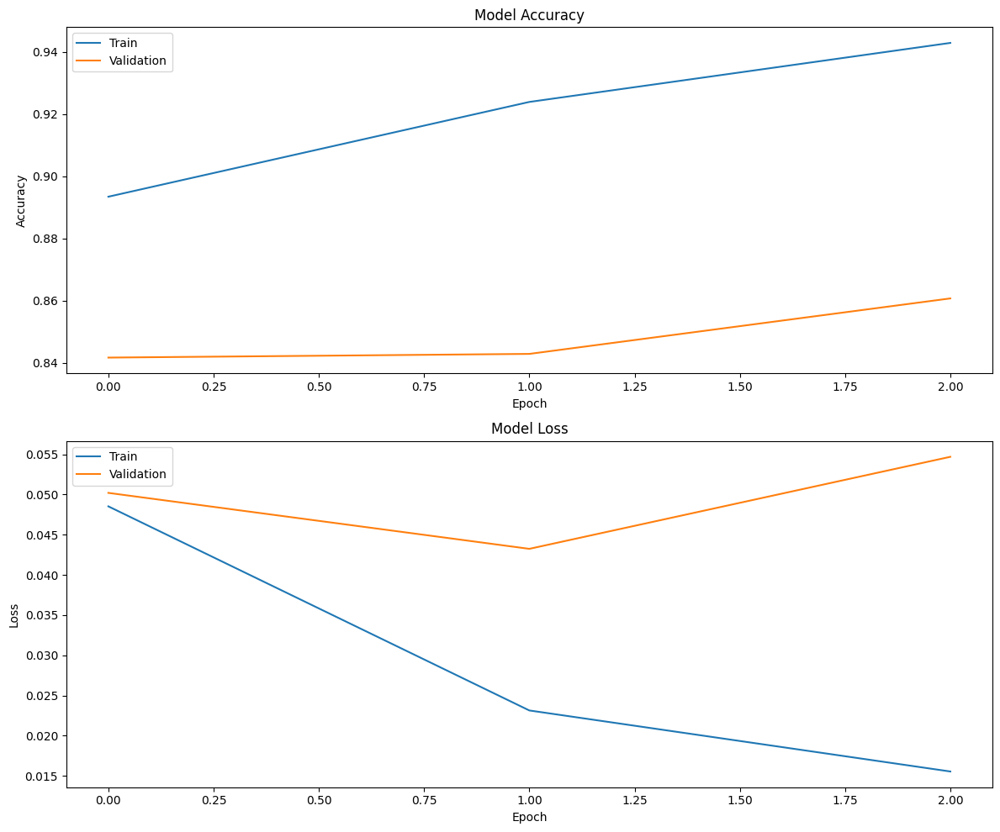

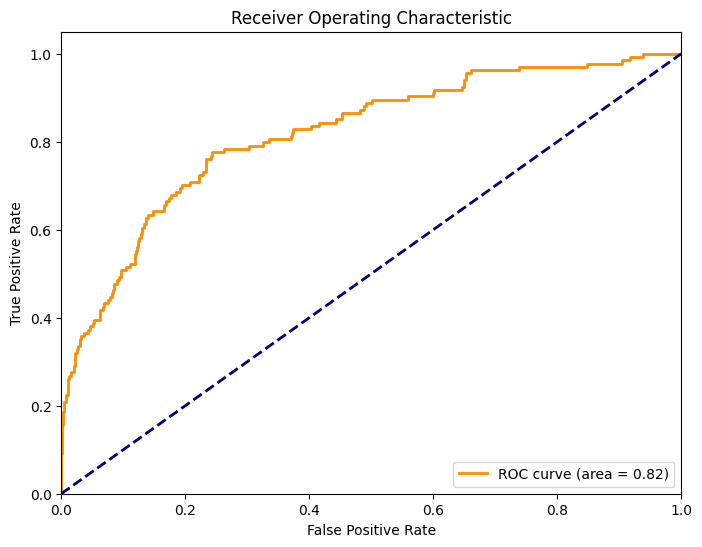

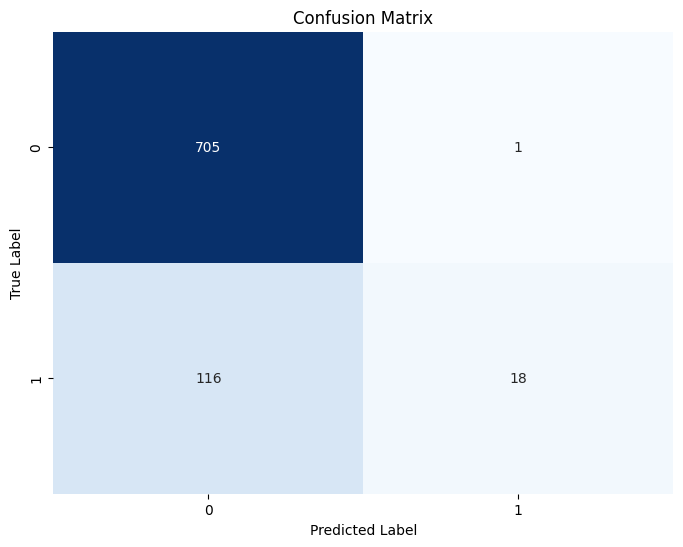

In [ ]:
# ----------------------- EVALUATE AND VISUALIZE -----------------------

# Load best model
model.load_weights('best_lstm_model.h5')

# Generate predictions on validation data
val_predictions = model.predict(validation_inputs)
# Extract just the toxic predictions (first output)
val_toxic_pred = val_predictions[0].ravel()
val_toxic_pred_binary = (val_toxic_pred > 0.5).astype(int)

# Calculate metrics for the validation set
val_accuracy = accuracy_score(validation_translated['toxic'], val_toxic_pred_binary)
val_precision = precision_score(validation_translated['toxic'], val_toxic_pred_binary)
val_recall = recall_score(validation_translated['toxic'], val_toxic_pred_binary)
val_f1 = f1_score(validation_translated['toxic'], val_toxic_pred_binary)

print("\nValidation Performance Metrics:")
print(f"Accuracy: {val_accuracy:.4f}")
print(f"Precision: {val_precision:.4f}")
print(f"Recall: {val_recall:.4f}")
print(f"F1 Score: {val_f1:.4f}")

# Generate predictions on test data
test_predictions = model.predict([X_test_pad, test_features_scaled])
# Extract just the toxic predictions (first output)
test_toxic_pred = test_predictions[0].ravel()
test_toxic_pred_binary = (test_toxic_pred > 0.5).astype(int)

# Create submission dataframe
submission_df = pd.DataFrame({
    'id': test_translated['id'],
    'toxic_prediction': test_toxic_pred,
    'toxic': test_toxic_pred_binary
})

# Save submission
submission_df.to_csv('lstm_submission.csv', index=False)
print("Predictions saved to 'lstm_submission.csv'")

# Visualize training history
def plot_training_history(history):
    """Plot training & validation accuracy and loss values."""
    fig, axes = plt.subplots(2, 1, figsize=(12, 10))

    # Plot accuracy
    axes[0].plot(history.history['toxic_output_accuracy'])
    axes[0].plot(history.history['val_toxic_output_accuracy'])
    axes[0].set_title('Model Accuracy')
    axes[0].set_ylabel('Accuracy')
    axes[0].set_xlabel('Epoch')
    axes[0].legend(['Train', 'Validation'], loc='upper left')

    # Plot loss
    axes[1].plot(history.history['toxic_output_loss'])
    axes[1].plot(history.history['val_toxic_output_loss'])
    axes[1].set_title('Model Loss')
    axes[1].set_ylabel('Loss')
    axes[1].set_xlabel('Epoch')
    axes[1].legend(['Train', 'Validation'], loc='upper left')

    plt.tight_layout()
    plt.savefig('lstm_training_history.png')
    plt.show()

# Plot ROC curve for validation data
def plot_roc_curve(y_true, y_pred):
    """Plot ROC curve."""
    fpr, tpr, _ = roc_curve(y_true, y_pred)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.savefig('lstm_roc_curve.png')
    plt.show()

# Plot confusion matrix
def plot_confusion_matrix(y_true, y_pred):
    """Plot confusion matrix."""
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.savefig('lstm_confusion_matrix.png')
    plt.show()

# Generate visualizations
plot_training_history(history)
plot_roc_curve(validation_translated['toxic'], val_toxic_pred)
plot_confusion_matrix(validation_translated['toxic'], val_toxic_pred_binary)

# **Test Evaluation and Visualize Model Performance**

Loading the best trained model...
Loading ground truth test data...
Generating predictions on test data...
188/188 [==============================] - 29s 156ms/step

Evaluating test performance...


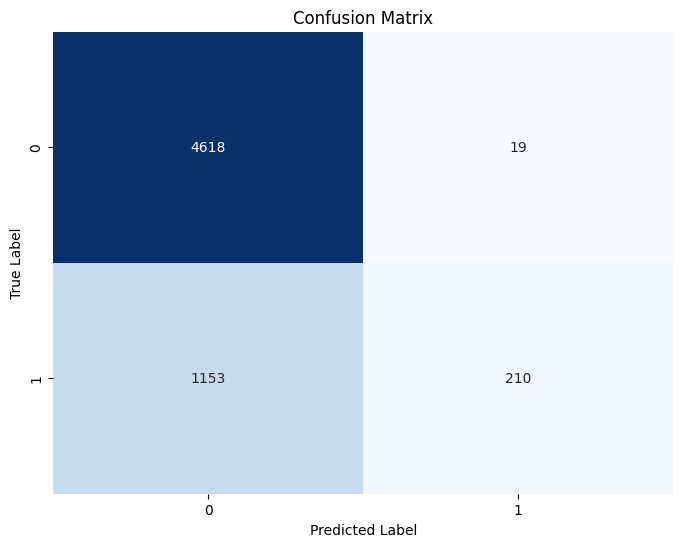

In [ ]:
# ----------------------- TEST EVALUATION FOR LSTM MODEL -----------------------

# Load best model
print("Loading the best trained model...")
model.load_weights('best_lstm_model.h5')

# Loading ground truth
print("Loading ground truth test data...")
test_ground_truth = test_labels_df

# Generating predictions
print("Generating predictions on test data...")
test_predictions = model.predict([X_test_pad, test_features_scaled])
test_toxic_probs = test_predictions[0].ravel()
test_toxic_preds = (test_toxic_probs > 0.5).astype(int)

# Performance evaluation
print("\nEvaluating test performance...")
test_accuracy = accuracy_score(test_ground_truth['toxic'], test_toxic_preds)

#Confusion matrics
cm = confusion_matrix(test_ground_truth['toxic'], test_toxic_preds)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.title('Confusion Matrix')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()